<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Row-ranked-save-to-csv" data-toc-modified-id="Row-ranked-save-to-csv-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Row ranked save to csv</a></span></li><li><span><a href="#save-ranked-lists--to-csv" data-toc-modified-id="save-ranked-lists--to-csv-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>save ranked lists  to csv</a></span></li></ul></div>

In [1]:
%load_ext autoreload
%autoreload 2
from matplotlib.lines import Line2D
import qgrid
import matplotlib.pyplot as plt
import matplotlib as mpl
import networkx as nx
import numpy as np
import pandas as pd
import pickle
import os
import re
import itertools as itr
from enm.visualize.visualize import plot_correlation_density, plot_vector, plot_lambda_collectivity
from enm.enm import Enm
from enm.utils import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
os.chdir('../')

In [11]:
with open(f'data/interim/pcc_0909/pcc.pickle','rb') as f:
    e_pcc = pickle.load(f)

In [56]:
#e_pcc.get_prs(no_diag=False)
#e_pcc.get_rwr_mat()

@> Calculating covariance matrix
@> Covariance matrix calculated in 0.0s.
@> Calculating perturbation response
@> Perturbation response matrix calculated in 0.2s.
@> Perturbation response scanning completed in 1.2s.


In [ ]:
e_pcc.get_prs()
effector_pcc = e_pcc.df.loc[e_pcc.df.eff>np.quantile(e_pcc.df.eff,0.99)]
sensors_pcc = e_pcc.df.loc[e_pcc.df.sens>np.quantile(e_pcc.df.sens,0.99)]

In [ ]:
goea, geneid2name = create_goea(gaf = 'data/raw/ontology/sgd.gaf', obo_fname='data/raw/ontology/go-basic.obo', background='data/interim/costanzo_gc_bg.tsv', sgd_info_tab = 'data/raw/ontology/SGD_features.tab')

ranked_goa_results_rows = []
for i in tqdm(e_pcc.nodes):
    goa_df = query_goatools(e_pcc.df.loc[e_pcc.df.orf_name.isin(e_pcc.prs_mat_df.loc[i,:].sort_values(ascending=False)[:50].index)],
               goea,geneid2name)
    ranked_goa_results_rows.append(goa_df)

rwr_ranked_goa_results_rows = []
for i in tqdm(e_pcc.nodes):
    goa_df = query_goatools(e_pcc.df.loc[e_pcc.df.orf_name.isin(e_pcc.rwr_mat_df.loc[i,:].sort_values(ascending=False)[:50].index)],
               goea,geneid2name)
    rwr_ranked_goa_results_rows.append(goa_df)
    


data/raw/ontology/go-basic.obo: fmt(1.2) rel(2019-06-01) 47,444 GO Terms
HMS:0:00:02.265573 119,640 annotations READ: data/raw/ontology/sgd.gaf 


  0%|          | 0/5183 [00:00<?, ?it/s]


Load BP Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact
 84%  3,934 of  4,660 population items found in association

Load CC Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact
 89%  4,168 of  4,660 population items found in association

Load MF Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact
 73%  3,399 of  4,660 population items found in association

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh


/home/oma21/miniconda3/envs/enm/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm



Run CC Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      54 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run MF Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 1,727 uncorrected p-values using fisher_scipy_stats


  0%|          | 1/5183 [00:04<5:58:48,  4.15s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 2/5183 [00:07<5:42:37,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 3/5183 [00:11<5:29:06,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 84%     37 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 4/5183 [00:15<5:35:22,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 80%     36 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 5/5183 [00:18<5:23:08,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 6/5183 [00:22<5:16:08,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 7/5183 [00:25<5:11:41,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 8/5183 [00:29<5:09:44,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 9/5183 [00:32<5:06:27,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 10/5183 [00:36<5:04:12,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 11/5183 [00:39<5:02:21,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     110 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 12/5183 [00:42<5:01:15,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 13/5183 [00:46<5:01:01,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 14/5183 [00:49<5:00:50,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 15/5183 [00:53<5:01:01,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 16/5183 [00:56<5:01:51,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 17/5183 [01:00<5:01:00,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 18/5183 [01:04<5:14:28,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 19/5183 [01:08<5:14:59,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 20/5183 [01:11<5:11:54,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 21/5183 [01:15<5:07:06,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 22/5183 [01:18<5:04:39,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 23/5183 [01:22<5:03:07,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 24/5183 [01:25<5:02:18,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 25/5183 [01:29<5:00:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 26/5183 [01:32<4:58:53,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 27/5183 [01:36<5:03:02,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 73%     27 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     27 of     37 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 28/5183 [01:39<5:00:04,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     24 of     37 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 29/5183 [01:42<4:58:03,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 30/5183 [01:46<4:57:15,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 31/5183 [01:50<5:13:33,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 32/5183 [01:54<5:11:24,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 33/5183 [01:58<5:19:29,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 34/5183 [02:01<5:20:43,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 35/5183 [02:05<5:21:22,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 36/5183 [02:09<5:22:04,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 37/5183 [02:13<5:21:13,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 38/5183 [02:16<5:20:43,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 39/5183 [02:20<5:20:48,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 40/5183 [02:24<5:21:41,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 76%     31 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 41/5183 [02:27<5:19:27,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     28 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 81%     34 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 42/5183 [02:31<5:18:08,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     28 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 43/5183 [02:35<5:19:23,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 44/5183 [02:39<5:36:48,  3.93s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 45/5183 [02:43<5:31:31,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 46/5183 [02:47<5:28:20,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 81%     35 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 47/5183 [02:50<5:24:22,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 76%     31 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 48/5183 [02:54<5:21:55,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     21 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 81%     35 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 49/5183 [02:58<5:20:08,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     29 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 50/5183 [03:02<5:21:27,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 51/5183 [03:05<5:21:09,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 81%     35 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 52/5183 [03:10<5:36:43,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 76%     31 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 53/5183 [03:13<5:27:42,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     26 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 81%     35 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 54/5183 [03:17<5:18:01,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 55/5183 [03:20<5:10:41,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 56/5183 [03:24<5:06:34,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 57/5183 [03:27<5:03:46,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 58/5183 [03:31<5:19:58,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 59/5183 [03:35<5:11:45,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     24 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 60/5183 [03:38<5:06:30,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 61/5183 [03:42<5:01:52,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 62/5183 [03:45<5:03:58,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 63/5183 [03:49<5:01:25,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 64/5183 [03:52<4:59:31,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 65/5183 [03:56<4:59:34,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 66/5183 [03:59<4:59:37,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 67/5183 [04:03<4:57:10,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 68/5183 [04:06<4:58:26,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 69/5183 [04:10<4:58:23,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 70/5183 [04:13<5:00:15,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 71/5183 [04:17<4:58:48,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 72/5183 [04:21<5:12:09,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 73/5183 [04:24<5:10:52,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 74/5183 [04:28<5:05:20,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 75/5183 [04:31<5:01:19,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 76/5183 [04:35<4:58:51,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 77/5183 [04:38<4:57:32,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 78/5183 [04:42<4:56:29,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 79/5183 [04:45<4:54:45,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      52 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 80/5183 [04:48<4:53:06,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 81/5183 [04:52<4:53:53,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 82/5183 [04:55<4:53:41,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 83/5183 [04:59<4:52:27,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      47 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 84/5183 [05:02<4:50:57,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 85/5183 [05:06<5:07:01,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 86/5183 [05:10<5:02:54,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 87/5183 [05:13<4:59:47,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      47 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 88/5183 [05:17<5:01:39,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      45 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 89/5183 [05:20<4:59:34,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 90/5183 [05:24<4:56:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 91/5183 [05:27<4:56:21,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 92/5183 [05:31<4:53:03,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 93/5183 [05:34<4:53:37,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 94/5183 [05:37<4:53:11,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 95/5183 [05:42<5:19:04,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 96/5183 [05:45<5:11:00,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 97/5183 [05:49<5:05:31,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 98/5183 [05:52<5:00:12,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 99/5183 [05:56<5:12:34,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      51 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 100/5183 [06:00<5:06:06,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      52 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 101/5183 [06:03<5:02:24,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 102/5183 [06:07<4:58:27,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 103/5183 [06:10<5:00:45,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 104/5183 [06:14<4:57:19,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      52 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 105/5183 [06:17<4:56:05,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      33 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 106/5183 [06:21<4:58:38,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      18 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 107/5183 [06:24<4:57:33,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      47 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 108/5183 [06:28<4:54:30,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 109/5183 [06:31<4:54:36,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 110/5183 [06:34<4:53:01,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 111/5183 [06:38<4:52:14,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 112/5183 [06:41<4:55:29,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 113/5183 [06:46<5:11:08,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      61 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 114/5183 [06:49<5:04:39,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      45 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 115/5183 [06:52<5:00:06,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 116/5183 [06:56<4:56:24,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 117/5183 [06:59<4:54:05,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 80%     37 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 118/5183 [07:03<4:52:48,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 119/5183 [07:06<4:51:06,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 120/5183 [07:10<4:51:00,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 121/5183 [07:13<4:55:59,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 122/5183 [07:17<4:52:45,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 123/5183 [07:20<4:50:50,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      40 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 124/5183 [07:23<4:49:55,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 125/5183 [07:27<4:49:11,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 126/5183 [07:30<4:48:16,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 127/5183 [07:34<5:04:12,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 128/5183 [07:38<4:59:59,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 83%     38 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 129/5183 [07:41<4:57:15,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 130/5183 [07:45<4:53:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 131/5183 [07:48<4:52:22,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 132/5183 [07:51<4:51:27,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 133/5183 [07:55<4:50:16,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 134/5183 [07:58<4:48:30,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 135/5183 [08:02<4:47:29,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 136/5183 [08:05<4:48:12,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 137/5183 [08:09<4:50:39,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 138/5183 [08:12<4:49:38,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 139/5183 [08:16<4:53:42,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 140/5183 [08:20<5:15:17,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 141/5183 [08:23<5:08:17,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 142/5183 [08:27<5:03:21,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 143/5183 [08:30<4:59:22,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 144/5183 [08:34<4:59:16,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 145/5183 [08:37<4:58:12,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 146/5183 [08:41<4:56:21,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 147/5183 [08:44<4:54:47,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 148/5183 [08:48<4:55:12,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 149/5183 [08:51<4:54:09,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     193 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 150/5183 [08:55<4:51:37,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 151/5183 [08:58<4:49:16,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 152/5183 [09:02<4:49:41,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 153/5183 [09:05<4:50:00,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 154/5183 [09:09<5:05:13,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 155/5183 [09:13<4:58:37,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 156/5183 [09:16<4:55:18,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 157/5183 [09:19<4:52:13,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 158/5183 [09:23<4:55:05,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 159/5183 [09:26<4:51:40,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 160/5183 [09:30<4:50:00,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 161/5183 [09:33<4:53:13,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 162/5183 [09:37<4:56:25,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 163/5183 [09:40<4:52:33,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 164/5183 [09:44<4:51:38,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 165/5183 [09:47<4:50:51,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 166/5183 [09:51<4:51:34,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 167/5183 [09:55<5:06:26,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 168/5183 [09:58<5:00:33,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     30 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 169/5183 [10:02<4:56:47,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 170/5183 [10:05<4:53:08,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 171/5183 [10:09<4:50:19,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 172/5183 [10:12<4:48:51,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     23 of     26 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 25 IDs ...100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     25 of     25 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 173/5183 [10:15<4:45:50,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     23 of     25 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 24 IDs ...100%     24 of     24 study items found in association
100%     24 of     24 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     24 of     24 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 174/5183 [10:19<4:43:42,  3.40s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     23 of     24 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 25 IDs ...100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     25 of     25 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 175/5183 [10:22<4:41:58,  3.38s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     23 of     25 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 176/5183 [10:26<4:42:27,  3.38s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     25 of     28 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 25 IDs ...100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     25 of     25 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 177/5183 [10:29<4:43:16,  3.40s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     23 of     25 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 178/5183 [10:32<4:43:10,  3.39s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     25 of     26 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 179/5183 [10:36<4:43:00,  3.39s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 180/5183 [10:39<4:42:09,  3.38s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     25 of     26 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 181/5183 [10:43<4:59:12,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ...100%     29 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     29 of     29 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 182/5183 [10:47<4:54:05,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     27 of     29 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 183/5183 [10:50<4:51:10,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 184/5183 [10:53<4:50:27,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 185/5183 [10:57<4:50:19,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      64 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 186/5183 [11:00<4:51:45,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 187/5183 [11:04<4:49:27,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 188/5183 [11:07<4:49:17,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 189/5183 [11:11<4:49:10,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 190/5183 [11:14<4:48:31,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 191/5183 [11:18<4:47:43,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 192/5183 [11:21<4:48:37,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 193/5183 [11:25<4:48:43,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      64 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 194/5183 [11:29<5:03:49,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 195/5183 [11:32<4:59:43,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     24 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 72%     33 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 196/5183 [11:36<4:56:52,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     28 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 197/5183 [11:39<4:53:19,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     23 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 78%     32 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     32 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 198/5183 [11:43<4:51:39,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     26 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 199/5183 [11:46<4:51:06,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ... 97%     28 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     28 of     29 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 200/5183 [11:50<4:48:23,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     27 of     29 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 201/5183 [11:53<4:48:12,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 202/5183 [11:57<4:52:38,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 203/5183 [12:00<4:49:23,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 204/5183 [12:04<4:48:59,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 205/5183 [12:07<4:48:53,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 206/5183 [12:10<4:48:54,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 207/5183 [12:14<4:47:38,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 208/5183 [12:18<5:03:47,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 209/5183 [12:21<4:58:17,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 210/5183 [12:25<4:54:34,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 211/5183 [12:28<4:51:01,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 212/5183 [12:32<4:50:50,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 213/5183 [12:35<4:49:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 214/5183 [12:39<4:47:34,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 215/5183 [12:42<4:46:30,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 216/5183 [12:46<4:47:49,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 217/5183 [12:49<4:46:15,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 218/5183 [12:53<4:46:17,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 219/5183 [12:56<4:45:00,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 220/5183 [12:59<4:46:52,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 221/5183 [13:04<5:01:52,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 222/5183 [13:07<4:57:21,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 223/5183 [13:11<4:55:01,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 224/5183 [13:14<4:53:05,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 225/5183 [13:18<4:52:50,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 226/5183 [13:21<4:50:32,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 227/5183 [13:24<4:48:08,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 228/5183 [13:28<4:46:26,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 229/5183 [13:31<4:45:10,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 230/5183 [13:35<4:44:14,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 231/5183 [13:38<4:44:36,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 232/5183 [13:42<4:45:12,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 233/5183 [13:45<4:44:52,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     31 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 234/5183 [13:49<4:44:54,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 235/5183 [13:53<4:58:42,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 236/5183 [13:56<4:56:16,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 237/5183 [13:59<4:51:37,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 238/5183 [14:03<4:48:01,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 239/5183 [14:06<4:46:21,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     185 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      43 GO terms found significant (< 0.05=alpha) ( 43 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 240/5183 [14:10<4:47:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 241/5183 [14:13<4:44:58,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 242/5183 [14:17<4:44:37,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     30 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 243/5183 [14:20<4:43:08,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     25 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 244/5183 [14:24<4:43:47,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     26 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 245/5183 [14:27<4:44:12,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 246/5183 [14:30<4:44:51,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 247/5183 [14:34<4:44:07,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     29 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 248/5183 [14:37<4:43:57,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     31 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 249/5183 [14:42<5:06:17,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     26 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 250/5183 [14:45<4:58:18,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 251/5183 [14:49<4:51:43,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     27 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 252/5183 [14:52<4:48:45,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 253/5183 [14:55<4:47:35,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 254/5183 [14:59<4:44:31,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 255/5183 [15:02<4:42:30,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 256/5183 [15:06<4:41:02,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     27 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 257/5183 [15:09<4:41:51,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 258/5183 [15:12<4:40:46,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 259/5183 [15:16<4:40:07,  3.41s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 260/5183 [15:20<4:51:02,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 261/5183 [15:23<4:54:59,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 262/5183 [15:27<4:57:30,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     25 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 263/5183 [15:31<5:14:31,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     25 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 264/5183 [15:35<5:13:05,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     28 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 265/5183 [15:39<5:04:43,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 266/5183 [15:42<4:57:22,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 267/5183 [15:46<4:53:06,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 268/5183 [15:49<4:54:20,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 269/5183 [15:53<4:50:27,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     28 of     38 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 270/5183 [15:56<4:47:24,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 271/5183 [15:59<4:44:37,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     27 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 272/5183 [16:03<4:42:33,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 273/5183 [16:06<4:41:51,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 274/5183 [16:10<4:40:52,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     27 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     179 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 275/5183 [16:13<4:41:03,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 276/5183 [16:16<4:39:52,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      41 GO terms found significant (< 0.05=alpha) ( 41 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 277/5183 [16:21<4:56:02,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 278/5183 [16:24<4:51:36,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     27 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 279/5183 [16:27<4:47:59,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 280/5183 [16:31<4:44:15,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     37 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 281/5183 [16:34<4:43:44,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 282/5183 [16:38<4:42:31,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     25 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 283/5183 [16:41<4:41:21,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 284/5183 [16:44<4:39:23,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 285/5183 [16:48<4:38:54,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     29 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      43 GO terms found significant (< 0.05=alpha) ( 43 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 286/5183 [16:51<4:39:23,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      40 GO terms found significant (< 0.05=alpha) ( 40 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 287/5183 [16:55<4:39:35,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 288/5183 [16:58<4:39:37,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 289/5183 [17:02<4:39:30,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 290/5183 [17:06<4:55:52,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 291/5183 [17:09<4:51:28,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 292/5183 [17:13<4:48:54,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 293/5183 [17:16<4:46:31,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     25 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 294/5183 [17:20<4:47:02,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     25 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 295/5183 [17:23<4:47:11,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 296/5183 [17:27<4:48:36,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 297/5183 [17:30<4:49:21,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     175 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 298/5183 [17:34<4:56:23,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     178 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 299/5183 [17:38<4:59:29,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 300/5183 [17:42<5:00:01,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 301/5183 [17:45<5:00:18,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 86%     36 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 302/5183 [17:49<4:59:13,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 303/5183 [17:52<4:53:02,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     166 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 304/5183 [17:56<5:03:10,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     161 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 305/5183 [18:00<4:54:46,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     181 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 306/5183 [18:03<4:50:10,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 307/5183 [18:07<4:46:47,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 308/5183 [18:10<4:47:47,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 67%     31 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 309/5183 [18:14<4:45:10,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     23 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 77%     34 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 310/5183 [18:17<4:43:08,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     26 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 311/5183 [18:21<4:43:30,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 312/5183 [18:24<4:46:30,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 313/5183 [18:28<4:45:17,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 314/5183 [18:31<4:42:02,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 315/5183 [18:35<4:43:55,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 87%     39 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     166 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 316/5183 [18:38<4:43:30,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     180 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 317/5183 [18:42<4:41:55,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 318/5183 [18:46<4:55:50,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 319/5183 [18:49<4:52:35,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 320/5183 [18:53<4:48:34,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 321/5183 [18:56<4:46:40,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 322/5183 [18:59<4:43:46,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 323/5183 [19:03<4:42:02,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 324/5183 [19:06<4:40:38,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 325/5183 [19:10<4:39:31,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 326/5183 [19:13<4:38:42,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 327/5183 [19:17<4:49:03,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 328/5183 [19:21<4:53:33,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 329/5183 [19:25<4:55:18,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 330/5183 [19:28<4:56:40,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 331/5183 [19:32<4:58:02,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 332/5183 [19:36<5:16:46,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 333/5183 [19:40<5:12:40,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 334/5183 [19:44<5:08:12,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 335/5183 [19:48<5:04:28,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 336/5183 [19:51<4:56:18,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     28 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 337/5183 [19:54<4:51:40,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 338/5183 [19:58<4:47:18,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 339/5183 [20:01<4:44:07,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     28 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 340/5183 [20:05<4:41:41,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 341/5183 [20:08<4:39:26,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 84%     37 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 342/5183 [20:11<4:36:49,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     25 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 343/5183 [20:15<4:35:39,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 344/5183 [20:18<4:36:57,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 345/5183 [20:22<4:51:41,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 346/5183 [20:26<4:45:28,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 347/5183 [20:29<4:42:01,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     29 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 348/5183 [20:33<4:39:40,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 74%     29 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     29 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 349/5183 [20:36<4:38:17,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 80%     33 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 350/5183 [20:39<4:36:24,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     25 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 351/5183 [20:43<4:34:45,  3.41s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     27 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 75%     30 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     30 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 352/5183 [20:46<4:34:50,  3.41s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     21 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 353/5183 [20:50<4:36:02,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 354/5183 [20:53<4:36:33,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 355/5183 [20:56<4:36:46,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 356/5183 [21:00<4:38:07,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 69%     29 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     29 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 357/5183 [21:03<4:37:54,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     23 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 358/5183 [21:07<4:37:56,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 359/5183 [21:11<4:51:53,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 360/5183 [21:14<4:45:49,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 361/5183 [21:18<4:43:49,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 362/5183 [21:21<4:44:43,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 363/5183 [21:25<4:41:23,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 364/5183 [21:28<4:38:47,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 365/5183 [21:32<4:38:15,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 366/5183 [21:35<4:40:20,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 367/5183 [21:39<4:39:12,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 368/5183 [21:42<4:37:32,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 369/5183 [21:45<4:36:40,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 370/5183 [21:49<4:35:47,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 371/5183 [21:52<4:35:43,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 372/5183 [21:56<4:36:22,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 373/5183 [22:00<4:50:48,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 374/5183 [22:03<4:47:15,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 375/5183 [22:07<4:43:41,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 376/5183 [22:10<4:41:17,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      60 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 377/5183 [22:14<4:39:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 378/5183 [22:17<4:42:55,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 379/5183 [22:21<4:40:01,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ...100%     30 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     30 of     30 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 380/5183 [22:24<4:35:18,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     28 of     30 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 381/5183 [22:27<4:32:26,  3.40s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      31 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 382/5183 [22:31<4:31:03,  3.39s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 25 IDs ...100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     25 of     25 study items
  METHOD fdr_bh:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 383/5183 [22:34<4:29:59,  3.37s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     24 of     25 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 384/5183 [22:38<4:38:36,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     23 of     26 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 385/5183 [22:41<4:41:47,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     23 of     26 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 386/5183 [22:45<4:42:48,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     26 of     27 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 387/5183 [22:49<4:53:24,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      32 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ... 88%     29 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     29 of     33 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 388/5183 [22:52<4:46:07,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     28 of     33 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 25 IDs ...100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     25 of     25 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 389/5183 [22:56<4:40:47,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     24 of     25 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ... 97%     29 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     29 of     30 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 390/5183 [22:59<4:42:33,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     29 of     30 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ... 85%     28 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     28 of     33 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 391/5183 [23:03<4:39:59,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     26 of     33 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 81%     29 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     29 of     36 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 392/5183 [23:06<4:36:34,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     27 of     36 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 94%     33 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 393/5183 [23:09<4:34:20,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 31 IDs ... 97%     30 of     31 study items found in association
100%     31 of     31 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     30 of     31 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 394/5183 [23:13<4:32:33,  3.41s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     29 of     31 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ...100%     33 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     33 of     33 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 395/5183 [23:16<4:32:39,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     33 of     33 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ... 94%     31 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     31 of     33 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 396/5183 [23:20<4:31:30,  3.40s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     29 of     33 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 397/5183 [23:23<4:32:53,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ... 93%     28 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     28 of     30 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 398/5183 [23:26<4:31:33,  3.41s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     26 of     30 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 399/5183 [23:30<4:34:06,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 400/5183 [23:33<4:33:53,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 401/5183 [23:37<4:47:37,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ... 97%     28 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     28 of     29 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 402/5183 [23:41<4:41:19,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     27 of     29 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 92%     34 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 403/5183 [23:44<4:39:59,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 92%     34 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 404/5183 [23:48<4:39:30,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     33 of     37 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 24 IDs ... 92%     22 of     24 study items found in association
100%     24 of     24 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     22 of     24 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 405/5183 [23:51<4:39:31,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     22 of     24 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ... 97%     28 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     28 of     29 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 406/5183 [23:55<4:36:22,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     26 of     29 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 407/5183 [23:58<4:34:33,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 408/5183 [24:01<4:34:30,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 31 IDs ...100%     31 of     31 study items found in association
100%     31 of     31 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     31 of     31 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 409/5183 [24:05<4:32:11,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     28 of     31 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 31 IDs ...100%     31 of     31 study items found in association
100%     31 of     31 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     31 of     31 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 410/5183 [24:08<4:30:48,  3.40s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     30 of     31 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 411/5183 [24:11<4:30:01,  3.40s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     35 of     36 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 412/5183 [24:15<4:30:59,  3.41s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 413/5183 [24:18<4:30:35,  3.40s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 414/5183 [24:22<4:32:08,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 25 IDs ...100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     25 of     25 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 415/5183 [24:26<4:45:40,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     23 of     25 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 24 IDs ...100%     24 of     24 study items found in association
100%     24 of     24 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     24 of     24 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 416/5183 [24:29<4:42:20,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     22 of     24 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ... 96%     26 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     26 of     27 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 417/5183 [24:33<4:37:49,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     23 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 418/5183 [24:36<4:35:00,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     25 of     28 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ...100%     29 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     29 of     29 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 419/5183 [24:39<4:32:10,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     29 of     29 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 420/5183 [24:43<4:32:26,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 421/5183 [24:46<4:33:35,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ... 96%     26 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     26 of     27 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 422/5183 [24:50<4:31:48,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     24 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 423/5183 [24:53<4:34:46,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     32 of     40 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 424/5183 [24:57<4:32:42,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 32 IDs ... 94%     30 of     32 study items found in association
100%     32 of     32 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     30 of     32 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 425/5183 [25:00<4:31:44,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     28 of     32 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ... 90%     27 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     27 of     30 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 426/5183 [25:03<4:29:36,  3.40s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     24 of     30 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 427/5183 [25:07<4:28:58,  3.39s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     23 of     26 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ... 93%     27 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     27 of     29 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 428/5183 [25:12<5:10:58,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     26 of     29 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 429/5183 [25:15<4:58:49,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     25 of     28 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 430/5183 [25:19<4:50:02,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 89%     32 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 431/5183 [25:22<4:46:18,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     25 of     36 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 432/5183 [25:26<4:42:31,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 433/5183 [25:29<4:39:43,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 434/5183 [25:32<4:36:05,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     27 of     28 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ... 96%     26 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     26 of     27 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 435/5183 [25:36<4:33:43,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     22 of     27 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 25 IDs ...100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     25 of     25 study items
  METHOD fdr_bh:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 436/5183 [25:39<4:30:13,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     24 of     25 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 437/5183 [25:43<4:30:27,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     26 of     27 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 438/5183 [25:46<4:29:48,  3.41s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     25 of     26 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ... 88%     29 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     29 of     33 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 439/5183 [25:49<4:29:46,  3.41s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     26 of     33 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ...100%     30 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     30 of     30 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 440/5183 [25:53<4:31:07,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     26 of     30 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 441/5183 [25:56<4:30:53,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     24 of     26 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 25 IDs ...100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     25 of     25 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 442/5183 [26:00<4:46:00,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     23 of     25 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ...100%     33 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     33 of     33 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 443/5183 [26:04<4:40:29,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     30 of     33 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 34 IDs ...100%     34 of     34 study items found in association
100%     34 of     34 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     34 of     34 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 444/5183 [26:07<4:36:24,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     28 of     34 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 25 IDs ...100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     25 of     25 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 445/5183 [26:11<4:33:14,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     22 of     25 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 34 IDs ... 97%     33 of     34 study items found in association
100%     34 of     34 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     33 of     34 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 446/5183 [26:14<4:31:51,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     31 of     34 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ... 97%     29 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     29 of     30 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 447/5183 [26:17<4:29:25,  3.41s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     28 of     30 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 448/5183 [26:21<4:30:16,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     28 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 88%     35 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 449/5183 [26:24<4:29:50,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     27 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 450/5183 [26:28<4:30:04,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     32 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 83%     35 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 451/5183 [26:31<4:31:25,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     26 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 452/5183 [26:35<4:31:51,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 86%     37 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     182 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 453/5183 [26:38<4:30:53,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 83%     38 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 454/5183 [26:41<4:31:19,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 94%     33 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 455/5183 [26:45<4:46:31,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     35 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ... 97%     29 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     29 of     30 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 456/5183 [26:49<4:39:46,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     25 of     30 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 457/5183 [26:52<4:41:54,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 458/5183 [26:56<4:39:22,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 459/5183 [26:59<4:36:22,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     167 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 460/5183 [27:03<4:33:45,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 85%     35 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 461/5183 [27:06<4:31:47,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     27 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 462/5183 [27:10<4:32:45,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 463/5183 [27:13<4:33:29,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 464/5183 [27:17<4:32:31,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 465/5183 [27:20<4:31:13,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 94%     34 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     34 of     36 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 466/5183 [27:23<4:29:20,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 467/5183 [27:27<4:30:38,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 468/5183 [27:30<4:31:48,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 469/5183 [27:34<4:47:36,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 470/5183 [27:38<4:41:21,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 85%     39 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 471/5183 [27:41<4:38:35,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 472/5183 [27:45<4:37:24,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 473/5183 [27:48<4:35:59,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 474/5183 [27:52<4:33:15,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 475/5183 [27:55<4:34:39,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 476/5183 [27:59<4:33:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     31 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 477/5183 [28:02<4:34:17,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 478/5183 [28:06<4:32:52,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 479/5183 [28:09<4:32:54,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 480/5183 [28:13<4:31:49,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 481/5183 [28:16<4:31:09,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 482/5183 [28:20<4:31:31,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 483/5183 [28:23<4:30:55,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 484/5183 [28:27<4:49:19,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 485/5183 [28:31<4:43:44,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 486/5183 [28:34<4:40:10,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 487/5183 [28:38<4:37:17,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 488/5183 [28:41<4:37:09,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 489/5183 [28:45<4:36:04,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 490/5183 [28:48<4:39:32,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 491/5183 [28:52<4:36:04,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     169 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 492/5183 [28:55<4:38:06,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 493/5183 [28:59<4:35:55,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 494/5183 [29:02<4:33:27,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 495/5183 [29:06<4:31:24,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 496/5183 [29:09<4:31:22,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 497/5183 [29:13<4:46:01,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 498/5183 [29:17<4:40:48,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 499/5183 [29:20<4:37:11,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 500/5183 [29:24<4:34:33,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 501/5183 [29:27<4:34:29,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 502/5183 [29:31<4:33:22,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 503/5183 [29:34<4:33:01,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 504/5183 [29:37<4:30:48,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 505/5183 [29:41<4:31:28,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 506/5183 [29:45<4:32:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 507/5183 [29:48<4:32:46,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 508/5183 [29:52<4:33:43,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 509/5183 [29:55<4:33:53,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 510/5183 [29:59<4:33:27,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 511/5183 [30:03<4:48:27,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 512/5183 [30:06<4:42:57,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 513/5183 [30:10<4:42:42,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 514/5183 [30:13<4:40:22,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 515/5183 [30:17<4:37:36,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 516/5183 [30:20<4:37:10,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 517/5183 [30:24<4:35:37,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 518/5183 [30:27<4:35:06,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 83%     38 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 519/5183 [30:31<4:32:25,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 520/5183 [30:34<4:34:45,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 521/5183 [30:38<4:33:26,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 522/5183 [30:41<4:32:32,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 523/5183 [30:45<4:32:11,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 524/5183 [30:48<4:31:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 525/5183 [30:52<4:44:58,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 526/5183 [30:56<4:50:20,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 527/5183 [31:00<4:45:08,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 528/5183 [31:03<4:40:19,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 529/5183 [31:07<4:39:04,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 530/5183 [31:10<4:37:12,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 531/5183 [31:14<4:39:28,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 532/5183 [31:18<4:36:34,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 533/5183 [31:21<4:33:50,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 534/5183 [31:25<4:31:58,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 535/5183 [31:28<4:32:23,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 536/5183 [31:31<4:30:01,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 537/5183 [31:35<4:28:53,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 538/5183 [31:39<4:42:02,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 539/5183 [31:42<4:39:09,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 540/5183 [31:46<4:35:59,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 541/5183 [31:50<4:37:46,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 542/5183 [31:53<4:37:53,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 543/5183 [31:57<4:35:25,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 544/5183 [32:00<4:33:21,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 545/5183 [32:04<4:31:03,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 546/5183 [32:07<4:34:17,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 547/5183 [32:11<4:33:12,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 548/5183 [32:14<4:32:46,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 549/5183 [32:18<4:30:26,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 550/5183 [32:21<4:30:37,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 551/5183 [32:25<4:29:50,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 552/5183 [32:29<4:45:23,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 553/5183 [32:32<4:41:50,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 554/5183 [32:36<4:37:22,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 555/5183 [32:39<4:37:05,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 556/5183 [32:43<4:35:27,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 557/5183 [32:46<4:33:01,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 558/5183 [32:50<4:31:23,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 559/5183 [32:54<4:33:43,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 560/5183 [32:57<4:34:14,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 561/5183 [33:01<4:31:41,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 562/5183 [33:04<4:30:53,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 563/5183 [33:08<4:29:54,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 564/5183 [33:11<4:30:15,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 565/5183 [33:14<4:27:53,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 566/5183 [33:18<4:27:03,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 567/5183 [33:22<4:41:52,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 568/5183 [33:26<4:39:07,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 569/5183 [33:29<4:34:44,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 570/5183 [33:32<4:31:34,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 571/5183 [33:36<4:33:34,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 572/5183 [33:40<4:40:46,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 573/5183 [33:44<4:43:06,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 574/5183 [33:47<4:44:23,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 575/5183 [33:51<4:45:02,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 576/5183 [33:55<4:47:05,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 577/5183 [33:59<4:47:36,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 578/5183 [34:03<4:48:19,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 579/5183 [34:06<4:48:07,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 580/5183 [34:11<5:04:17,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 581/5183 [34:15<4:59:04,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 582/5183 [34:19<5:01:51,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     28 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 583/5183 [34:22<4:58:11,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 584/5183 [34:26<4:56:28,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 585/5183 [34:30<4:54:40,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 586/5183 [34:34<4:51:43,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 587/5183 [34:37<4:47:11,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 588/5183 [34:41<4:42:29,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 589/5183 [34:44<4:37:23,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 590/5183 [34:48<4:34:34,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 591/5183 [34:51<4:31:45,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 592/5183 [34:55<4:31:28,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 593/5183 [34:58<4:29:18,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 594/5183 [35:02<4:43:11,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 595/5183 [35:06<4:37:59,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 596/5183 [35:09<4:36:48,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 597/5183 [35:13<4:32:51,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 598/5183 [35:16<4:30:53,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 599/5183 [35:20<4:28:32,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      60 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 600/5183 [35:23<4:28:26,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 601/5183 [35:27<4:28:25,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 602/5183 [35:30<4:27:25,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 603/5183 [35:34<4:26:28,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 604/5183 [35:37<4:26:27,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 605/5183 [35:41<4:27:44,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 606/5183 [35:44<4:27:01,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 607/5183 [35:48<4:26:23,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 608/5183 [35:52<4:40:34,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 609/5183 [35:55<4:37:01,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 610/5183 [35:59<4:33:22,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 611/5183 [36:02<4:29:44,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 612/5183 [36:06<4:27:20,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 613/5183 [36:09<4:28:49,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 614/5183 [36:13<4:27:53,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 615/5183 [36:16<4:26:30,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 616/5183 [36:20<4:25:12,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 617/5183 [36:23<4:26:27,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 618/5183 [36:27<4:26:35,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 619/5183 [36:30<4:30:05,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 620/5183 [36:34<4:28:11,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 621/5183 [36:37<4:27:40,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 622/5183 [36:42<4:41:15,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 623/5183 [36:45<4:39:32,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      60 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 624/5183 [36:49<4:33:13,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 625/5183 [36:52<4:31:17,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 626/5183 [36:56<4:32:35,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 627/5183 [36:59<4:28:59,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 628/5183 [37:03<4:28:00,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 629/5183 [37:06<4:26:29,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 630/5183 [37:10<4:26:44,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 631/5183 [37:13<4:25:19,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 632/5183 [37:17<4:23:44,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 633/5183 [37:20<4:22:28,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      64 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 634/5183 [37:23<4:23:10,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 635/5183 [37:27<4:23:14,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 636/5183 [37:31<4:41:01,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 637/5183 [37:35<4:34:25,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 638/5183 [37:38<4:32:23,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      64 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 639/5183 [37:42<4:29:26,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 640/5183 [37:45<4:26:38,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 641/5183 [37:48<4:24:13,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 642/5183 [37:52<4:23:51,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 643/5183 [37:55<4:24:28,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 644/5183 [37:59<4:24:33,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      64 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 645/5183 [38:02<4:23:09,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 646/5183 [38:06<4:23:23,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 647/5183 [38:09<4:23:29,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 648/5183 [38:13<4:22:11,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 649/5183 [38:17<4:35:50,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 650/5183 [38:21<4:42:16,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 651/5183 [38:25<4:43:21,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 652/5183 [38:28<4:42:36,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 653/5183 [38:32<4:41:45,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 654/5183 [38:36<4:41:13,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      38 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 655/5183 [38:40<4:42:05,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      29 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 656/5183 [38:43<4:43:03,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      51 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 657/5183 [38:47<4:41:09,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 658/5183 [38:51<4:41:42,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 659/5183 [38:55<4:42:55,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 660/5183 [38:58<4:44:55,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 661/5183 [39:02<4:41:06,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 662/5183 [39:05<4:35:16,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 663/5183 [39:10<4:46:30,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 664/5183 [39:13<4:38:42,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 665/5183 [39:17<4:33:56,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 666/5183 [39:20<4:29:56,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 667/5183 [39:24<4:30:33,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 668/5183 [39:27<4:26:55,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 669/5183 [39:30<4:24:15,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 670/5183 [39:34<4:22:19,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 671/5183 [39:37<4:24:04,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 672/5183 [39:41<4:22:38,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 673/5183 [39:44<4:21:59,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 674/5183 [39:48<4:20:08,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 675/5183 [39:51<4:20:32,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 676/5183 [39:55<4:19:52,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 677/5183 [39:59<4:35:23,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 678/5183 [40:02<4:30:13,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 679/5183 [40:06<4:27:11,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 680/5183 [40:11<4:56:44,  3.95s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 681/5183 [40:14<4:45:37,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 682/5183 [40:18<4:36:13,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 683/5183 [40:21<4:31:57,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 684/5183 [40:25<4:32:36,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 685/5183 [40:28<4:28:23,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 686/5183 [40:32<4:25:08,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 687/5183 [40:35<4:23:54,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 688/5183 [40:39<4:23:22,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 689/5183 [40:42<4:20:50,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 690/5183 [40:45<4:20:09,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 691/5183 [40:50<4:34:10,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 692/5183 [40:53<4:30:51,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 693/5183 [40:57<4:27:38,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 694/5183 [41:00<4:25:22,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 695/5183 [41:04<4:26:55,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 696/5183 [41:07<4:24:49,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 697/5183 [41:11<4:24:04,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 698/5183 [41:14<4:21:32,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 699/5183 [41:17<4:20:18,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 700/5183 [41:21<4:19:58,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 701/5183 [41:24<4:18:53,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 702/5183 [41:28<4:18:03,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 703/5183 [41:31<4:16:45,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 704/5183 [41:35<4:16:29,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 79%     34 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 705/5183 [41:39<4:31:56,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 706/5183 [41:42<4:26:31,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 707/5183 [41:46<4:22:25,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 708/5183 [41:49<4:20:31,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 709/5183 [41:53<4:21:47,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 710/5183 [41:56<4:22:54,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 711/5183 [42:00<4:20:38,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 712/5183 [42:03<4:18:57,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 713/5183 [42:06<4:19:15,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 714/5183 [42:10<4:18:18,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 715/5183 [42:13<4:18:29,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 716/5183 [42:17<4:17:20,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 717/5183 [42:20<4:22:25,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 718/5183 [42:24<4:21:44,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 719/5183 [42:28<4:34:30,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 720/5183 [42:32<4:29:06,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 721/5183 [42:35<4:28:41,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 722/5183 [42:39<4:24:23,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 723/5183 [42:42<4:21:28,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 724/5183 [42:45<4:19:23,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 725/5183 [42:49<4:19:21,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 726/5183 [42:52<4:19:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 727/5183 [42:56<4:18:14,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 728/5183 [42:59<4:17:34,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 729/5183 [43:03<4:17:37,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 730/5183 [43:06<4:17:23,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 731/5183 [43:10<4:16:38,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 732/5183 [43:13<4:15:37,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 733/5183 [43:17<4:29:00,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 734/5183 [43:21<4:26:06,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 735/5183 [43:24<4:22:38,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 736/5183 [43:27<4:20:23,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 737/5183 [43:31<4:18:46,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 738/5183 [43:34<4:19:03,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 739/5183 [43:38<4:22:20,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 740/5183 [43:42<4:20:19,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 741/5183 [43:45<4:19:20,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 742/5183 [43:49<4:19:23,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 743/5183 [43:52<4:18:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 744/5183 [43:55<4:18:19,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 745/5183 [43:59<4:17:44,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 746/5183 [44:02<4:18:19,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 747/5183 [44:07<4:31:53,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 748/5183 [44:10<4:26:31,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 749/5183 [44:13<4:22:44,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 750/5183 [44:17<4:20:35,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 751/5183 [44:20<4:20:28,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 752/5183 [44:24<4:18:46,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 753/5183 [44:27<4:17:31,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 754/5183 [44:31<4:17:41,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 755/5183 [44:34<4:16:44,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     113 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 756/5183 [44:38<4:16:05,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     113 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 757/5183 [44:41<4:14:42,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 758/5183 [44:45<4:13:55,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 759/5183 [44:48<4:14:33,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 760/5183 [44:52<4:16:08,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 761/5183 [44:56<4:29:42,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     111 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 762/5183 [44:59<4:24:51,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 763/5183 [45:03<4:20:50,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 764/5183 [45:06<4:20:32,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 765/5183 [45:09<4:18:11,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 766/5183 [45:13<4:16:16,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 767/5183 [45:16<4:15:11,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 768/5183 [45:20<4:15:08,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 769/5183 [45:23<4:14:38,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 770/5183 [45:27<4:14:09,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 771/5183 [45:30<4:13:32,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 772/5183 [45:34<4:14:20,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 773/5183 [45:37<4:17:54,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 774/5183 [45:41<4:30:21,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 775/5183 [45:45<4:24:26,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 776/5183 [45:48<4:21:20,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 777/5183 [45:52<4:19:49,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 778/5183 [45:55<4:18:16,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 779/5183 [45:59<4:16:24,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 780/5183 [46:02<4:15:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 781/5183 [46:06<4:16:18,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 782/5183 [46:10<4:30:10,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 783/5183 [46:13<4:26:05,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 784/5183 [46:17<4:22:09,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 785/5183 [46:20<4:20:57,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 786/5183 [46:24<4:18:59,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 787/5183 [46:27<4:17:21,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 788/5183 [46:31<4:30:22,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 789/5183 [46:35<4:27:32,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 790/5183 [46:38<4:22:55,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 791/5183 [46:42<4:19:53,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 792/5183 [46:45<4:17:42,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 793/5183 [46:49<4:26:13,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 794/5183 [46:53<4:29:18,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 795/5183 [46:57<4:30:58,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 796/5183 [47:00<4:31:55,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 797/5183 [47:04<4:32:42,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 798/5183 [47:08<4:33:45,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 799/5183 [47:12<4:34:03,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 800/5183 [47:15<4:33:57,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 801/5183 [47:19<4:34:36,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 802/5183 [47:24<4:49:28,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 803/5183 [47:27<4:45:27,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 804/5183 [47:31<4:36:13,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 805/5183 [47:34<4:30:43,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 806/5183 [47:38<4:28:22,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 807/5183 [47:41<4:23:27,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 808/5183 [47:45<4:20:02,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 809/5183 [47:48<4:18:17,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 810/5183 [47:52<4:16:38,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 811/5183 [47:56<4:23:34,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 812/5183 [47:59<4:26:11,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 813/5183 [48:03<4:29:45,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 814/5183 [48:07<4:31:41,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 815/5183 [48:11<4:34:23,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 816/5183 [48:15<4:48:41,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 817/5183 [48:19<4:45:09,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 818/5183 [48:23<4:42:29,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 819/5183 [48:27<4:39:15,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 820/5183 [48:31<4:37:53,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 821/5183 [48:34<4:39:09,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 822/5183 [48:38<4:35:29,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 823/5183 [48:41<4:27:17,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 824/5183 [48:45<4:22:16,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 825/5183 [48:49<4:23:00,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 826/5183 [48:52<4:19:28,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 83%     35 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 827/5183 [48:55<4:15:27,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 828/5183 [48:59<4:12:15,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 87%     34 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 829/5183 [49:02<4:11:38,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     33 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 830/5183 [49:06<4:24:10,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 831/5183 [49:10<4:19:17,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 832/5183 [49:13<4:15:57,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 74%     34 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 833/5183 [49:17<4:13:35,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 834/5183 [49:20<4:12:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 835/5183 [49:23<4:11:57,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 836/5183 [49:27<4:10:28,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 837/5183 [49:30<4:10:07,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 838/5183 [49:34<4:11:51,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 839/5183 [49:37<4:10:34,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 840/5183 [49:41<4:09:08,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 841/5183 [49:44<4:12:03,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 842/5183 [49:48<4:11:50,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 843/5183 [49:51<4:11:01,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 844/5183 [49:55<4:25:03,  3.67s/it]


Run BP Gene Ontology Analysis: current study set of 43 IDs ... 86%     37 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      52 GO terms are associated with     41 of     43 

 16%|█▋        | 845/5183 [49:59<4:19:31,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 80%     36 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 846/5183 [50:02<4:17:06,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 79%     34 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 847/5183 [50:06<4:13:12,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     28 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 848/5183 [50:10<4:39:50,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 82%     36 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 849/5183 [50:14<4:29:52,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 84%     36 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 850/5183 [50:17<4:22:31,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 81%     35 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 851/5183 [50:21<4:17:10,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     29 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 852/5183 [50:24<4:16:38,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 853/5183 [50:28<4:14:10,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 854/5183 [50:31<4:14:17,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 855/5183 [50:34<4:11:15,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 72%     33 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 856/5183 [50:38<4:09:54,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 857/5183 [50:41<4:09:23,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 858/5183 [50:45<4:24:09,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 859/5183 [50:49<4:28:49,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     110 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 860/5183 [50:53<4:29:25,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     112 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 861/5183 [50:57<4:29:57,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 862/5183 [51:01<4:31:02,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 79%     30 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     30 of     38 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 863/5183 [51:04<4:30:01,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     26 of     38 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 864/5183 [51:08<4:31:15,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 80%     32 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     32 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 865/5183 [51:12<4:38:30,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     28 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 866/5183 [51:16<4:29:25,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 867/5183 [51:19<4:23:29,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 868/5183 [51:23<4:19:38,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 869/5183 [51:26<4:15:12,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 870/5183 [51:30<4:13:24,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 871/5183 [51:33<4:13:38,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 872/5183 [51:37<4:25:15,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 873/5183 [51:41<4:22:22,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 874/5183 [51:44<4:18:57,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 875/5183 [51:48<4:16:58,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 876/5183 [51:51<4:14:38,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 877/5183 [51:55<4:11:55,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 878/5183 [51:58<4:14:14,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 879/5183 [52:02<4:13:35,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 880/5183 [52:05<4:11:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 881/5183 [52:09<4:11:49,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 882/5183 [52:13<4:21:54,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 883/5183 [52:16<4:19:32,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 884/5183 [52:20<4:15:38,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 885/5183 [52:23<4:13:25,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 886/5183 [52:27<4:24:50,  3.70s/it]


Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      53 GO terms are associated with     44 of     50 

 17%|█▋        | 887/5183 [52:31<4:21:04,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 888/5183 [52:34<4:20:52,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 889/5183 [52:38<4:16:56,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 890/5183 [52:41<4:13:56,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 891/5183 [52:45<4:12:14,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 892/5183 [52:48<4:11:04,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 87%     34 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 893/5183 [52:52<4:09:55,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 89%     33 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     166 GO terms are associated with     33 of     37 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 894/5183 [52:55<4:08:51,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     26 of     37 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 895/5183 [52:59<4:09:39,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 896/5183 [53:02<4:09:54,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ...100%     30 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     30 of     30 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 897/5183 [53:06<4:07:28,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     26 of     30 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 898/5183 [53:09<4:09:16,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 899/5183 [53:13<4:08:27,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 900/5183 [53:17<4:23:32,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 901/5183 [53:20<4:18:17,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 902/5183 [53:24<4:20:01,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 903/5183 [53:27<4:16:16,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 904/5183 [53:31<4:18:42,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 905/5183 [53:35<4:15:30,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 906/5183 [53:38<4:11:34,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 907/5183 [53:41<4:09:50,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 908/5183 [53:45<4:10:01,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 909/5183 [53:48<4:09:20,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 910/5183 [53:52<4:07:38,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 911/5183 [53:55<4:06:40,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 912/5183 [53:59<4:07:09,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 913/5183 [54:02<4:06:25,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 914/5183 [54:06<4:19:26,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 915/5183 [54:10<4:14:44,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 916/5183 [54:13<4:13:12,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 917/5183 [54:17<4:11:08,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 918/5183 [54:20<4:10:29,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 919/5183 [54:24<4:08:11,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 920/5183 [54:27<4:07:12,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 921/5183 [54:31<4:07:11,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 922/5183 [54:34<4:06:07,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 923/5183 [54:37<4:04:33,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 924/5183 [54:41<4:05:14,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 925/5183 [54:44<4:05:39,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 926/5183 [54:48<4:08:47,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 927/5183 [54:52<4:08:25,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 928/5183 [54:56<4:20:46,  3.68s/it]


Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      44 GO terms are associated with     40 of     50 

 18%|█▊        | 929/5183 [54:59<4:17:16,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 930/5183 [55:03<4:17:05,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 931/5183 [55:06<4:12:47,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 932/5183 [55:10<4:09:53,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 933/5183 [55:13<4:08:26,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 82%     32 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     32 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 934/5183 [55:16<4:06:52,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 85%     35 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 935/5183 [55:20<4:05:11,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     26 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 936/5183 [55:23<4:04:34,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 88%     35 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 937/5183 [55:27<4:03:43,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     27 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 938/5183 [55:30<4:03:54,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     32 of     39 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 86%     36 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 939/5183 [55:34<4:03:23,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     27 of     42 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 940/5183 [55:37<4:03:03,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     27 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 80%     35 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 941/5183 [55:40<4:02:19,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 942/5183 [55:45<4:17:27,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 943/5183 [55:48<4:12:52,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 944/5183 [55:51<4:09:15,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 945/5183 [55:55<4:06:28,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 946/5183 [55:58<4:06:41,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 947/5183 [56:02<4:05:35,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 948/5183 [56:05<4:05:13,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 949/5183 [56:09<4:08:33,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 950/5183 [56:12<4:07:21,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 951/5183 [56:16<4:06:47,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 952/5183 [56:19<4:05:40,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 953/5183 [56:23<4:04:39,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 954/5183 [56:26<4:03:54,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 955/5183 [56:30<4:04:09,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 956/5183 [56:34<4:17:48,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 86%     37 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 957/5183 [56:37<4:11:48,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 958/5183 [56:41<4:08:57,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 959/5183 [56:44<4:06:50,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     34 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 960/5183 [56:47<4:06:08,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 961/5183 [56:51<4:05:10,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 962/5183 [56:54<4:03:18,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 963/5183 [56:58<4:03:38,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 964/5183 [57:01<4:04:10,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 965/5183 [57:05<4:04:13,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 966/5183 [57:08<4:03:46,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 967/5183 [57:12<4:03:00,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 968/5183 [57:15<4:03:03,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 969/5183 [57:19<4:02:34,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 970/5183 [57:23<4:16:11,  3.65s/it]


Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      47 GO terms are associated with     46 of     50 

 19%|█▊        | 971/5183 [57:26<4:12:17,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 972/5183 [57:30<4:11:39,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 973/5183 [57:33<4:09:40,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 974/5183 [57:37<4:10:55,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 975/5183 [57:40<4:07:52,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 976/5183 [57:44<4:07:35,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 977/5183 [57:47<4:08:38,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 978/5183 [57:51<4:06:47,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 979/5183 [57:54<4:04:53,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     177 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 980/5183 [57:58<4:04:52,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     204 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 981/5183 [58:01<4:04:47,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     209 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 982/5183 [58:05<4:04:23,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     113 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     185 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 983/5183 [58:08<4:04:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 984/5183 [58:12<4:17:04,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 985/5183 [58:16<4:13:39,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 986/5183 [58:19<4:10:29,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 987/5183 [58:23<4:07:39,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 988/5183 [58:26<4:06:09,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 989/5183 [58:30<4:06:21,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 990/5183 [58:33<4:05:00,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 991/5183 [58:37<4:04:57,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 992/5183 [58:40<4:04:11,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 56%     28 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 993/5183 [58:44<4:04:31,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 994/5183 [58:47<4:04:39,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 995/5183 [58:51<4:11:58,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 996/5183 [58:55<4:14:54,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 997/5183 [58:59<4:19:35,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 998/5183 [59:03<4:33:45,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 999/5183 [59:07<4:31:20,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1000/5183 [59:11<4:30:33,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1001/5183 [59:15<4:26:43,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1002/5183 [59:18<4:19:01,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 79%     34 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1003/5183 [59:21<4:14:50,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     31 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1004/5183 [59:25<4:10:18,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1005/5183 [59:28<4:08:37,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1006/5183 [59:32<4:07:05,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1007/5183 [59:36<4:10:41,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1008/5183 [59:39<4:12:12,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1009/5183 [59:43<4:16:24,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1010/5183 [59:47<4:18:35,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1011/5183 [59:51<4:18:39,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 85%     39 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1012/5183 [59:55<4:31:45,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1013/5183 [59:59<4:29:29,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1014/5183 [1:00:03<4:27:31,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1015/5183 [1:00:06<4:24:55,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1016/5183 [1:00:10<4:27:25,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1017/5183 [1:00:14<4:26:29,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1018/5183 [1:00:18<4:24:41,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1019/5183 [1:00:22<4:23:36,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1020/5183 [1:00:25<4:21:21,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1021/5183 [1:00:29<4:15:13,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1022/5183 [1:00:32<4:11:17,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1023/5183 [1:00:36<4:06:53,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1024/5183 [1:00:39<4:04:29,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1025/5183 [1:00:43<4:06:50,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1026/5183 [1:00:48<4:30:44,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1027/5183 [1:00:51<4:21:25,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1028/5183 [1:00:54<4:14:09,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1029/5183 [1:00:58<4:09:46,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1030/5183 [1:01:01<4:07:45,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1031/5183 [1:01:05<4:05:22,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1032/5183 [1:01:08<4:02:15,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1033/5183 [1:01:12<4:02:35,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1034/5183 [1:01:15<4:02:07,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1035/5183 [1:01:19<3:59:53,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1036/5183 [1:01:22<3:58:22,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1037/5183 [1:01:25<3:56:56,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1038/5183 [1:01:29<3:57:47,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1039/5183 [1:01:33<4:08:31,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1040/5183 [1:01:37<4:24:29,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1041/5183 [1:01:41<4:22:30,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1042/5183 [1:01:45<4:22:44,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1043/5183 [1:01:49<4:21:34,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1044/5183 [1:01:52<4:20:04,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1045/5183 [1:01:56<4:20:27,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1046/5183 [1:02:00<4:21:35,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1047/5183 [1:02:04<4:18:33,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1048/5183 [1:02:07<4:10:53,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1049/5183 [1:02:10<4:06:37,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1050/5183 [1:02:14<4:04:32,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1051/5183 [1:02:17<4:02:51,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1052/5183 [1:02:21<4:00:17,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1053/5183 [1:02:24<3:59:27,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1054/5183 [1:02:28<4:12:00,  3.66s/it]


Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      44 GO terms are associated with     42 of     43 

 20%|██        | 1055/5183 [1:02:32<4:06:47,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1056/5183 [1:02:35<4:03:22,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1057/5183 [1:02:39<4:00:49,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1058/5183 [1:02:42<4:00:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1059/5183 [1:02:45<3:59:05,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1060/5183 [1:02:49<3:57:54,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1061/5183 [1:02:52<3:56:44,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1062/5183 [1:02:56<3:55:39,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1063/5183 [1:02:59<3:55:25,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1064/5183 [1:03:03<3:55:22,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1065/5183 [1:03:06<3:55:59,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1066/5183 [1:03:09<3:54:56,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1067/5183 [1:03:13<3:57:16,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1068/5183 [1:03:17<4:09:53,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1069/5183 [1:03:20<4:04:57,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1070/5183 [1:03:24<4:01:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1071/5183 [1:03:27<3:59:37,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1072/5183 [1:03:31<3:58:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1073/5183 [1:03:34<3:58:12,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1074/5183 [1:03:38<3:56:36,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1075/5183 [1:03:41<3:57:15,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1076/5183 [1:03:44<3:56:45,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1077/5183 [1:03:48<3:55:54,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1078/5183 [1:03:51<3:55:21,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1079/5183 [1:03:55<3:54:41,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1080/5183 [1:03:58<3:55:40,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1081/5183 [1:04:02<4:03:48,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1082/5183 [1:04:06<4:20:32,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1083/5183 [1:04:10<4:18:30,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1084/5183 [1:04:14<4:18:08,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1085/5183 [1:04:18<4:17:47,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1086/5183 [1:04:22<4:22:18,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1087/5183 [1:04:25<4:20:10,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1088/5183 [1:04:29<4:18:45,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     29 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1089/5183 [1:04:33<4:17:11,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1090/5183 [1:04:37<4:16:49,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1091/5183 [1:04:40<4:16:29,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1092/5183 [1:04:44<4:16:40,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1093/5183 [1:04:48<4:09:19,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1094/5183 [1:04:51<4:04:46,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1095/5183 [1:04:54<4:01:31,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1096/5183 [1:04:59<4:14:10,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1097/5183 [1:05:02<4:08:30,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1098/5183 [1:05:06<4:03:55,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1099/5183 [1:05:10<4:29:30,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1100/5183 [1:05:14<4:20:29,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1101/5183 [1:05:17<4:12:09,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1102/5183 [1:05:21<4:05:48,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1103/5183 [1:05:24<4:01:43,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1104/5183 [1:05:28<4:04:01,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1105/5183 [1:05:31<4:00:31,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1106/5183 [1:05:35<3:57:49,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1107/5183 [1:05:38<3:56:25,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 86%     37 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1108/5183 [1:05:42<3:56:06,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1109/5183 [1:05:45<3:54:35,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1110/5183 [1:05:49<4:06:59,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1111/5183 [1:05:52<4:02:41,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1112/5183 [1:05:56<4:05:01,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1113/5183 [1:06:00<4:01:50,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1114/5183 [1:06:03<4:00:17,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1115/5183 [1:06:07<3:58:24,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1116/5183 [1:06:11<4:17:17,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1117/5183 [1:06:15<4:12:51,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1118/5183 [1:06:18<4:06:33,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1119/5183 [1:06:21<4:02:06,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1120/5183 [1:06:25<3:58:42,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 87%     39 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1121/5183 [1:06:28<3:57:59,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1122/5183 [1:06:32<3:56:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1123/5183 [1:06:35<3:57:48,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1124/5183 [1:06:39<4:08:57,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1125/5183 [1:06:43<4:04:47,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1126/5183 [1:06:46<4:00:15,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1127/5183 [1:06:50<3:57:37,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1128/5183 [1:06:53<3:56:26,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1129/5183 [1:06:57<3:55:55,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1130/5183 [1:07:00<3:54:10,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1131/5183 [1:07:03<3:54:16,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1132/5183 [1:07:07<3:52:59,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1133/5183 [1:07:10<3:53:51,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1134/5183 [1:07:14<3:53:23,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1135/5183 [1:07:17<3:54:03,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1136/5183 [1:07:21<3:57:24,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1137/5183 [1:07:24<3:56:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1138/5183 [1:07:29<4:08:05,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1139/5183 [1:07:32<4:03:56,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1140/5183 [1:07:35<4:00:06,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1141/5183 [1:07:39<3:57:16,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1142/5183 [1:07:42<3:56:04,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1143/5183 [1:07:46<3:55:16,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1144/5183 [1:07:49<3:53:05,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1145/5183 [1:07:53<4:02:23,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1146/5183 [1:07:57<4:05:00,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1147/5183 [1:08:01<4:08:15,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1148/5183 [1:08:04<4:09:31,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1149/5183 [1:08:08<4:10:20,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1150/5183 [1:08:12<4:12:33,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1151/5183 [1:08:16<4:12:19,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1152/5183 [1:08:20<4:22:47,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1153/5183 [1:08:24<4:21:28,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     111 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1154/5183 [1:08:28<4:18:48,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1155/5183 [1:08:31<4:16:50,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1156/5183 [1:08:35<4:15:14,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1157/5183 [1:08:39<4:14:52,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1158/5183 [1:08:43<4:14:37,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1159/5183 [1:08:46<4:13:07,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1160/5183 [1:08:50<4:05:25,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1161/5183 [1:08:53<4:03:14,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1162/5183 [1:08:57<4:00:43,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1163/5183 [1:09:01<4:06:13,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1164/5183 [1:09:05<4:07:05,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1165/5183 [1:09:08<4:06:47,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1166/5183 [1:09:12<4:15:50,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1167/5183 [1:09:16<4:13:15,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1168/5183 [1:09:19<4:06:39,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1169/5183 [1:09:23<4:03:00,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1170/5183 [1:09:26<4:00:44,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1171/5183 [1:09:30<3:59:02,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1172/5183 [1:09:33<3:56:20,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1173/5183 [1:09:37<3:55:16,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1174/5183 [1:09:41<3:56:00,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1175/5183 [1:09:44<3:54:36,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1176/5183 [1:09:47<3:54:26,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1177/5183 [1:09:51<3:53:19,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1178/5183 [1:09:54<3:54:11,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1179/5183 [1:09:58<3:53:25,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1180/5183 [1:10:02<4:06:22,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1181/5183 [1:10:06<4:01:30,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1182/5183 [1:10:10<4:25:13,  3.98s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1183/5183 [1:10:14<4:15:25,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1184/5183 [1:10:17<4:07:59,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1185/5183 [1:10:21<4:03:23,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1186/5183 [1:10:24<4:00:50,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1187/5183 [1:10:28<3:57:32,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1188/5183 [1:10:31<3:55:59,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1189/5183 [1:10:35<3:54:09,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1190/5183 [1:10:38<3:54:28,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1191/5183 [1:10:42<3:53:33,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1192/5183 [1:10:45<3:53:37,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1193/5183 [1:10:49<3:52:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1194/5183 [1:10:53<4:08:46,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1195/5183 [1:10:57<4:03:08,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1196/5183 [1:11:00<3:58:52,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     25 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1197/5183 [1:11:03<3:55:35,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     28 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1198/5183 [1:11:07<3:53:04,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     25 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1199/5183 [1:11:10<3:52:48,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     27 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1200/5183 [1:11:14<3:51:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     27 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1201/5183 [1:11:17<3:50:45,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1202/5183 [1:11:21<3:49:44,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     28 of     41 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1203/5183 [1:11:24<3:50:11,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     28 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1204/5183 [1:11:28<3:52:13,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     27 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1205/5183 [1:11:31<3:50:31,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1206/5183 [1:11:35<3:49:13,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     26 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1207/5183 [1:11:38<3:48:57,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     27 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1208/5183 [1:11:41<3:49:11,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     28 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1209/5183 [1:11:46<4:01:23,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     25 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1210/5183 [1:11:49<3:57:32,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     28 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1211/5183 [1:11:52<3:55:24,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     29 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1212/5183 [1:11:56<3:54:38,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     26 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1213/5183 [1:11:59<3:52:14,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1214/5183 [1:12:03<3:50:06,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     25 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1215/5183 [1:12:06<3:48:33,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     25 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1216/5183 [1:12:10<3:48:30,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     25 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1217/5183 [1:12:13<3:47:43,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     31 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1218/5183 [1:12:17<3:48:19,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1219/5183 [1:12:20<3:47:46,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     26 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1220/5183 [1:12:23<3:47:58,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     24 of     37 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1221/5183 [1:12:27<3:47:25,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     26 of     38 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1222/5183 [1:12:31<4:02:21,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1223/5183 [1:12:35<3:58:37,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     114 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1224/5183 [1:12:38<3:56:37,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1225/5183 [1:12:42<3:54:55,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1226/5183 [1:12:45<3:53:56,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1227/5183 [1:12:49<3:52:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1228/5183 [1:12:52<3:52:18,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1229/5183 [1:12:56<3:52:28,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1230/5183 [1:12:59<3:52:01,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1231/5183 [1:13:03<3:50:50,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1232/5183 [1:13:06<3:49:56,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1233/5183 [1:13:10<3:50:11,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1234/5183 [1:13:13<3:49:20,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1235/5183 [1:13:16<3:48:27,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1236/5183 [1:13:21<4:01:28,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1237/5183 [1:13:24<3:59:02,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1238/5183 [1:13:28<3:55:30,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1239/5183 [1:13:31<3:53:26,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1240/5183 [1:13:35<3:51:02,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1241/5183 [1:13:38<3:51:41,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1242/5183 [1:13:42<3:50:31,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1243/5183 [1:13:45<3:50:27,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1244/5183 [1:13:49<3:49:50,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1245/5183 [1:13:52<3:50:42,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1246/5183 [1:13:56<3:49:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1247/5183 [1:13:59<3:49:01,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1248/5183 [1:14:02<3:47:30,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1249/5183 [1:14:06<3:48:56,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1250/5183 [1:14:10<3:49:25,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1251/5183 [1:14:14<4:02:03,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1252/5183 [1:14:17<3:56:32,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1253/5183 [1:14:21<3:53:22,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     196 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1254/5183 [1:14:24<3:51:55,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1255/5183 [1:14:27<3:49:11,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1256/5183 [1:14:31<3:48:24,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1257/5183 [1:14:34<3:47:15,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1258/5183 [1:14:38<3:47:20,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1259/5183 [1:14:41<3:45:59,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1260/5183 [1:14:45<3:45:20,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1261/5183 [1:14:48<3:44:40,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1262/5183 [1:14:52<3:45:51,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1263/5183 [1:14:55<3:49:37,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1264/5183 [1:14:59<4:02:14,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1265/5183 [1:15:03<3:55:27,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1266/5183 [1:15:06<3:53:25,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1267/5183 [1:15:10<3:54:08,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1268/5183 [1:15:13<3:51:30,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 85%     39 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1269/5183 [1:15:17<3:48:17,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1270/5183 [1:15:20<3:47:32,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1271/5183 [1:15:24<3:46:34,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1272/5183 [1:15:27<3:47:00,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1273/5183 [1:15:31<3:45:44,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1274/5183 [1:15:34<3:45:11,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1275/5183 [1:15:37<3:46:24,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1276/5183 [1:15:41<3:45:41,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1277/5183 [1:15:44<3:45:43,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1278/5183 [1:15:48<3:56:56,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 79%     37 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1279/5183 [1:15:52<3:54:25,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     29 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1280/5183 [1:15:55<3:50:44,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1281/5183 [1:15:59<3:49:41,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     29 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1282/5183 [1:16:02<3:47:24,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1283/5183 [1:16:06<3:46:52,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 68%     32 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1284/5183 [1:16:09<3:46:07,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     24 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1285/5183 [1:16:13<3:45:02,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1286/5183 [1:16:16<3:44:48,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1287/5183 [1:16:20<3:43:56,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     27 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1288/5183 [1:16:23<3:44:14,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1289/5183 [1:16:27<3:45:54,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1290/5183 [1:16:30<3:45:08,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1291/5183 [1:16:33<3:45:13,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1292/5183 [1:16:37<3:45:20,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 34 IDs ... 97%     33 of     34 study items found in association
100%     34 of     34 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     33 of     34 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1293/5183 [1:16:41<3:56:14,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     34 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1294/5183 [1:16:44<3:52:15,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1295/5183 [1:16:48<3:49:04,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1296/5183 [1:16:51<3:47:13,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1297/5183 [1:16:55<3:45:36,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1298/5183 [1:16:58<3:44:52,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1299/5183 [1:17:02<3:43:58,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1300/5183 [1:17:05<3:43:48,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1301/5183 [1:17:09<3:45:13,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 94%     34 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     34 of     36 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1302/5183 [1:17:12<3:44:22,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     34 of     36 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1303/5183 [1:17:15<3:43:21,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1304/5183 [1:17:19<3:41:49,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1305/5183 [1:17:22<3:43:22,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1306/5183 [1:17:26<3:55:29,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1307/5183 [1:17:30<4:00:48,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1308/5183 [1:17:34<4:01:59,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1309/5183 [1:17:38<3:59:25,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1310/5183 [1:17:41<3:53:31,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1311/5183 [1:17:45<3:49:26,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1312/5183 [1:17:48<3:47:33,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1313/5183 [1:17:51<3:45:23,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1314/5183 [1:17:55<3:43:46,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1315/5183 [1:17:58<3:42:54,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1316/5183 [1:18:02<3:42:39,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1317/5183 [1:18:05<3:43:49,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1318/5183 [1:18:09<3:53:56,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1319/5183 [1:18:13<3:56:30,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1320/5183 [1:18:17<4:04:24,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1321/5183 [1:18:21<3:58:46,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1322/5183 [1:18:24<3:55:26,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1323/5183 [1:18:28<3:51:59,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1324/5183 [1:18:31<3:49:10,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1325/5183 [1:18:35<3:48:56,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1326/5183 [1:18:38<3:49:00,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1327/5183 [1:18:42<3:49:30,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1328/5183 [1:18:45<3:47:51,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1329/5183 [1:18:49<3:45:50,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1330/5183 [1:18:52<3:45:45,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     32 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1331/5183 [1:18:56<3:44:11,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1332/5183 [1:18:59<3:43:16,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1333/5183 [1:19:03<3:42:21,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1334/5183 [1:19:06<3:42:08,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1335/5183 [1:19:10<3:53:46,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1336/5183 [1:19:14<3:49:20,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1337/5183 [1:19:17<3:45:31,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     182 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1338/5183 [1:19:20<3:45:35,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1339/5183 [1:19:24<3:44:34,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1340/5183 [1:19:27<3:44:11,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1341/5183 [1:19:31<3:42:41,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 82%     36 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1342/5183 [1:19:34<3:45:59,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1343/5183 [1:19:38<3:44:48,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1344/5183 [1:19:41<3:43:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 83%     38 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1345/5183 [1:19:45<3:42:28,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1346/5183 [1:19:48<3:41:30,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1347/5183 [1:19:52<3:42:16,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1348/5183 [1:19:56<3:53:59,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 94%     34 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     34 of     36 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1349/5183 [1:19:59<3:49:29,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     174 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1350/5183 [1:20:03<3:46:28,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     218 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1351/5183 [1:20:06<3:46:14,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1352/5183 [1:20:10<3:43:29,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1353/5183 [1:20:13<3:42:21,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     31 of     38 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1354/5183 [1:20:17<3:40:41,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1355/5183 [1:20:20<3:40:49,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1356/5183 [1:20:23<3:40:10,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     32 of     38 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1357/5183 [1:20:27<3:39:48,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1358/5183 [1:20:30<3:39:15,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1359/5183 [1:20:34<3:41:17,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1360/5183 [1:20:37<3:41:01,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1361/5183 [1:20:41<3:41:06,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1362/5183 [1:20:45<3:53:04,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1363/5183 [1:20:48<3:49:41,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1364/5183 [1:20:52<3:51:48,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1365/5183 [1:20:56<3:47:57,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1366/5183 [1:20:59<3:46:48,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1367/5183 [1:21:03<3:45:54,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1368/5183 [1:21:06<3:44:23,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1369/5183 [1:21:10<3:43:19,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1370/5183 [1:21:13<3:42:15,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1371/5183 [1:21:16<3:41:01,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1372/5183 [1:21:20<3:42:25,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1373/5183 [1:21:23<3:41:51,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1374/5183 [1:21:27<3:41:51,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1375/5183 [1:21:30<3:40:30,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1376/5183 [1:21:34<3:40:08,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1377/5183 [1:21:38<3:51:28,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1378/5183 [1:21:41<3:48:03,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1379/5183 [1:21:45<3:48:02,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1380/5183 [1:21:48<3:45:43,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1381/5183 [1:21:52<3:44:42,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1382/5183 [1:21:55<3:43:47,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1383/5183 [1:21:59<3:41:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1384/5183 [1:22:02<3:41:32,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1385/5183 [1:22:06<3:42:47,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1386/5183 [1:22:09<3:42:29,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1387/5183 [1:22:13<3:44:03,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1388/5183 [1:22:17<3:42:41,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1389/5183 [1:22:20<3:41:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1390/5183 [1:22:24<3:45:56,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1391/5183 [1:22:29<4:11:15,  3.98s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1392/5183 [1:22:32<4:02:42,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1393/5183 [1:22:36<3:56:05,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1394/5183 [1:22:39<3:51:13,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1395/5183 [1:22:43<3:46:24,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     25 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1396/5183 [1:22:46<3:46:08,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1397/5183 [1:22:50<3:43:55,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1398/5183 [1:22:53<3:41:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 84%     37 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1399/5183 [1:22:56<3:39:11,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1400/5183 [1:23:00<3:39:09,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 80%     36 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1401/5183 [1:23:03<3:39:02,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1402/5183 [1:23:07<3:38:37,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1403/5183 [1:23:10<3:37:34,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 86%     36 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1404/5183 [1:23:14<3:37:39,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1405/5183 [1:23:18<3:50:34,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 82%     36 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1406/5183 [1:23:21<3:46:08,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1407/5183 [1:23:25<3:42:47,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1408/5183 [1:23:28<3:40:08,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1409/5183 [1:23:32<3:38:58,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1410/5183 [1:23:35<3:37:51,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1411/5183 [1:23:38<3:36:47,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1412/5183 [1:23:42<3:36:10,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1413/5183 [1:23:45<3:35:54,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 82%     36 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1414/5183 [1:23:49<3:35:25,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1415/5183 [1:23:52<3:35:52,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1416/5183 [1:23:56<3:44:02,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 59%     29 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1417/5183 [1:24:00<3:50:15,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     24 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1418/5183 [1:24:04<3:52:31,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 56%     28 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1419/5183 [1:24:08<4:05:33,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1420/5183 [1:24:12<4:01:01,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1421/5183 [1:24:15<3:54:30,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1422/5183 [1:24:19<3:49:21,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1423/5183 [1:24:22<3:46:07,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1424/5183 [1:24:26<3:42:47,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1425/5183 [1:24:29<3:42:03,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1426/5183 [1:24:33<3:40:45,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1427/5183 [1:24:36<3:39:51,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1428/5183 [1:24:39<3:37:35,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1429/5183 [1:24:43<3:37:23,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1430/5183 [1:24:47<3:41:16,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1431/5183 [1:24:50<3:40:46,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1432/5183 [1:24:54<3:40:16,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1433/5183 [1:24:58<3:52:03,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1434/5183 [1:25:01<3:48:50,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1435/5183 [1:25:05<3:45:08,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1436/5183 [1:25:08<3:43:14,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1437/5183 [1:25:12<3:41:45,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     173 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1438/5183 [1:25:15<3:40:49,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1439/5183 [1:25:19<3:39:32,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1440/5183 [1:25:22<3:40:19,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1441/5183 [1:25:26<3:38:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1442/5183 [1:25:29<3:38:41,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1443/5183 [1:25:33<3:38:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1444/5183 [1:25:36<3:37:28,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1445/5183 [1:25:40<3:37:28,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1446/5183 [1:25:43<3:39:08,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1447/5183 [1:25:48<3:52:01,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1448/5183 [1:25:51<3:47:06,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1449/5183 [1:25:55<3:44:08,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1450/5183 [1:25:58<3:42:16,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1451/5183 [1:26:02<3:40:28,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1452/5183 [1:26:05<3:39:04,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1453/5183 [1:26:08<3:37:40,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1454/5183 [1:26:12<3:37:06,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1455/5183 [1:26:15<3:36:24,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1456/5183 [1:26:19<3:35:25,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1457/5183 [1:26:22<3:34:22,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 67%     31 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1458/5183 [1:26:26<3:33:53,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     28 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 70%     33 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1459/5183 [1:26:29<3:34:48,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1460/5183 [1:26:33<3:34:08,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1461/5183 [1:26:37<3:46:37,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1462/5183 [1:26:40<3:42:48,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1463/5183 [1:26:44<3:42:15,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1464/5183 [1:26:47<3:39:49,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1465/5183 [1:26:51<3:37:52,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1466/5183 [1:26:54<3:36:11,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1467/5183 [1:26:58<3:36:11,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1468/5183 [1:27:01<3:36:08,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1469/5183 [1:27:05<3:36:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1470/5183 [1:27:08<3:35:58,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1471/5183 [1:27:11<3:35:52,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1472/5183 [1:27:15<3:36:20,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1473/5183 [1:27:18<3:35:59,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1474/5183 [1:27:22<3:37:37,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1475/5183 [1:27:26<3:36:54,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1476/5183 [1:27:30<3:48:12,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1477/5183 [1:27:33<3:43:17,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1478/5183 [1:27:37<3:40:31,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1479/5183 [1:27:40<3:37:44,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1480/5183 [1:27:43<3:36:32,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1481/5183 [1:27:47<3:34:38,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      43 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1482/5183 [1:27:50<3:35:33,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      34 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1483/5183 [1:27:54<3:34:03,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1484/5183 [1:27:57<3:34:12,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1485/5183 [1:28:01<3:33:24,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1486/5183 [1:28:04<3:33:30,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1487/5183 [1:28:08<3:32:46,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 32 IDs ... 91%     29 of     32 study items found in association
100%     32 of     32 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     29 of     32 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1488/5183 [1:28:11<3:32:59,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     26 of     32 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1489/5183 [1:28:15<3:32:54,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1490/5183 [1:28:19<3:46:20,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 94%     34 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     34 of     36 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1491/5183 [1:28:22<3:41:56,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     36 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 34 IDs ... 91%     31 of     34 study items found in association
100%     34 of     34 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     31 of     34 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1492/5183 [1:28:26<3:42:58,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     28 of     34 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 34 IDs ... 91%     31 of     34 study items found in association
100%     34 of     34 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     31 of     34 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1493/5183 [1:28:29<3:39:32,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     28 of     34 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1494/5183 [1:28:33<3:37:50,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     33 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1495/5183 [1:28:36<3:35:38,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1496/5183 [1:28:40<3:34:40,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 66%     31 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1497/5183 [1:28:43<3:34:31,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     26 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1498/5183 [1:28:47<3:33:49,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 68%     32 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1499/5183 [1:28:50<3:32:29,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 68%     32 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1500/5183 [1:28:53<3:32:14,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1501/5183 [1:28:57<3:40:49,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1502/5183 [1:29:01<3:44:01,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1503/5183 [1:29:05<3:45:53,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 62%     29 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     29 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1504/5183 [1:29:09<3:59:40,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1505/5183 [1:29:13<3:58:21,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     112 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1506/5183 [1:29:17<3:55:48,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1507/5183 [1:29:21<3:54:31,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1508/5183 [1:29:25<3:54:47,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1509/5183 [1:29:28<3:55:05,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1510/5183 [1:29:32<3:54:18,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1511/5183 [1:29:36<3:53:03,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1512/5183 [1:29:40<3:53:08,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1513/5183 [1:29:44<3:52:33,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1514/5183 [1:29:47<3:52:08,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1515/5183 [1:29:51<3:52:01,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1516/5183 [1:29:55<3:52:47,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1517/5183 [1:29:59<3:52:38,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1518/5183 [1:30:03<4:02:45,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1519/5183 [1:30:07<4:01:48,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1520/5183 [1:30:11<3:54:38,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1521/5183 [1:30:14<3:47:38,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1522/5183 [1:30:18<3:43:06,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1523/5183 [1:30:21<3:38:51,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1524/5183 [1:30:25<3:37:58,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1525/5183 [1:30:28<3:39:59,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1526/5183 [1:30:32<3:41:46,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1527/5183 [1:30:36<3:39:05,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1528/5183 [1:30:39<3:37:08,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1529/5183 [1:30:43<3:36:24,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1530/5183 [1:30:46<3:35:34,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1531/5183 [1:30:50<3:34:03,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1532/5183 [1:30:54<3:45:17,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1533/5183 [1:30:57<3:43:29,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1534/5183 [1:31:01<3:40:28,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1535/5183 [1:31:04<3:37:48,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1536/5183 [1:31:08<3:35:26,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 59%     29 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1537/5183 [1:31:11<3:34:59,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1538/5183 [1:31:15<3:34:09,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1539/5183 [1:31:18<3:32:22,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1540/5183 [1:31:22<3:31:12,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 85%     34 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     34 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1541/5183 [1:31:25<3:30:54,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     26 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1542/5183 [1:31:29<3:30:39,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1543/5183 [1:31:32<3:29:40,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     26 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1544/5183 [1:31:36<3:31:45,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1545/5183 [1:31:39<3:30:49,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1546/5183 [1:31:42<3:31:07,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1547/5183 [1:31:47<3:42:50,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1548/5183 [1:31:50<3:41:13,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1549/5183 [1:31:54<3:42:18,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1550/5183 [1:31:58<3:47:13,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1551/5183 [1:32:02<3:46:37,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1552/5183 [1:32:05<3:46:10,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1553/5183 [1:32:09<3:46:44,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1554/5183 [1:32:13<3:47:57,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1555/5183 [1:32:17<3:47:23,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1556/5183 [1:32:20<3:46:25,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1557/5183 [1:32:24<3:48:34,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1558/5183 [1:32:28<3:43:20,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1559/5183 [1:32:31<3:38:40,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1560/5183 [1:32:35<3:35:12,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1561/5183 [1:32:39<3:46:03,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1562/5183 [1:32:42<3:41:19,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1563/5183 [1:32:46<3:36:48,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1564/5183 [1:32:49<3:33:58,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1565/5183 [1:32:53<3:31:54,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1566/5183 [1:32:56<3:31:53,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1567/5183 [1:33:00<3:44:15,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1568/5183 [1:33:04<3:38:34,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1569/5183 [1:33:07<3:40:18,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1570/5183 [1:33:11<3:44:16,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1571/5183 [1:33:15<3:45:02,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1572/5183 [1:33:19<3:46:21,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1573/5183 [1:33:23<3:46:59,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1574/5183 [1:33:26<3:47:30,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1575/5183 [1:33:31<3:59:18,  3.98s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1576/5183 [1:33:35<3:55:05,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1577/5183 [1:33:38<3:52:12,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1578/5183 [1:33:42<3:50:39,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     26 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1579/5183 [1:33:46<3:48:23,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1580/5183 [1:33:49<3:41:45,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1581/5183 [1:33:53<3:38:26,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1582/5183 [1:33:56<3:36:10,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1583/5183 [1:34:00<3:33:13,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1584/5183 [1:34:03<3:30:31,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1585/5183 [1:34:07<3:28:59,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1586/5183 [1:34:10<3:28:48,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1587/5183 [1:34:14<3:29:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1588/5183 [1:34:17<3:31:53,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1589/5183 [1:34:21<3:41:28,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1590/5183 [1:34:25<3:38:04,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1591/5183 [1:34:28<3:34:04,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     29 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1592/5183 [1:34:32<3:31:04,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1593/5183 [1:34:35<3:31:33,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1594/5183 [1:34:39<3:30:19,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1595/5183 [1:34:42<3:29:04,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1596/5183 [1:34:46<3:29:15,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1597/5183 [1:34:49<3:27:58,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1598/5183 [1:34:53<3:27:41,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1599/5183 [1:34:56<3:27:31,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1600/5183 [1:35:00<3:29:25,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1601/5183 [1:35:03<3:27:53,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1602/5183 [1:35:07<3:27:55,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1603/5183 [1:35:10<3:27:21,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1604/5183 [1:35:14<3:37:43,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1605/5183 [1:35:17<3:33:52,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1606/5183 [1:35:21<3:31:40,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1607/5183 [1:35:24<3:29:58,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1608/5183 [1:35:28<3:28:08,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1609/5183 [1:35:31<3:26:45,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1610/5183 [1:35:35<3:25:30,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1611/5183 [1:35:38<3:26:17,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1612/5183 [1:35:42<3:25:56,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1613/5183 [1:35:45<3:25:49,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1614/5183 [1:35:48<3:24:36,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1615/5183 [1:35:52<3:25:21,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     27 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1616/5183 [1:35:55<3:24:53,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1617/5183 [1:36:00<3:37:03,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1618/5183 [1:36:03<3:33:37,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1619/5183 [1:36:06<3:32:15,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1620/5183 [1:36:10<3:34:51,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1621/5183 [1:36:14<3:31:04,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1622/5183 [1:36:17<3:28:51,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1623/5183 [1:36:21<3:29:05,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1624/5183 [1:36:24<3:29:10,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1625/5183 [1:36:28<3:29:23,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     113 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1626/5183 [1:36:31<3:28:15,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1627/5183 [1:36:35<3:27:39,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1628/5183 [1:36:38<3:27:37,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     118 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1629/5183 [1:36:42<3:27:06,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1630/5183 [1:36:45<3:26:50,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1631/5183 [1:36:49<3:37:50,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███▏      | 1632/5183 [1:36:53<3:34:58,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1633/5183 [1:36:56<3:32:31,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1634/5183 [1:37:00<3:31:37,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      41 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1635/5183 [1:37:03<3:28:59,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      22 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1636/5183 [1:37:07<3:28:59,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1637/5183 [1:37:10<3:28:06,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1638/5183 [1:37:14<3:27:17,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1639/5183 [1:37:17<3:26:29,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1640/5183 [1:37:21<3:26:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1641/5183 [1:37:24<3:25:40,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1642/5183 [1:37:28<3:25:51,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1643/5183 [1:37:31<3:25:19,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1644/5183 [1:37:35<3:25:10,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1645/5183 [1:37:38<3:26:21,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1646/5183 [1:37:42<3:37:25,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1647/5183 [1:37:46<3:33:00,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1648/5183 [1:37:49<3:30:45,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1649/5183 [1:37:53<3:30:03,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1650/5183 [1:37:56<3:28:19,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1651/5183 [1:38:00<3:26:18,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1652/5183 [1:38:03<3:26:04,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     167 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1653/5183 [1:38:07<3:26:47,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1654/5183 [1:38:11<3:44:13,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1655/5183 [1:38:15<3:41:28,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     176 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1656/5183 [1:38:18<3:37:00,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1657/5183 [1:38:22<3:34:44,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1658/5183 [1:38:25<3:31:41,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1659/5183 [1:38:29<3:29:26,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1660/5183 [1:38:33<3:39:36,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1661/5183 [1:38:37<3:36:02,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1662/5183 [1:38:40<3:32:00,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1663/5183 [1:38:43<3:29:04,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1664/5183 [1:38:47<3:27:27,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1665/5183 [1:38:50<3:27:22,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1666/5183 [1:38:54<3:26:56,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1667/5183 [1:38:57<3:26:10,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1668/5183 [1:39:01<3:25:03,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1669/5183 [1:39:04<3:25:28,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     26 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ... 91%     30 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     30 of     33 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1670/5183 [1:39:08<3:24:57,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     28 of     33 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1671/5183 [1:39:11<3:23:56,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1672/5183 [1:39:15<3:22:25,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1673/5183 [1:39:18<3:20:35,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1674/5183 [1:39:22<3:32:58,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1675/5183 [1:39:26<3:29:45,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1676/5183 [1:39:29<3:29:34,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1677/5183 [1:39:33<3:27:54,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1678/5183 [1:39:36<3:26:01,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1679/5183 [1:39:40<3:23:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1680/5183 [1:39:43<3:22:19,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1681/5183 [1:39:47<3:21:57,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1682/5183 [1:39:50<3:22:38,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1683/5183 [1:39:53<3:22:06,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 32%|███▏      | 1684/5183 [1:39:57<3:22:19,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1685/5183 [1:40:00<3:21:59,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1686/5183 [1:40:04<3:22:52,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1687/5183 [1:40:08<3:25:55,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1688/5183 [1:40:11<3:26:57,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1689/5183 [1:40:15<3:36:40,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1690/5183 [1:40:19<3:32:25,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1691/5183 [1:40:22<3:32:04,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1692/5183 [1:40:26<3:29:42,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1693/5183 [1:40:29<3:26:23,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1694/5183 [1:40:33<3:24:36,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1695/5183 [1:40:36<3:23:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1696/5183 [1:40:40<3:22:21,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1697/5183 [1:40:43<3:20:56,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1698/5183 [1:40:47<3:21:27,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1699/5183 [1:40:50<3:22:16,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1700/5183 [1:40:54<3:22:29,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1701/5183 [1:40:57<3:21:38,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1702/5183 [1:41:01<3:31:51,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1703/5183 [1:41:05<3:29:00,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1704/5183 [1:41:08<3:27:09,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1705/5183 [1:41:12<3:25:40,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1706/5183 [1:41:15<3:23:19,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1707/5183 [1:41:18<3:23:00,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1708/5183 [1:41:22<3:23:04,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1709/5183 [1:41:26<3:23:00,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1710/5183 [1:41:29<3:20:50,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1711/5183 [1:41:33<3:24:48,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1712/5183 [1:41:36<3:24:28,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1713/5183 [1:41:40<3:23:00,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1714/5183 [1:41:43<3:22:54,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1715/5183 [1:41:47<3:21:31,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1716/5183 [1:41:50<3:22:12,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1717/5183 [1:41:54<3:32:59,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1718/5183 [1:41:58<3:29:43,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1719/5183 [1:42:01<3:27:08,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1720/5183 [1:42:05<3:26:02,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1721/5183 [1:42:08<3:24:02,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1722/5183 [1:42:12<3:23:25,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1723/5183 [1:42:15<3:21:52,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 62%     30 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1724/5183 [1:42:19<3:21:44,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1725/5183 [1:42:22<3:22:00,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1726/5183 [1:42:26<3:22:01,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 85%     39 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1727/5183 [1:42:29<3:20:23,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1728/5183 [1:42:33<3:20:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1729/5183 [1:42:36<3:21:19,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1730/5183 [1:42:40<3:31:41,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1731/5183 [1:42:44<3:27:16,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1732/5183 [1:42:47<3:24:24,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1733/5183 [1:42:51<3:31:32,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1734/5183 [1:42:55<3:33:38,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1735/5183 [1:42:59<3:34:08,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 33%|███▎      | 1736/5183 [1:43:02<3:33:52,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1737/5183 [1:43:06<3:36:07,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1738/5183 [1:43:10<3:35:54,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1739/5183 [1:43:14<3:36:09,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1740/5183 [1:43:17<3:36:21,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1741/5183 [1:43:21<3:36:22,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1742/5183 [1:43:25<3:30:46,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1743/5183 [1:43:28<3:29:53,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1744/5183 [1:43:32<3:38:15,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 91%     32 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     32 of     35 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1745/5183 [1:43:36<3:31:42,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     188 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1746/5183 [1:43:39<3:27:41,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1747/5183 [1:43:43<3:24:42,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     197 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1748/5183 [1:43:46<3:25:47,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     175 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▎      | 1749/5183 [1:43:50<3:24:08,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 69%     31 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     31 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1750/5183 [1:43:53<3:22:24,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     28 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1751/5183 [1:43:57<3:21:00,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1752/5183 [1:44:00<3:19:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1753/5183 [1:44:04<3:23:21,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1754/5183 [1:44:07<3:21:08,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1755/5183 [1:44:11<3:20:25,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1756/5183 [1:44:14<3:19:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1757/5183 [1:44:18<3:20:09,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1758/5183 [1:44:22<3:31:08,  3.70s/it]


Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      41 GO terms are associated with     44 of     46 

 34%|███▍      | 1759/5183 [1:44:26<3:27:04,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     161 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1760/5183 [1:44:29<3:24:25,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1761/5183 [1:44:33<3:23:01,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1762/5183 [1:44:36<3:21:51,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1763/5183 [1:44:40<3:21:00,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1764/5183 [1:44:43<3:20:28,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1765/5183 [1:44:47<3:20:19,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      42 GO terms found significant (< 0.05=alpha) ( 42 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1766/5183 [1:44:50<3:19:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1767/5183 [1:44:53<3:19:19,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1768/5183 [1:44:57<3:18:44,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1769/5183 [1:45:00<3:19:08,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1770/5183 [1:45:04<3:19:18,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1771/5183 [1:45:08<3:20:19,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1772/5183 [1:45:11<3:19:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1773/5183 [1:45:15<3:32:08,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1774/5183 [1:45:19<3:27:58,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1775/5183 [1:45:22<3:23:21,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1776/5183 [1:45:26<3:21:02,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1777/5183 [1:45:29<3:19:03,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 79%     37 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1778/5183 [1:45:33<3:21:06,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1779/5183 [1:45:36<3:21:48,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1780/5183 [1:45:40<3:19:48,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1781/5183 [1:45:43<3:18:54,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1782/5183 [1:45:47<3:19:08,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1783/5183 [1:45:50<3:18:17,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1784/5183 [1:45:54<3:16:31,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1785/5183 [1:45:57<3:16:01,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1786/5183 [1:46:01<3:17:36,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1787/5183 [1:46:05<3:31:03,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 34%|███▍      | 1788/5183 [1:46:08<3:26:21,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1789/5183 [1:46:12<3:22:56,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1790/5183 [1:46:15<3:21:28,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1791/5183 [1:46:19<3:22:20,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1792/5183 [1:46:22<3:20:49,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1793/5183 [1:46:26<3:19:33,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1794/5183 [1:46:29<3:18:46,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1795/5183 [1:46:33<3:18:32,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1796/5183 [1:46:36<3:17:45,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1797/5183 [1:46:40<3:16:03,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1798/5183 [1:46:43<3:15:06,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1799/5183 [1:46:47<3:14:56,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 86%     37 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1800/5183 [1:46:50<3:14:18,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 80%     37 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1801/5183 [1:46:53<3:14:18,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 86%     37 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1802/5183 [1:46:58<3:23:44,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 86%     37 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1803/5183 [1:47:01<3:25:06,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1804/5183 [1:47:05<3:22:03,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1805/5183 [1:47:08<3:19:45,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1806/5183 [1:47:12<3:17:08,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1807/5183 [1:47:15<3:19:03,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 84%     36 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1808/5183 [1:47:19<3:17:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1809/5183 [1:47:22<3:16:51,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1810/5183 [1:47:26<3:15:42,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 84%     36 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1811/5183 [1:47:29<3:14:23,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1812/5183 [1:47:32<3:14:32,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1813/5183 [1:47:36<3:13:11,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 83%     35 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▍      | 1814/5183 [1:47:39<3:12:32,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     30 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1815/5183 [1:47:43<3:23:36,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 86%     37 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1816/5183 [1:47:47<3:21:33,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1817/5183 [1:47:50<3:18:13,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1818/5183 [1:47:54<3:16:18,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     29 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 86%     36 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1819/5183 [1:47:57<3:14:06,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     30 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1820/5183 [1:48:00<3:14:41,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1821/5183 [1:48:04<3:13:34,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 84%     37 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1822/5183 [1:48:07<3:13:57,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1823/5183 [1:48:11<3:13:51,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 83%     38 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1824/5183 [1:48:14<3:13:42,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1825/5183 [1:48:18<3:14:15,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 83%     35 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1826/5183 [1:48:21<3:14:20,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 84%     37 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1827/5183 [1:48:25<3:12:56,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1828/5183 [1:48:29<3:21:33,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 85%     35 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1829/5183 [1:48:32<3:23:34,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1830/5183 [1:48:37<3:35:57,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 86%     36 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1831/5183 [1:48:40<3:33:23,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 58%     29 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1832/5183 [1:48:44<3:32:45,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1833/5183 [1:48:48<3:33:01,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1834/5183 [1:48:52<3:32:01,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1835/5183 [1:48:56<3:32:46,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1836/5183 [1:48:59<3:27:07,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1837/5183 [1:49:03<3:31:30,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 83%     35 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1838/5183 [1:49:07<3:30:06,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 86%     36 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 35%|███▌      | 1839/5183 [1:49:11<3:29:32,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1840/5183 [1:49:14<3:31:10,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1841/5183 [1:49:18<3:27:47,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     29 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1842/5183 [1:49:21<3:23:08,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1843/5183 [1:49:25<3:19:18,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1844/5183 [1:49:29<3:27:45,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1845/5183 [1:49:32<3:23:17,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1846/5183 [1:49:36<3:20:13,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1847/5183 [1:49:39<3:17:53,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      39 GO terms found significant (< 0.05=alpha) ( 39 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1848/5183 [1:49:43<3:16:23,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     179 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1849/5183 [1:49:46<3:15:28,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     169 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1850/5183 [1:49:50<3:15:18,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1851/5183 [1:49:53<3:14:22,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1852/5183 [1:49:57<3:17:52,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1853/5183 [1:50:01<3:16:49,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1854/5183 [1:50:04<3:14:55,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1855/5183 [1:50:07<3:13:18,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1856/5183 [1:50:11<3:12:53,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1857/5183 [1:50:14<3:12:41,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1858/5183 [1:50:18<3:23:16,  3.67s/it]


Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      46 GO terms are associated with     43 of     46 

 36%|███▌      | 1859/5183 [1:50:22<3:20:23,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1860/5183 [1:50:25<3:16:56,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1861/5183 [1:50:29<3:18:55,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1862/5183 [1:50:33<3:16:38,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1863/5183 [1:50:36<3:15:01,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1864/5183 [1:50:39<3:13:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1865/5183 [1:50:43<3:13:16,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1866/5183 [1:50:46<3:13:38,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1867/5183 [1:50:50<3:15:58,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1868/5183 [1:50:53<3:14:07,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1869/5183 [1:50:57<3:13:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1870/5183 [1:51:00<3:13:46,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1871/5183 [1:51:04<3:15:18,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1872/5183 [1:51:08<3:14:18,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1873/5183 [1:51:12<3:23:23,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1874/5183 [1:51:15<3:19:54,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1875/5183 [1:51:19<3:19:50,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1876/5183 [1:51:22<3:16:19,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1877/5183 [1:51:26<3:14:56,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▌      | 1878/5183 [1:51:29<3:15:07,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1879/5183 [1:51:33<3:14:10,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1880/5183 [1:51:36<3:13:10,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1881/5183 [1:51:40<3:12:07,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1882/5183 [1:51:43<3:13:31,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1883/5183 [1:51:47<3:13:18,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1884/5183 [1:51:50<3:12:38,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1885/5183 [1:51:54<3:11:43,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1886/5183 [1:51:57<3:12:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1887/5183 [1:52:01<3:23:10,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1888/5183 [1:52:05<3:21:32,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1889/5183 [1:52:08<3:17:55,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1890/5183 [1:52:12<3:17:46,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 36%|███▋      | 1891/5183 [1:52:15<3:15:18,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1892/5183 [1:52:19<3:14:28,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1893/5183 [1:52:22<3:13:39,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1894/5183 [1:52:26<3:12:43,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1895/5183 [1:52:30<3:13:50,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1896/5183 [1:52:33<3:14:46,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1897/5183 [1:52:37<3:13:14,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1898/5183 [1:52:40<3:11:42,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1899/5183 [1:52:43<3:10:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      31 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1900/5183 [1:52:47<3:10:17,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1901/5183 [1:52:50<3:10:08,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1902/5183 [1:52:55<3:20:32,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1903/5183 [1:52:58<3:20:01,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1904/5183 [1:53:02<3:17:22,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 59%     29 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1905/5183 [1:53:05<3:15:03,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     25 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1906/5183 [1:53:09<3:13:37,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1907/5183 [1:53:12<3:13:11,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1908/5183 [1:53:16<3:12:45,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1909/5183 [1:53:19<3:12:22,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1910/5183 [1:53:23<3:10:54,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1911/5183 [1:53:26<3:10:06,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1912/5183 [1:53:30<3:13:23,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1913/5183 [1:53:33<3:12:48,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1914/5183 [1:53:37<3:12:03,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1915/5183 [1:53:41<3:25:10,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1916/5183 [1:53:45<3:21:10,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1917/5183 [1:53:48<3:18:24,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1918/5183 [1:53:52<3:16:07,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1919/5183 [1:53:56<3:20:39,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1920/5183 [1:53:59<3:22:22,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1921/5183 [1:54:03<3:23:28,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1922/5183 [1:54:07<3:23:59,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1923/5183 [1:54:11<3:23:58,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1924/5183 [1:54:14<3:23:18,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1925/5183 [1:54:18<3:19:42,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1926/5183 [1:54:21<3:16:35,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1927/5183 [1:54:25<3:14:18,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1928/5183 [1:54:28<3:13:20,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1929/5183 [1:54:32<3:11:33,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1930/5183 [1:54:36<3:25:54,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1931/5183 [1:54:40<3:22:09,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1932/5183 [1:54:43<3:18:57,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1933/5183 [1:54:47<3:16:10,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1934/5183 [1:54:50<3:13:36,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1935/5183 [1:54:54<3:12:22,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1936/5183 [1:54:57<3:11:38,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1937/5183 [1:55:01<3:10:31,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1938/5183 [1:55:04<3:09:59,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1939/5183 [1:55:08<3:08:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1940/5183 [1:55:11<3:09:41,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1941/5183 [1:55:15<3:09:10,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1942/5183 [1:55:18<3:08:38,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 37%|███▋      | 1943/5183 [1:55:22<3:07:07,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1944/5183 [1:55:26<3:18:18,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1945/5183 [1:55:29<3:15:29,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1946/5183 [1:55:33<3:13:05,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1947/5183 [1:55:36<3:10:52,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1948/5183 [1:55:40<3:09:37,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1949/5183 [1:55:43<3:09:10,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1950/5183 [1:55:47<3:08:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1951/5183 [1:55:50<3:07:19,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1952/5183 [1:55:54<3:07:07,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1953/5183 [1:55:57<3:07:32,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1954/5183 [1:56:01<3:10:20,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1955/5183 [1:56:04<3:09:02,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1956/5183 [1:56:08<3:08:22,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1957/5183 [1:56:11<3:08:15,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1958/5183 [1:56:15<3:18:13,  3.69s/it]


Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      48 GO terms are associated with     41 of     50 

 38%|███▊      | 1959/5183 [1:56:19<3:14:11,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1960/5183 [1:56:22<3:11:31,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1961/5183 [1:56:26<3:15:05,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1962/5183 [1:56:30<3:19:03,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1963/5183 [1:56:33<3:16:52,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1964/5183 [1:56:37<3:13:32,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1965/5183 [1:56:40<3:11:43,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1966/5183 [1:56:44<3:12:11,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1967/5183 [1:56:48<3:23:21,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1968/5183 [1:56:52<3:17:29,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1969/5183 [1:56:55<3:14:59,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1970/5183 [1:56:59<3:14:48,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1971/5183 [1:57:02<3:12:41,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1972/5183 [1:57:06<3:10:10,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1973/5183 [1:57:10<3:19:18,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1974/5183 [1:57:13<3:15:17,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1975/5183 [1:57:17<3:12:35,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1976/5183 [1:57:20<3:10:24,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1977/5183 [1:57:24<3:09:32,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1978/5183 [1:57:27<3:08:19,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1979/5183 [1:57:31<3:07:19,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1980/5183 [1:57:34<3:06:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1981/5183 [1:57:38<3:05:32,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1982/5183 [1:57:41<3:05:38,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1983/5183 [1:57:45<3:05:45,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1984/5183 [1:57:48<3:05:37,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1985/5183 [1:57:52<3:05:14,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1986/5183 [1:57:55<3:05:40,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1987/5183 [1:57:59<3:16:24,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     24 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1988/5183 [1:58:03<3:12:59,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1989/5183 [1:58:06<3:10:15,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1990/5183 [1:58:10<3:09:18,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1991/5183 [1:58:13<3:09:33,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1992/5183 [1:58:17<3:08:51,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1993/5183 [1:58:20<3:08:07,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1994/5183 [1:58:24<3:07:57,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 38%|███▊      | 1995/5183 [1:58:27<3:07:48,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 1996/5183 [1:58:31<3:09:28,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 1997/5183 [1:58:35<3:07:58,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 1998/5183 [1:58:38<3:06:54,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 1999/5183 [1:58:42<3:07:55,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 2000/5183 [1:58:45<3:06:50,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 2001/5183 [1:58:49<3:06:33,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 2002/5183 [1:58:53<3:16:23,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 2003/5183 [1:58:56<3:12:53,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 2004/5183 [1:59:00<3:10:17,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 2005/5183 [1:59:03<3:11:01,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 2006/5183 [1:59:07<3:08:36,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 2007/5183 [1:59:10<3:07:19,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▊      | 2008/5183 [1:59:14<3:06:33,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2009/5183 [1:59:17<3:05:53,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2010/5183 [1:59:21<3:05:19,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2011/5183 [1:59:24<3:05:23,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2012/5183 [1:59:28<3:05:42,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 79%     37 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2013/5183 [1:59:31<3:05:10,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2014/5183 [1:59:35<3:05:54,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2015/5183 [1:59:38<3:05:05,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 70%     32 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2016/5183 [1:59:43<3:21:45,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     28 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2017/5183 [1:59:47<3:21:21,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2018/5183 [1:59:51<3:21:28,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2019/5183 [1:59:54<3:21:19,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2020/5183 [1:59:58<3:20:38,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2021/5183 [2:00:02<3:19:47,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2022/5183 [2:00:06<3:18:47,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2023/5183 [2:00:10<3:22:09,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2024/5183 [2:00:13<3:21:22,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2025/5183 [2:00:17<3:20:22,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2026/5183 [2:00:21<3:20:25,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2027/5183 [2:00:25<3:20:33,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      61 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2028/5183 [2:00:29<3:20:15,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2029/5183 [2:00:32<3:17:44,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2030/5183 [2:00:36<3:23:04,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2031/5183 [2:00:40<3:17:24,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 60%     29 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2032/5183 [2:00:43<3:13:21,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2033/5183 [2:00:47<3:09:59,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2034/5183 [2:00:50<3:07:15,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2035/5183 [2:00:54<3:06:04,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2036/5183 [2:00:57<3:05:42,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2037/5183 [2:01:01<3:04:21,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2038/5183 [2:01:04<3:03:06,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2039/5183 [2:01:08<3:02:17,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2040/5183 [2:01:11<3:03:10,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2041/5183 [2:01:15<3:02:46,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2042/5183 [2:01:18<3:01:42,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2043/5183 [2:01:22<3:01:08,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2044/5183 [2:01:25<3:03:00,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2045/5183 [2:01:29<3:13:05,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2046/5183 [2:01:33<3:10:20,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 39%|███▉      | 2047/5183 [2:01:36<3:07:47,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2048/5183 [2:01:40<3:07:01,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2049/5183 [2:01:43<3:04:55,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     169 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2050/5183 [2:01:47<3:04:41,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2051/5183 [2:01:50<3:04:11,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2052/5183 [2:01:54<3:04:50,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2053/5183 [2:01:57<3:04:25,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2054/5183 [2:02:01<3:03:22,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2055/5183 [2:02:04<3:02:08,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2056/5183 [2:02:08<3:02:16,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2057/5183 [2:02:11<3:04:06,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2058/5183 [2:02:15<3:02:28,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2059/5183 [2:02:19<3:10:56,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2060/5183 [2:02:22<3:07:16,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2061/5183 [2:02:26<3:05:58,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2062/5183 [2:02:29<3:04:42,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2063/5183 [2:02:33<3:03:41,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2064/5183 [2:02:36<3:03:20,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2065/5183 [2:02:40<3:02:12,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2066/5183 [2:02:43<3:01:50,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2067/5183 [2:02:47<3:01:26,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2068/5183 [2:02:50<3:00:34,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2069/5183 [2:02:54<3:01:44,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2070/5183 [2:02:57<3:01:30,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2071/5183 [2:03:01<3:02:21,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2072/5183 [2:03:04<3:01:53,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|███▉      | 2073/5183 [2:03:09<3:12:12,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2074/5183 [2:03:12<3:08:31,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2075/5183 [2:03:15<3:05:17,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2076/5183 [2:03:19<3:03:07,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2077/5183 [2:03:22<3:02:38,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2078/5183 [2:03:26<3:01:32,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2079/5183 [2:03:29<3:01:28,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2080/5183 [2:03:33<3:00:32,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2081/5183 [2:03:36<3:00:26,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2082/5183 [2:03:40<3:01:52,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2083/5183 [2:03:43<3:00:50,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2084/5183 [2:03:47<3:00:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2085/5183 [2:03:50<2:59:31,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2086/5183 [2:03:54<2:59:56,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2087/5183 [2:03:57<2:59:30,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2088/5183 [2:04:01<3:10:02,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2089/5183 [2:04:05<3:05:44,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2090/5183 [2:04:08<3:04:40,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2091/5183 [2:04:12<3:03:56,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2092/5183 [2:04:15<3:01:47,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2093/5183 [2:04:19<3:02:53,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2094/5183 [2:04:22<3:01:49,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2095/5183 [2:04:26<3:01:34,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2096/5183 [2:04:29<3:01:07,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2097/5183 [2:04:33<3:00:01,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     117 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2098/5183 [2:04:36<2:59:47,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     113 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 40%|████      | 2099/5183 [2:04:40<3:00:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     117 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2100/5183 [2:04:43<2:59:33,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2101/5183 [2:04:47<3:01:44,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2102/5183 [2:04:51<3:11:19,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2103/5183 [2:04:55<3:08:10,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2104/5183 [2:04:58<3:05:08,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2105/5183 [2:05:02<3:02:37,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2106/5183 [2:05:05<3:00:57,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2107/5183 [2:05:09<3:00:44,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 79%     30 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     30 of     38 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2108/5183 [2:05:12<2:58:57,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     28 of     38 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2109/5183 [2:05:15<2:59:14,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2110/5183 [2:05:19<2:58:16,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2111/5183 [2:05:22<2:59:17,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2112/5183 [2:05:26<2:58:24,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2113/5183 [2:05:29<2:57:46,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2114/5183 [2:05:33<2:57:05,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2115/5183 [2:05:36<2:57:42,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2116/5183 [2:05:41<3:09:23,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2117/5183 [2:05:44<3:05:52,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2118/5183 [2:05:47<3:02:44,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2119/5183 [2:05:51<3:03:23,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2120/5183 [2:05:55<3:01:32,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2121/5183 [2:05:58<3:00:16,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2122/5183 [2:06:01<2:58:36,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2123/5183 [2:06:05<2:57:40,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2124/5183 [2:06:08<2:58:48,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2125/5183 [2:06:12<2:58:16,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2126/5183 [2:06:15<2:57:24,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2127/5183 [2:06:19<2:56:57,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2128/5183 [2:06:22<2:57:23,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2129/5183 [2:06:26<2:59:38,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2130/5183 [2:06:29<2:58:50,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2131/5183 [2:06:34<3:08:03,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2132/5183 [2:06:37<3:06:00,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2133/5183 [2:06:41<3:03:01,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2134/5183 [2:06:45<3:07:28,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2135/5183 [2:06:48<3:08:39,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     178 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2136/5183 [2:06:52<3:10:39,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████      | 2137/5183 [2:06:56<3:11:19,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2138/5183 [2:07:00<3:11:30,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2139/5183 [2:07:04<3:13:53,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2140/5183 [2:07:07<3:10:21,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2141/5183 [2:07:11<3:07:18,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2142/5183 [2:07:14<3:04:14,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2143/5183 [2:07:18<3:01:45,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2144/5183 [2:07:21<3:00:31,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2145/5183 [2:07:25<3:09:16,  3.74s/it]


Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      65 GO terms are associated with     42 of     49 

 41%|████▏     | 2146/5183 [2:07:29<3:04:42,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2147/5183 [2:07:32<3:02:08,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2148/5183 [2:07:36<3:01:16,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     161 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2149/5183 [2:07:39<2:59:37,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 41%|████▏     | 2150/5183 [2:07:43<2:58:09,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2151/5183 [2:07:46<2:56:55,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2152/5183 [2:07:50<2:57:09,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2153/5183 [2:07:53<2:56:56,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2154/5183 [2:07:57<2:57:27,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ... 88%     29 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     29 of     33 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2155/5183 [2:08:00<2:55:38,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     26 of     33 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2156/5183 [2:08:04<2:55:42,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2157/5183 [2:08:07<2:55:59,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2158/5183 [2:08:11<2:54:46,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     32 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2159/5183 [2:08:14<2:56:35,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     169 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2160/5183 [2:08:18<3:06:07,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2161/5183 [2:08:22<3:04:34,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2162/5183 [2:08:25<3:01:53,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2163/5183 [2:08:29<3:00:03,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2164/5183 [2:08:32<2:58:28,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2165/5183 [2:08:36<2:58:03,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     185 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2166/5183 [2:08:40<2:57:42,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2167/5183 [2:08:43<2:55:26,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2168/5183 [2:08:46<2:54:48,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     169 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2169/5183 [2:08:50<2:55:49,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2170/5183 [2:08:53<2:54:59,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     170 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2171/5183 [2:08:57<2:57:29,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2172/5183 [2:09:00<2:56:17,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     33 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     186 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2173/5183 [2:09:04<2:56:55,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     207 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2174/5183 [2:09:08<3:08:03,  3.75s/it]


Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     198 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      47 GO terms are associated with     39 of     42 

 42%|████▏     | 2175/5183 [2:09:12<3:03:50,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     182 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2176/5183 [2:09:15<3:00:32,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2177/5183 [2:09:19<2:58:16,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2178/5183 [2:09:22<2:55:48,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2179/5183 [2:09:26<2:55:49,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2180/5183 [2:09:29<2:54:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2181/5183 [2:09:33<2:56:32,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2182/5183 [2:09:36<2:58:16,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      71 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2183/5183 [2:09:40<2:57:06,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2184/5183 [2:09:43<2:56:09,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      60 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2185/5183 [2:09:47<2:55:52,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2186/5183 [2:09:50<2:55:22,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2187/5183 [2:09:54<2:54:57,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2188/5183 [2:09:57<2:54:19,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2189/5183 [2:10:01<3:03:45,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2190/5183 [2:10:05<3:02:04,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2191/5183 [2:10:08<3:00:20,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2192/5183 [2:10:12<2:58:13,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2193/5183 [2:10:15<2:56:24,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2194/5183 [2:10:19<2:55:56,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2195/5183 [2:10:22<2:54:33,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2196/5183 [2:10:26<3:02:27,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2197/5183 [2:10:30<3:05:36,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2198/5183 [2:10:34<3:01:16,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2199/5183 [2:10:37<2:59:20,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2200/5183 [2:10:41<2:56:47,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2201/5183 [2:10:44<2:55:45,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 42%|████▏     | 2202/5183 [2:10:48<2:55:46,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2203/5183 [2:10:52<3:07:09,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2204/5183 [2:10:55<3:02:43,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2205/5183 [2:10:59<3:00:43,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2206/5183 [2:11:03<3:00:00,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2207/5183 [2:11:06<2:56:51,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2208/5183 [2:11:10<2:55:22,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2209/5183 [2:11:13<2:54:05,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2210/5183 [2:11:17<2:54:27,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2211/5183 [2:11:20<2:52:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2212/5183 [2:11:23<2:52:02,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2213/5183 [2:11:27<2:51:14,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2214/5183 [2:11:30<2:51:13,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      42 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2215/5183 [2:11:34<2:51:16,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2216/5183 [2:11:37<2:51:38,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2217/5183 [2:11:41<2:50:51,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2218/5183 [2:11:45<3:00:10,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2219/5183 [2:11:48<2:58:01,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2220/5183 [2:11:52<2:55:48,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2221/5183 [2:11:55<2:53:58,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2222/5183 [2:11:59<2:52:19,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2223/5183 [2:12:02<2:52:33,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2224/5183 [2:12:06<2:51:48,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2225/5183 [2:12:09<2:51:05,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2226/5183 [2:12:13<2:52:58,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2227/5183 [2:12:16<2:53:22,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2228/5183 [2:12:20<2:51:41,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2229/5183 [2:12:23<2:51:15,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2230/5183 [2:12:26<2:50:43,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2231/5183 [2:12:30<2:50:58,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2232/5183 [2:12:34<3:01:30,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2233/5183 [2:12:38<2:59:09,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2234/5183 [2:12:41<2:59:21,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2235/5183 [2:12:45<2:57:50,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2236/5183 [2:12:48<2:56:38,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2237/5183 [2:12:52<2:54:48,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2238/5183 [2:12:55<2:53:11,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2239/5183 [2:12:59<2:51:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2240/5183 [2:13:02<2:52:00,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     28 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2241/5183 [2:13:06<2:51:13,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2242/5183 [2:13:09<2:51:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2243/5183 [2:13:13<2:50:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2244/5183 [2:13:16<2:50:42,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     161 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2245/5183 [2:13:20<2:50:45,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2246/5183 [2:13:24<2:59:28,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2247/5183 [2:13:27<2:56:32,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2248/5183 [2:13:31<2:54:47,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     29 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2249/5183 [2:13:34<2:52:23,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     29 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2250/5183 [2:13:38<2:50:57,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2251/5183 [2:13:41<2:49:20,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2252/5183 [2:13:44<2:49:35,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2253/5183 [2:13:48<2:48:51,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 43%|████▎     | 2254/5183 [2:13:52<2:51:23,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2255/5183 [2:13:55<2:50:18,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2256/5183 [2:13:58<2:48:55,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2257/5183 [2:14:02<2:48:40,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2258/5183 [2:14:05<2:48:39,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2259/5183 [2:14:09<2:47:37,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2260/5183 [2:14:12<2:48:01,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2261/5183 [2:14:17<3:04:34,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2262/5183 [2:14:20<3:00:47,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2263/5183 [2:14:24<2:56:40,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2264/5183 [2:14:27<2:54:04,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2265/5183 [2:14:31<2:53:05,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2266/5183 [2:14:34<2:51:40,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 78%     35 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▎     | 2267/5183 [2:14:38<2:50:27,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     29 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2268/5183 [2:14:41<2:51:31,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2269/5183 [2:14:45<2:52:13,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2270/5183 [2:14:48<2:51:05,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2271/5183 [2:14:52<2:49:55,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2272/5183 [2:14:55<2:48:34,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2273/5183 [2:14:59<2:49:56,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      53 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2274/5183 [2:15:02<2:49:10,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2275/5183 [2:15:06<2:58:07,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2276/5183 [2:15:10<2:54:50,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2277/5183 [2:15:13<2:53:00,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      42 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2278/5183 [2:15:17<2:53:58,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      47 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2279/5183 [2:15:20<2:54:38,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2280/5183 [2:15:24<2:51:40,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2281/5183 [2:15:27<2:50:38,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2282/5183 [2:15:31<2:50:59,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2283/5183 [2:15:34<2:50:02,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2284/5183 [2:15:38<2:48:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2285/5183 [2:15:41<2:47:50,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2286/5183 [2:15:45<2:47:38,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2287/5183 [2:15:48<2:47:06,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2288/5183 [2:15:52<2:46:31,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2289/5183 [2:15:55<2:46:19,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2290/5183 [2:15:59<2:56:17,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2291/5183 [2:16:03<2:53:04,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2292/5183 [2:16:06<2:50:29,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2293/5183 [2:16:09<2:48:42,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2294/5183 [2:16:13<2:48:09,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2295/5183 [2:16:16<2:47:05,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2296/5183 [2:16:20<2:47:26,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2297/5183 [2:16:23<2:46:44,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2298/5183 [2:16:27<2:47:46,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2299/5183 [2:16:30<2:46:59,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2300/5183 [2:16:34<2:47:07,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2301/5183 [2:16:37<2:46:29,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2302/5183 [2:16:41<2:46:14,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2303/5183 [2:16:44<2:46:33,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2304/5183 [2:16:48<2:56:01,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2305/5183 [2:16:52<2:52:56,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 44%|████▍     | 2306/5183 [2:16:55<2:51:38,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2307/5183 [2:16:59<2:50:14,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2308/5183 [2:17:02<2:49:24,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2309/5183 [2:17:06<2:47:54,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2310/5183 [2:17:09<2:47:16,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2311/5183 [2:17:13<2:56:02,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2312/5183 [2:17:17<2:54:01,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2313/5183 [2:17:20<2:51:37,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2314/5183 [2:17:24<2:49:41,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2315/5183 [2:17:27<2:49:22,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     167 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2316/5183 [2:17:31<2:48:06,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2317/5183 [2:17:34<2:46:54,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2318/5183 [2:17:38<2:45:57,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2319/5183 [2:17:42<2:55:20,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     28 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2320/5183 [2:17:45<2:52:25,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2321/5183 [2:17:49<3:03:00,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2322/5183 [2:17:53<3:03:21,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2323/5183 [2:17:57<3:02:30,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2324/5183 [2:18:01<3:02:01,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     34 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2325/5183 [2:18:05<3:01:13,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2326/5183 [2:18:09<3:01:29,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2327/5183 [2:18:12<3:00:45,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 81%     34 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2328/5183 [2:18:16<2:59:13,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2329/5183 [2:18:20<2:58:58,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2330/5183 [2:18:24<3:00:28,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2331/5183 [2:18:27<3:00:19,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▍     | 2332/5183 [2:18:31<2:59:57,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     161 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2333/5183 [2:18:36<3:09:24,  3.99s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2334/5183 [2:18:39<3:06:37,  3.93s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2335/5183 [2:18:43<3:04:38,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2336/5183 [2:18:47<3:03:16,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2337/5183 [2:18:51<3:01:24,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2338/5183 [2:18:55<3:01:07,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2339/5183 [2:18:58<3:01:41,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2340/5183 [2:19:02<3:00:02,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2341/5183 [2:19:06<2:59:26,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2342/5183 [2:19:10<2:59:26,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2343/5183 [2:19:13<2:59:11,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2344/5183 [2:19:17<2:58:50,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2345/5183 [2:19:21<3:00:02,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2346/5183 [2:19:25<3:00:13,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2347/5183 [2:19:29<2:58:57,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2348/5183 [2:19:33<3:08:08,  3.98s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2349/5183 [2:19:37<3:07:33,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2350/5183 [2:19:41<3:01:03,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2351/5183 [2:19:44<2:56:19,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2352/5183 [2:19:48<2:53:07,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 65%     31 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2353/5183 [2:19:51<2:50:10,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     25 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2354/5183 [2:19:55<2:48:50,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2355/5183 [2:19:58<2:48:45,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2356/5183 [2:20:02<2:49:54,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2357/5183 [2:20:05<2:49:23,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 45%|████▌     | 2358/5183 [2:20:09<2:50:18,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2359/5183 [2:20:13<2:48:46,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     184 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2360/5183 [2:20:16<2:46:15,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2361/5183 [2:20:19<2:44:38,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2362/5183 [2:20:24<2:54:02,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     184 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2363/5183 [2:20:27<2:50:36,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     167 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2364/5183 [2:20:30<2:47:27,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 92%     35 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2365/5183 [2:20:34<2:45:36,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 89%     32 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2366/5183 [2:20:37<2:44:57,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     28 of     36 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2367/5183 [2:20:41<2:43:30,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2368/5183 [2:20:44<2:43:20,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     34 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2369/5183 [2:20:48<2:42:46,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 32 IDs ... 91%     29 of     32 study items found in association
100%     32 of     32 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     29 of     32 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2370/5183 [2:20:51<2:45:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     25 of     32 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 32 IDs ... 91%     29 of     32 study items found in association
100%     32 of     32 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     29 of     32 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2371/5183 [2:20:55<2:49:51,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     27 of     32 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     173 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2372/5183 [2:20:59<2:52:17,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2373/5183 [2:21:03<2:53:35,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2374/5183 [2:21:07<2:55:03,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2375/5183 [2:21:10<2:55:32,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2376/5183 [2:21:14<2:55:53,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2377/5183 [2:21:19<3:05:26,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2378/5183 [2:21:22<3:03:15,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2379/5183 [2:21:26<3:01:25,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2380/5183 [2:21:30<2:59:15,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     26 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2381/5183 [2:21:34<2:58:59,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2382/5183 [2:21:38<2:58:56,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2383/5183 [2:21:41<2:57:41,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2384/5183 [2:21:45<2:57:25,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2385/5183 [2:21:49<2:57:32,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2386/5183 [2:21:53<2:57:23,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2387/5183 [2:21:56<2:55:49,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2388/5183 [2:22:00<2:55:00,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2389/5183 [2:22:04<2:55:34,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2390/5183 [2:22:08<2:55:53,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2391/5183 [2:22:12<3:05:08,  3.98s/it]


Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      50 GO terms are associated with     45 of     50 

 46%|████▌     | 2392/5183 [2:22:16<3:02:44,  3.93s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2393/5183 [2:22:20<3:01:12,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2394/5183 [2:22:23<2:57:12,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2395/5183 [2:22:27<2:52:05,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2396/5183 [2:22:30<2:48:00,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      35 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▌     | 2397/5183 [2:22:34<2:46:13,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      26 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     174 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2398/5183 [2:22:37<2:46:51,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     167 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2399/5183 [2:22:41<2:45:02,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      40 GO terms found significant (< 0.05=alpha) ( 40 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2400/5183 [2:22:44<2:43:39,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     180 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      35 GO terms found significant (< 0.05=alpha) ( 35 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2401/5183 [2:22:48<2:43:14,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2402/5183 [2:22:51<2:43:08,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     161 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2403/5183 [2:22:55<2:41:53,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     170 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2404/5183 [2:22:58<2:40:58,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2405/5183 [2:23:02<2:40:32,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     177 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      40 GO terms found significant (< 0.05=alpha) ( 40 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2406/5183 [2:23:06<2:49:49,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     167 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2407/5183 [2:23:09<2:47:32,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2408/5183 [2:23:13<2:44:43,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      35 GO terms found significant (< 0.05=alpha) ( 35 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2409/5183 [2:23:16<2:43:16,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     177 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      40 GO terms found significant (< 0.05=alpha) ( 40 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 46%|████▋     | 2410/5183 [2:23:20<2:42:08,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2411/5183 [2:23:23<2:41:13,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     169 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2412/5183 [2:23:27<2:40:32,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     182 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      40 GO terms found significant (< 0.05=alpha) ( 40 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2413/5183 [2:23:30<2:39:59,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2414/5183 [2:23:34<2:41:03,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2415/5183 [2:23:37<2:40:56,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2416/5183 [2:23:40<2:39:52,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2417/5183 [2:23:44<2:39:08,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2418/5183 [2:23:47<2:39:05,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2419/5183 [2:23:51<2:39:33,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2420/5183 [2:23:54<2:39:12,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2421/5183 [2:23:58<2:47:15,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 88%     35 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2422/5183 [2:24:02<2:44:25,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     31 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2423/5183 [2:24:05<2:46:13,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2424/5183 [2:24:09<2:47:21,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2425/5183 [2:24:13<2:48:29,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     28 of     38 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2426/5183 [2:24:17<2:49:32,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2427/5183 [2:24:20<2:49:37,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     31 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2428/5183 [2:24:24<2:49:27,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2429/5183 [2:24:28<2:49:55,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2430/5183 [2:24:32<2:50:37,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2431/5183 [2:24:35<2:51:32,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2432/5183 [2:24:39<2:51:46,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2433/5183 [2:24:43<2:51:52,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2434/5183 [2:24:47<2:52:43,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2435/5183 [2:24:51<3:01:44,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2436/5183 [2:24:55<2:58:46,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     161 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2437/5183 [2:24:59<2:56:57,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2438/5183 [2:25:02<2:56:16,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2439/5183 [2:25:06<2:52:16,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2440/5183 [2:25:09<2:47:47,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2441/5183 [2:25:13<2:44:09,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2442/5183 [2:25:16<2:42:09,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2443/5183 [2:25:20<2:40:42,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2444/5183 [2:25:23<2:39:46,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2445/5183 [2:25:27<2:38:33,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2446/5183 [2:25:30<2:38:18,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2447/5183 [2:25:34<2:38:43,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2448/5183 [2:25:37<2:38:27,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2449/5183 [2:25:40<2:37:28,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2450/5183 [2:25:45<2:46:19,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2451/5183 [2:25:48<2:46:28,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2452/5183 [2:25:52<2:43:12,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2453/5183 [2:25:55<2:41:08,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2454/5183 [2:25:59<2:46:07,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2455/5183 [2:26:03<2:47:41,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      51 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2456/5183 [2:26:07<2:48:21,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2457/5183 [2:26:10<2:49:46,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      52 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2458/5183 [2:26:14<2:49:52,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2459/5183 [2:26:18<2:50:19,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2460/5183 [2:26:22<2:50:08,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 47%|████▋     | 2461/5183 [2:26:25<2:49:21,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2462/5183 [2:26:29<2:49:20,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2463/5183 [2:26:33<2:54:14,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      60 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2464/5183 [2:26:38<3:02:59,  4.04s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2465/5183 [2:26:41<2:59:05,  3.95s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      61 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2466/5183 [2:26:45<2:57:05,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2467/5183 [2:26:49<2:54:24,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2468/5183 [2:26:53<2:53:30,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      46 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2469/5183 [2:26:56<2:52:30,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      33 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2470/5183 [2:27:00<2:51:13,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2471/5183 [2:27:04<2:50:44,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2472/5183 [2:27:08<2:50:41,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      53 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2473/5183 [2:27:11<2:50:22,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2474/5183 [2:27:15<2:49:21,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2475/5183 [2:27:19<2:48:43,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      52 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2476/5183 [2:27:23<2:49:01,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      53 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2477/5183 [2:27:26<2:48:51,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2478/5183 [2:27:31<2:57:51,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2479/5183 [2:27:34<2:50:41,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2480/5183 [2:27:38<2:46:20,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2481/5183 [2:27:41<2:42:43,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2482/5183 [2:27:45<2:41:05,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2483/5183 [2:27:48<2:38:48,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2484/5183 [2:27:51<2:37:44,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2485/5183 [2:27:55<2:36:59,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2486/5183 [2:27:58<2:36:11,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2487/5183 [2:28:02<2:35:21,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     28 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2488/5183 [2:28:05<2:35:20,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     179 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2489/5183 [2:28:09<2:36:06,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2490/5183 [2:28:12<2:35:55,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2491/5183 [2:28:16<2:37:28,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2492/5183 [2:28:19<2:36:26,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2493/5183 [2:28:24<2:51:07,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2494/5183 [2:28:28<2:50:33,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2495/5183 [2:28:31<2:49:50,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2496/5183 [2:28:35<2:49:46,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2497/5183 [2:28:39<2:48:58,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2498/5183 [2:28:43<2:48:16,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2499/5183 [2:28:46<2:47:18,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2500/5183 [2:28:50<2:45:20,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2501/5183 [2:28:53<2:41:41,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2502/5183 [2:28:57<2:38:25,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      64 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2503/5183 [2:29:00<2:37:02,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2504/5183 [2:29:04<2:37:08,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2505/5183 [2:29:07<2:35:51,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2506/5183 [2:29:11<2:34:27,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2507/5183 [2:29:14<2:33:46,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2508/5183 [2:29:18<2:41:28,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2509/5183 [2:29:21<2:39:19,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2510/5183 [2:29:25<2:37:02,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2511/5183 [2:29:28<2:35:35,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     32 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2512/5183 [2:29:32<2:33:54,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      61 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 48%|████▊     | 2513/5183 [2:29:35<2:33:45,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2514/5183 [2:29:39<2:32:58,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2515/5183 [2:29:42<2:33:00,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2516/5183 [2:29:45<2:32:56,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2517/5183 [2:29:49<2:32:48,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2518/5183 [2:29:52<2:33:25,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2519/5183 [2:29:56<2:35:06,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2520/5183 [2:29:59<2:34:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2521/5183 [2:30:03<2:34:21,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2522/5183 [2:30:07<2:43:51,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2523/5183 [2:30:11<2:41:06,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2524/5183 [2:30:14<2:39:22,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2525/5183 [2:30:18<2:40:04,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▊     | 2526/5183 [2:30:21<2:38:18,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2527/5183 [2:30:25<2:36:16,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2528/5183 [2:30:28<2:35:12,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2529/5183 [2:30:31<2:33:25,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2530/5183 [2:30:35<2:33:54,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 77%     30 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     30 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2531/5183 [2:30:38<2:33:09,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     23 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 77%     30 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     30 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2532/5183 [2:30:42<2:32:30,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     23 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2533/5183 [2:30:45<2:32:10,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2534/5183 [2:30:49<2:32:39,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2535/5183 [2:30:52<2:33:15,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     31 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2536/5183 [2:30:56<2:32:45,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      45 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2537/5183 [2:31:00<2:43:24,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2538/5183 [2:31:03<2:39:55,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2539/5183 [2:31:07<2:38:08,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2540/5183 [2:31:10<2:35:43,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      47 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2541/5183 [2:31:14<2:36:06,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2542/5183 [2:31:17<2:35:14,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      64 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2543/5183 [2:31:21<2:34:01,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2544/5183 [2:31:24<2:33:21,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2545/5183 [2:31:28<2:33:25,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2546/5183 [2:31:31<2:36:12,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2547/5183 [2:31:35<2:37:53,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2548/5183 [2:31:39<2:36:47,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2549/5183 [2:31:42<2:35:36,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2550/5183 [2:31:46<2:34:42,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2551/5183 [2:31:50<2:43:00,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2552/5183 [2:31:53<2:40:13,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2553/5183 [2:31:57<2:38:03,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2554/5183 [2:32:00<2:35:51,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2555/5183 [2:32:04<2:34:39,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2556/5183 [2:32:07<2:34:29,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2557/5183 [2:32:11<2:33:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     116 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2558/5183 [2:32:14<2:32:42,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2559/5183 [2:32:18<2:36:22,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2560/5183 [2:32:21<2:35:38,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2561/5183 [2:32:25<2:34:54,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2562/5183 [2:32:28<2:33:35,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2563/5183 [2:32:32<2:32:26,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2564/5183 [2:32:35<2:32:33,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 49%|████▉     | 2565/5183 [2:32:39<2:32:28,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2566/5183 [2:32:43<2:41:22,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2567/5183 [2:32:47<2:39:48,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      35 GO terms found significant (< 0.05=alpha) ( 35 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2568/5183 [2:32:50<2:39:31,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2569/5183 [2:32:54<2:39:11,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2570/5183 [2:32:57<2:37:00,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     182 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2571/5183 [2:33:01<2:35:39,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2572/5183 [2:33:04<2:34:08,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2573/5183 [2:33:08<2:32:35,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2574/5183 [2:33:11<2:31:09,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2575/5183 [2:33:15<2:30:48,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2576/5183 [2:33:18<2:30:09,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2577/5183 [2:33:22<2:30:40,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2578/5183 [2:33:25<2:30:00,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     167 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2579/5183 [2:33:28<2:30:30,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2580/5183 [2:33:33<2:38:56,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2581/5183 [2:33:36<2:36:34,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2582/5183 [2:33:39<2:34:06,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2583/5183 [2:33:43<2:36:37,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2584/5183 [2:33:47<2:37:38,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2585/5183 [2:33:51<2:39:12,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2586/5183 [2:33:54<2:40:33,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2587/5183 [2:33:58<2:41:46,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2588/5183 [2:34:02<2:42:13,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 83%     38 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2589/5183 [2:34:06<2:42:29,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2590/5183 [2:34:10<2:43:53,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|████▉     | 2591/5183 [2:34:13<2:39:05,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2592/5183 [2:34:17<2:35:50,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2593/5183 [2:34:20<2:35:00,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2594/5183 [2:34:24<2:41:33,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2595/5183 [2:34:28<2:37:27,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2596/5183 [2:34:31<2:34:18,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2597/5183 [2:34:35<2:33:10,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2598/5183 [2:34:38<2:31:44,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2599/5183 [2:34:41<2:30:55,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2600/5183 [2:34:45<2:29:48,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2601/5183 [2:34:48<2:29:59,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2602/5183 [2:34:52<2:29:39,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2603/5183 [2:34:55<2:29:37,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2604/5183 [2:34:59<2:29:21,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2605/5183 [2:35:02<2:28:52,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2606/5183 [2:35:06<2:28:54,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2607/5183 [2:35:09<2:28:38,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2608/5183 [2:35:13<2:28:01,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2609/5183 [2:35:17<2:36:11,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2610/5183 [2:35:20<2:35:06,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2611/5183 [2:35:24<2:32:30,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2612/5183 [2:35:27<2:33:23,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2613/5183 [2:35:31<2:31:49,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2614/5183 [2:35:34<2:31:59,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2615/5183 [2:35:38<2:31:03,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 97%     36 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     36 of     37 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2616/5183 [2:35:41<2:30:40,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     36 of     37 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 50%|█████     | 2617/5183 [2:35:45<2:29:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2618/5183 [2:35:48<2:29:29,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2619/5183 [2:35:52<2:28:57,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2620/5183 [2:35:55<2:30:50,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     161 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2621/5183 [2:35:59<2:29:48,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2622/5183 [2:36:02<2:29:06,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2623/5183 [2:36:06<2:37:35,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     176 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2624/5183 [2:36:10<2:35:13,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     116 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2625/5183 [2:36:13<2:32:47,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2626/5183 [2:36:17<2:31:45,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2627/5183 [2:36:20<2:31:47,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2628/5183 [2:36:24<2:30:30,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2629/5183 [2:36:27<2:29:32,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2630/5183 [2:36:31<2:30:16,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2631/5183 [2:36:35<2:35:01,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2632/5183 [2:36:39<2:36:29,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2633/5183 [2:36:42<2:37:29,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2634/5183 [2:36:46<2:38:37,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2635/5183 [2:36:50<2:39:03,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2636/5183 [2:36:54<2:39:05,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2637/5183 [2:36:58<2:48:15,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2638/5183 [2:37:02<2:45:45,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2639/5183 [2:37:06<2:44:07,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2640/5183 [2:37:10<2:42:53,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2641/5183 [2:37:13<2:41:56,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2642/5183 [2:37:17<2:42:18,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2643/5183 [2:37:21<2:42:08,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2644/5183 [2:37:25<2:41:00,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     189 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2645/5183 [2:37:28<2:40:25,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     195 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2646/5183 [2:37:32<2:40:30,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     205 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2647/5183 [2:37:36<2:40:19,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     205 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2648/5183 [2:37:40<2:40:05,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     166 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2649/5183 [2:37:44<2:40:04,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 73%     32 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2650/5183 [2:37:47<2:40:28,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     196 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2651/5183 [2:37:51<2:41:12,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2652/5183 [2:37:56<2:48:34,  4.00s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2653/5183 [2:38:00<2:45:28,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2654/5183 [2:38:03<2:43:44,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2655/5183 [2:38:07<2:42:33,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████     | 2656/5183 [2:38:11<2:42:18,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2657/5183 [2:38:15<2:41:23,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2658/5183 [2:38:19<2:41:09,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2659/5183 [2:38:22<2:40:11,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2660/5183 [2:38:26<2:39:08,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2661/5183 [2:38:30<2:38:36,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2662/5183 [2:38:34<2:38:45,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2663/5183 [2:38:37<2:38:52,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2664/5183 [2:38:41<2:38:14,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2665/5183 [2:38:45<2:38:28,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      71 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2666/5183 [2:38:49<2:38:45,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2667/5183 [2:38:53<2:47:22,  3.99s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2668/5183 [2:38:57<2:44:24,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     111 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 51%|█████▏    | 2669/5183 [2:39:01<2:43:25,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2670/5183 [2:39:05<2:42:15,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2671/5183 [2:39:08<2:40:53,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2672/5183 [2:39:12<2:40:20,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2673/5183 [2:39:16<2:39:30,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     29 of     41 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2674/5183 [2:39:20<2:38:20,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     175 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2675/5183 [2:39:23<2:38:46,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2676/5183 [2:39:27<2:38:18,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2677/5183 [2:39:31<2:36:53,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2678/5183 [2:39:34<2:32:49,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2679/5183 [2:39:38<2:30:14,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2680/5183 [2:39:41<2:28:07,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2681/5183 [2:39:45<2:27:14,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2682/5183 [2:39:49<2:35:12,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2683/5183 [2:39:52<2:32:21,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2684/5183 [2:39:56<2:30:19,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2685/5183 [2:39:59<2:27:59,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2686/5183 [2:40:03<2:28:35,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2687/5183 [2:40:06<2:27:22,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2688/5183 [2:40:11<2:41:57,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2689/5183 [2:40:15<2:36:39,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2690/5183 [2:40:18<2:33:11,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2691/5183 [2:40:22<2:30:34,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2692/5183 [2:40:25<2:28:24,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2693/5183 [2:40:29<2:26:59,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2694/5183 [2:40:32<2:26:58,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2695/5183 [2:40:36<2:26:42,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2696/5183 [2:40:40<2:33:55,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      60 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2697/5183 [2:40:43<2:31:00,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2698/5183 [2:40:47<2:29:50,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2699/5183 [2:40:50<2:28:38,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2700/5183 [2:40:54<2:26:47,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2701/5183 [2:40:57<2:25:52,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 79%     37 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2702/5183 [2:41:01<2:25:24,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2703/5183 [2:41:04<2:24:53,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2704/5183 [2:41:08<2:24:42,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     179 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2705/5183 [2:41:11<2:25:23,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2706/5183 [2:41:15<2:24:36,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2707/5183 [2:41:18<2:24:18,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2708/5183 [2:41:22<2:23:15,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2709/5183 [2:41:25<2:23:41,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2710/5183 [2:41:29<2:23:03,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2711/5183 [2:41:33<2:32:06,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2712/5183 [2:41:36<2:29:28,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2713/5183 [2:41:40<2:27:32,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2714/5183 [2:41:43<2:25:41,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2715/5183 [2:41:47<2:25:16,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 79%     37 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2716/5183 [2:41:50<2:24:52,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2717/5183 [2:41:54<2:24:21,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2718/5183 [2:41:57<2:24:01,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2719/5183 [2:42:01<2:23:18,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2720/5183 [2:42:04<2:23:08,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 52%|█████▏    | 2721/5183 [2:42:08<2:22:16,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2722/5183 [2:42:11<2:21:09,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2723/5183 [2:42:14<2:20:41,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 79%     37 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2724/5183 [2:42:18<2:21:24,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2725/5183 [2:42:21<2:21:41,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2726/5183 [2:42:25<2:29:10,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2727/5183 [2:42:29<2:25:53,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2728/5183 [2:42:32<2:25:11,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2729/5183 [2:42:36<2:24:31,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2730/5183 [2:42:39<2:24:38,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 66%     31 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2731/5183 [2:42:43<2:25:10,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     27 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2732/5183 [2:42:46<2:24:25,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2733/5183 [2:42:50<2:24:15,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2734/5183 [2:42:53<2:24:35,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2735/5183 [2:42:57<2:23:11,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2736/5183 [2:43:00<2:22:29,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2737/5183 [2:43:04<2:27:59,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2738/5183 [2:43:08<2:30:18,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2739/5183 [2:43:12<2:31:26,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2740/5183 [2:43:16<2:32:10,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2741/5183 [2:43:20<2:41:16,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2742/5183 [2:43:24<2:38:58,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2743/5183 [2:43:28<2:36:57,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2744/5183 [2:43:31<2:35:38,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2745/5183 [2:43:35<2:34:30,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 85%     39 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2746/5183 [2:43:39<2:33:53,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2747/5183 [2:43:43<2:33:15,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2748/5183 [2:43:46<2:33:16,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     187 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2749/5183 [2:43:50<2:32:46,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2750/5183 [2:43:54<2:32:13,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     177 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2751/5183 [2:43:58<2:31:55,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2752/5183 [2:44:01<2:31:47,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 92%     34 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2753/5183 [2:44:05<2:31:48,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2754/5183 [2:44:09<2:31:16,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     177 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2755/5183 [2:44:13<2:39:22,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 94%     34 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     34 of     36 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2756/5183 [2:44:17<2:37:11,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     36 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2757/5183 [2:44:21<2:35:26,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2758/5183 [2:44:25<2:34:15,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2759/5183 [2:44:28<2:31:14,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2760/5183 [2:44:32<2:28:03,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2761/5183 [2:44:35<2:25:25,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     111 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 92%     34 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2762/5183 [2:44:39<2:23:25,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     32 of     37 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 92%     33 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     33 of     36 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2763/5183 [2:44:42<2:21:13,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2764/5183 [2:44:45<2:20:38,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2765/5183 [2:44:49<2:20:03,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2766/5183 [2:44:52<2:19:59,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2767/5183 [2:44:56<2:19:19,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2768/5183 [2:44:59<2:18:47,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2769/5183 [2:45:03<2:18:53,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2770/5183 [2:45:07<2:27:37,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2771/5183 [2:45:10<2:24:39,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 53%|█████▎    | 2772/5183 [2:45:14<2:22:38,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 34 IDs ... 97%     33 of     34 study items found in association
100%     34 of     34 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     33 of     34 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2773/5183 [2:45:17<2:21:18,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     34 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2774/5183 [2:45:21<2:20:27,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      40 GO terms found significant (< 0.05=alpha) ( 40 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2775/5183 [2:45:24<2:19:59,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2776/5183 [2:45:27<2:19:56,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2777/5183 [2:45:31<2:19:53,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     34 of     40 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2778/5183 [2:45:35<2:21:50,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     33 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2779/5183 [2:45:38<2:21:45,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2780/5183 [2:45:42<2:20:18,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2781/5183 [2:45:45<2:20:19,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2782/5183 [2:45:49<2:19:42,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2783/5183 [2:45:52<2:19:59,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2784/5183 [2:45:56<2:19:22,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▎    | 2785/5183 [2:46:00<2:26:46,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2786/5183 [2:46:03<2:24:28,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     32 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2787/5183 [2:46:07<2:23:04,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 92%     33 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     33 of     36 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2788/5183 [2:46:10<2:20:43,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 92%     35 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2789/5183 [2:46:13<2:19:23,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2790/5183 [2:46:17<2:19:15,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2791/5183 [2:46:20<2:18:30,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2792/5183 [2:46:24<2:17:53,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2793/5183 [2:46:27<2:17:04,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     33 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 92%     34 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2794/5183 [2:46:31<2:17:35,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 92%     34 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2795/5183 [2:46:34<2:16:59,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 92%     35 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2796/5183 [2:46:38<2:16:51,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 92%     33 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     33 of     36 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2797/5183 [2:46:41<2:22:41,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     36 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 92%     33 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     33 of     36 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2798/5183 [2:46:45<2:24:17,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     33 of     36 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 89%     32 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2799/5183 [2:46:50<2:33:16,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 34 IDs ... 97%     33 of     34 study items found in association
100%     34 of     34 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     33 of     34 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2800/5183 [2:46:53<2:31:43,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     34 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 92%     34 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2801/5183 [2:46:57<2:30:52,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 94%     34 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     34 of     36 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2802/5183 [2:47:01<2:30:09,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     31 of     36 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 89%     34 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2803/5183 [2:47:05<2:29:27,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 94%     33 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2804/5183 [2:47:08<2:28:43,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2805/5183 [2:47:12<2:28:24,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2806/5183 [2:47:16<2:28:22,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 89%     31 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     31 of     35 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2807/5183 [2:47:19<2:28:06,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     30 of     35 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2808/5183 [2:47:23<2:27:55,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 92%     35 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2809/5183 [2:47:27<2:27:12,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2810/5183 [2:47:31<2:28:27,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2811/5183 [2:47:34<2:27:59,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 94%     33 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2812/5183 [2:47:38<2:26:09,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     35 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 94%     33 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2813/5183 [2:47:41<2:22:28,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     35 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 91%     32 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     32 of     35 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2814/5183 [2:47:46<2:29:00,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     35 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2815/5183 [2:47:49<2:24:44,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2816/5183 [2:47:52<2:21:28,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2817/5183 [2:47:56<2:19:14,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2818/5183 [2:47:59<2:18:19,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2819/5183 [2:48:03<2:22:07,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 92%     33 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     33 of     36 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2820/5183 [2:48:07<2:24:23,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     33 of     36 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2821/5183 [2:48:11<2:24:51,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2822/5183 [2:48:14<2:26:00,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2823/5183 [2:48:18<2:25:47,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 92%     34 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 54%|█████▍    | 2824/5183 [2:48:22<2:26:08,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     37 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2825/5183 [2:48:26<2:26:58,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     177 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2826/5183 [2:48:29<2:27:28,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2827/5183 [2:48:33<2:28:32,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2828/5183 [2:48:37<2:25:00,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2829/5183 [2:48:41<2:30:19,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2830/5183 [2:48:44<2:25:37,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2831/5183 [2:48:48<2:21:40,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2832/5183 [2:48:51<2:20:02,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2833/5183 [2:48:55<2:18:14,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2834/5183 [2:48:58<2:17:33,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     166 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2835/5183 [2:49:02<2:18:14,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2836/5183 [2:49:05<2:17:59,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2837/5183 [2:49:09<2:17:18,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2838/5183 [2:49:12<2:16:22,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2839/5183 [2:49:16<2:15:33,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2840/5183 [2:49:19<2:15:52,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2841/5183 [2:49:23<2:16:01,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2842/5183 [2:49:26<2:15:22,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2843/5183 [2:49:30<2:22:06,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2844/5183 [2:49:33<2:19:39,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2845/5183 [2:49:37<2:18:34,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2846/5183 [2:49:40<2:17:15,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2847/5183 [2:49:44<2:15:56,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 79%     37 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2848/5183 [2:49:47<2:15:19,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     176 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2849/5183 [2:49:51<2:14:59,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▍    | 2850/5183 [2:49:54<2:14:20,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2851/5183 [2:49:58<2:14:12,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     175 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2852/5183 [2:50:01<2:13:52,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     213 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2853/5183 [2:50:04<2:14:06,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 89%     34 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     181 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2854/5183 [2:50:08<2:14:02,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     189 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2855/5183 [2:50:11<2:14:29,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2856/5183 [2:50:15<2:13:38,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2857/5183 [2:50:18<2:13:22,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2858/5183 [2:50:22<2:20:43,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     33 of     37 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2859/5183 [2:50:26<2:19:08,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     216 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2860/5183 [2:50:29<2:17:09,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2861/5183 [2:50:33<2:16:14,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2862/5183 [2:50:36<2:17:39,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2863/5183 [2:50:40<2:16:03,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     174 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2864/5183 [2:50:43<2:15:36,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     195 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2865/5183 [2:50:47<2:14:46,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 34 IDs ... 91%     31 of     34 study items found in association
100%     34 of     34 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     31 of     34 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2866/5183 [2:50:50<2:14:16,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     34 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 89%     32 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2867/5183 [2:50:54<2:13:18,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2868/5183 [2:50:57<2:12:51,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2869/5183 [2:51:00<2:12:48,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2870/5183 [2:51:04<2:13:11,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2871/5183 [2:51:07<2:12:59,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2872/5183 [2:51:12<2:22:53,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2873/5183 [2:51:16<2:27:19,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2874/5183 [2:51:19<2:22:38,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2875/5183 [2:51:23<2:19:17,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 55%|█████▌    | 2876/5183 [2:51:26<2:16:31,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2877/5183 [2:51:29<2:14:20,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2878/5183 [2:51:33<2:13:05,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2879/5183 [2:51:36<2:12:58,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2880/5183 [2:51:40<2:13:02,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2881/5183 [2:51:43<2:12:13,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 97%     34 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     34 of     35 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2882/5183 [2:51:46<2:11:47,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 97%     34 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     34 of     35 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2883/5183 [2:51:50<2:12:06,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2884/5183 [2:51:53<2:11:36,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 97%     34 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     34 of     35 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2885/5183 [2:51:57<2:11:12,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 97%     34 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     34 of     35 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2886/5183 [2:52:00<2:10:45,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2887/5183 [2:52:04<2:18:40,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     33 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2888/5183 [2:52:08<2:16:25,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     34 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 82%     36 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2889/5183 [2:52:12<2:20:23,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 88%     35 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2890/5183 [2:52:15<2:21:09,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2891/5183 [2:52:19<2:22:17,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 92%     35 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2892/5183 [2:52:23<2:22:58,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2893/5183 [2:52:27<2:22:18,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     34 of     40 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2894/5183 [2:52:30<2:20:21,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2895/5183 [2:52:34<2:18:29,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2896/5183 [2:52:37<2:16:38,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2897/5183 [2:52:41<2:15:02,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2898/5183 [2:52:44<2:15:07,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2899/5183 [2:52:48<2:14:15,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2900/5183 [2:52:51<2:13:20,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2901/5183 [2:52:55<2:21:43,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2902/5183 [2:52:59<2:17:48,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2903/5183 [2:53:02<2:15:27,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2904/5183 [2:53:06<2:14:07,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2905/5183 [2:53:09<2:12:48,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2906/5183 [2:53:12<2:11:37,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     23 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2907/5183 [2:53:16<2:10:45,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      34 GO terms are associated with     25 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2908/5183 [2:53:19<2:10:49,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2909/5183 [2:53:23<2:10:03,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2910/5183 [2:53:26<2:09:40,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2911/5183 [2:53:30<2:09:20,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2912/5183 [2:53:33<2:11:17,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2913/5183 [2:53:37<2:11:19,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2914/5183 [2:53:40<2:10:29,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▌    | 2915/5183 [2:53:44<2:14:55,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2916/5183 [2:53:49<2:30:10,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2917/5183 [2:53:52<2:23:38,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2918/5183 [2:53:56<2:19:12,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     31 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     174 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2919/5183 [2:53:59<2:16:16,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2920/5183 [2:54:02<2:14:28,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2921/5183 [2:54:06<2:13:34,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2922/5183 [2:54:09<2:13:15,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 97%     36 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     36 of     37 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2923/5183 [2:54:13<2:11:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     30 of     37 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2924/5183 [2:54:16<2:11:15,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     29 of     36 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2925/5183 [2:54:20<2:11:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2926/5183 [2:54:23<2:10:08,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     24 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2927/5183 [2:54:27<2:12:23,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     215 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 56%|█████▋    | 2928/5183 [2:54:30<2:11:22,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     114 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2929/5183 [2:54:34<2:11:50,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     112 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     190 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2930/5183 [2:54:38<2:19:06,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     170 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2931/5183 [2:54:41<2:15:54,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     113 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2932/5183 [2:54:45<2:14:11,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2933/5183 [2:54:48<2:13:45,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 89%     34 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2934/5183 [2:54:52<2:11:57,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2935/5183 [2:54:55<2:10:57,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     173 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2936/5183 [2:54:59<2:10:24,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2937/5183 [2:55:02<2:10:57,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2938/5183 [2:55:06<2:10:12,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 97%     35 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     35 of     36 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2939/5183 [2:55:09<2:10:10,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     33 of     36 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 94%     33 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2940/5183 [2:55:13<2:09:33,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     35 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ... 94%     33 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     33 of     35 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2941/5183 [2:55:17<2:14:11,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     35 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2942/5183 [2:55:20<2:16:38,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2943/5183 [2:55:24<2:17:16,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2944/5183 [2:55:28<2:17:30,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2945/5183 [2:55:32<2:25:47,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2946/5183 [2:55:36<2:24:52,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2947/5183 [2:55:40<2:23:30,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2948/5183 [2:55:44<2:22:10,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2949/5183 [2:55:47<2:22:19,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2950/5183 [2:55:51<2:22:03,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2951/5183 [2:55:55<2:21:52,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2952/5183 [2:55:59<2:21:07,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2953/5183 [2:56:03<2:20:24,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2954/5183 [2:56:07<2:23:19,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2955/5183 [2:56:10<2:21:57,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 97%     36 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     36 of     37 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2956/5183 [2:56:14<2:21:07,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2957/5183 [2:56:18<2:20:34,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2958/5183 [2:56:22<2:20:34,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2959/5183 [2:56:25<2:20:01,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2960/5183 [2:56:30<2:27:08,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2961/5183 [2:56:34<2:25:03,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2962/5183 [2:56:37<2:22:58,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     177 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2963/5183 [2:56:41<2:22:30,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     110 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2964/5183 [2:56:45<2:19:22,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2965/5183 [2:56:48<2:15:24,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2966/5183 [2:56:52<2:12:24,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 97%     36 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     36 of     37 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2967/5183 [2:56:55<2:10:06,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2968/5183 [2:56:58<2:09:28,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 89%     34 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2969/5183 [2:57:02<2:08:32,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     24 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     192 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2970/5183 [2:57:05<2:08:22,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2971/5183 [2:57:09<2:07:32,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     29 of     42 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2972/5183 [2:57:12<2:06:45,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2973/5183 [2:57:16<2:07:28,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2974/5183 [2:57:20<2:14:43,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2975/5183 [2:57:23<2:11:34,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2976/5183 [2:57:26<2:09:35,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     188 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2977/5183 [2:57:30<2:09:17,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2978/5183 [2:57:33<2:08:07,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2979/5183 [2:57:37<2:07:55,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 57%|█████▋    | 2980/5183 [2:57:40<2:07:11,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2981/5183 [2:57:44<2:07:05,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2982/5183 [2:57:48<2:11:18,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2983/5183 [2:57:51<2:13:02,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2984/5183 [2:57:55<2:14:31,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2985/5183 [2:57:59<2:15:31,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     118 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2986/5183 [2:58:03<2:16:12,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2987/5183 [2:58:06<2:16:16,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2988/5183 [2:58:10<2:17:13,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2989/5183 [2:58:15<2:24:39,  3.96s/it]


Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      35 GO terms are associated with     37 of     38 

 58%|█████▊    | 2990/5183 [2:58:18<2:22:50,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 97%     36 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     37 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2991/5183 [2:58:22<2:20:24,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     33 of     37 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2992/5183 [2:58:26<2:19:22,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2993/5183 [2:58:30<2:18:50,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2994/5183 [2:58:33<2:18:06,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2995/5183 [2:58:37<2:17:16,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2996/5183 [2:58:41<2:16:23,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2997/5183 [2:58:45<2:16:52,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2998/5183 [2:58:48<2:17:22,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 2999/5183 [2:58:52<2:17:02,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3000/5183 [2:58:56<2:17:06,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3001/5183 [2:59:00<2:16:12,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3002/5183 [2:59:03<2:13:04,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3003/5183 [2:59:07<2:10:49,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3004/5183 [2:59:11<2:25:34,  4.01s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3005/5183 [2:59:15<2:20:29,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3006/5183 [2:59:19<2:16:03,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3007/5183 [2:59:22<2:13:00,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3008/5183 [2:59:26<2:12:31,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3009/5183 [2:59:29<2:09:42,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     26 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3010/5183 [2:59:32<2:07:49,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     25 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3011/5183 [2:59:36<2:08:34,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     28 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3012/5183 [2:59:39<2:06:48,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     25 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3013/5183 [2:59:43<2:06:04,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3014/5183 [2:59:46<2:06:11,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3015/5183 [2:59:50<2:06:23,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3016/5183 [2:59:53<2:05:51,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3017/5183 [2:59:57<2:05:56,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3018/5183 [3:00:00<2:06:21,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3019/5183 [3:00:05<2:13:30,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3020/5183 [3:00:08<2:10:20,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3021/5183 [3:00:11<2:08:03,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3022/5183 [3:00:15<2:10:55,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3023/5183 [3:00:19<2:08:35,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     31 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3024/5183 [3:00:22<2:07:57,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3025/5183 [3:00:26<2:07:11,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3026/5183 [3:00:29<2:07:54,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3027/5183 [3:00:33<2:09:03,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3028/5183 [3:00:36<2:08:13,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3029/5183 [3:00:40<2:06:50,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3030/5183 [3:00:43<2:06:41,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3031/5183 [3:00:47<2:05:43,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 58%|█████▊    | 3032/5183 [3:00:50<2:05:03,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3033/5183 [3:00:54<2:04:10,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3034/5183 [3:00:58<2:11:45,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3035/5183 [3:01:01<2:09:56,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3036/5183 [3:01:05<2:08:08,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3037/5183 [3:01:08<2:06:28,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3038/5183 [3:01:12<2:05:37,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3039/5183 [3:01:15<2:05:38,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 85%     39 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3040/5183 [3:01:19<2:04:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     28 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3041/5183 [3:01:22<2:04:35,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3042/5183 [3:01:26<2:04:22,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3043/5183 [3:01:29<2:04:57,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3044/5183 [3:01:33<2:06:33,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▊    | 3045/5183 [3:01:36<2:06:08,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3046/5183 [3:01:40<2:05:22,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     110 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3047/5183 [3:01:43<2:05:03,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3048/5183 [3:01:48<2:12:31,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3049/5183 [3:01:51<2:09:57,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3050/5183 [3:01:55<2:07:54,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3051/5183 [3:01:58<2:07:50,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     180 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3052/5183 [3:02:02<2:07:19,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3053/5183 [3:02:05<2:06:12,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 75%     33 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3054/5183 [3:02:09<2:05:27,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     178 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3055/5183 [3:02:12<2:05:03,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3056/5183 [3:02:16<2:05:01,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3057/5183 [3:02:19<2:04:14,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3058/5183 [3:02:23<2:03:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3059/5183 [3:02:26<2:03:45,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     24 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3060/5183 [3:02:30<2:06:02,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3061/5183 [3:02:33<2:05:20,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     24 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3062/5183 [3:02:37<2:04:49,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3063/5183 [3:02:41<2:11:16,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3064/5183 [3:02:45<2:09:28,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3065/5183 [3:02:48<2:07:24,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     24 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3066/5183 [3:02:52<2:06:23,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3067/5183 [3:02:55<2:04:38,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3068/5183 [3:02:59<2:04:52,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3069/5183 [3:03:02<2:04:23,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3070/5183 [3:03:06<2:04:01,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3071/5183 [3:03:09<2:08:23,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3072/5183 [3:03:13<2:10:23,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3073/5183 [3:03:17<2:11:26,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3074/5183 [3:03:21<2:11:58,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3075/5183 [3:03:25<2:12:09,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3076/5183 [3:03:28<2:11:40,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3077/5183 [3:03:32<2:11:55,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3078/5183 [3:03:37<2:19:16,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3079/5183 [3:03:40<2:17:09,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3080/5183 [3:03:44<2:17:18,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3081/5183 [3:03:48<2:16:29,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3082/5183 [3:03:52<2:15:06,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     25 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 59%|█████▉    | 3083/5183 [3:03:56<2:14:22,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 85%     35 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3084/5183 [3:04:00<2:14:17,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 82%     36 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3085/5183 [3:04:03<2:13:11,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3086/5183 [3:04:07<2:12:41,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3087/5183 [3:04:11<2:12:26,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3088/5183 [3:04:15<2:12:20,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3089/5183 [3:04:18<2:12:09,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3090/5183 [3:04:22<2:12:00,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3091/5183 [3:04:26<2:12:02,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3092/5183 [3:04:30<2:18:54,  3.99s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3093/5183 [3:04:34<2:16:24,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 72%     29 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     29 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3094/5183 [3:04:38<2:14:15,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     22 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 83%     34 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3095/5183 [3:04:42<2:12:43,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     25 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3096/5183 [3:04:45<2:12:22,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3097/5183 [3:04:49<2:12:30,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3098/5183 [3:04:53<2:12:32,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3099/5183 [3:04:57<2:13:10,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3100/5183 [3:05:01<2:12:43,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3101/5183 [3:05:05<2:12:41,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3102/5183 [3:05:10<2:24:50,  4.18s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3103/5183 [3:05:14<2:23:18,  4.13s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3104/5183 [3:05:17<2:19:34,  4.03s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3105/5183 [3:05:21<2:16:20,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3106/5183 [3:05:25<2:14:34,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3107/5183 [3:05:29<2:20:51,  4.07s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3108/5183 [3:05:33<2:17:18,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|█████▉    | 3109/5183 [3:05:37<2:14:52,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3110/5183 [3:05:41<2:13:27,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3111/5183 [3:05:45<2:13:08,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3112/5183 [3:05:48<2:12:12,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3113/5183 [3:05:52<2:10:53,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3114/5183 [3:05:56<2:10:15,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     27 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3115/5183 [3:06:00<2:10:15,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3116/5183 [3:06:03<2:09:26,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3117/5183 [3:06:07<2:09:06,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3118/5183 [3:06:11<2:09:46,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3119/5183 [3:06:15<2:10:03,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     29 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3120/5183 [3:06:18<2:08:43,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3121/5183 [3:06:22<2:05:39,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3122/5183 [3:06:26<2:13:35,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3123/5183 [3:06:30<2:09:23,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3124/5183 [3:06:33<2:05:39,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3125/5183 [3:06:36<2:03:36,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3126/5183 [3:06:40<2:02:03,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3127/5183 [3:06:43<2:00:55,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3128/5183 [3:06:47<2:00:07,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3129/5183 [3:06:50<1:59:25,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3130/5183 [3:06:54<2:00:01,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3131/5183 [3:06:57<2:01:03,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3132/5183 [3:07:01<2:00:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3133/5183 [3:07:04<1:59:18,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3134/5183 [3:07:08<1:58:36,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 60%|██████    | 3135/5183 [3:07:11<1:58:43,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3136/5183 [3:07:15<1:58:20,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3137/5183 [3:07:19<2:05:07,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3138/5183 [3:07:22<2:03:01,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3139/5183 [3:07:26<2:02:40,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3140/5183 [3:07:29<2:01:03,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3141/5183 [3:07:33<2:00:33,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3142/5183 [3:07:36<1:59:49,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3143/5183 [3:07:40<1:59:37,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3144/5183 [3:07:43<1:59:35,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3145/5183 [3:07:47<1:58:38,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3146/5183 [3:07:50<1:58:08,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3147/5183 [3:07:54<1:58:36,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3148/5183 [3:07:57<1:59:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 86%     36 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3149/5183 [3:08:01<1:58:39,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     30 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3150/5183 [3:08:04<1:58:52,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3151/5183 [3:08:08<1:58:53,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3152/5183 [3:08:12<2:05:23,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3153/5183 [3:08:15<2:02:40,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3154/5183 [3:08:19<2:00:45,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3155/5183 [3:08:22<1:59:56,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3156/5183 [3:08:26<1:59:11,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3157/5183 [3:08:29<1:58:34,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3158/5183 [3:08:33<1:58:34,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3159/5183 [3:08:36<1:58:00,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3160/5183 [3:08:40<1:57:40,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3161/5183 [3:08:43<1:57:55,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3162/5183 [3:08:47<1:57:45,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3163/5183 [3:08:50<1:58:29,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3164/5183 [3:08:54<1:57:51,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3165/5183 [3:08:57<1:57:47,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3166/5183 [3:09:01<1:57:19,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3167/5183 [3:09:05<2:03:36,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3168/5183 [3:09:08<2:01:46,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3169/5183 [3:09:12<2:00:57,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3170/5183 [3:09:15<1:59:40,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3171/5183 [3:09:19<1:58:27,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3172/5183 [3:09:22<1:57:22,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3173/5183 [3:09:26<1:57:45,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████    | 3174/5183 [3:09:29<1:57:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3175/5183 [3:09:33<1:57:20,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3176/5183 [3:09:36<1:56:42,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3177/5183 [3:09:40<1:56:30,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3178/5183 [3:09:43<1:55:57,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3179/5183 [3:09:47<1:56:03,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3180/5183 [3:09:50<1:57:54,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3181/5183 [3:09:54<1:57:16,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3182/5183 [3:09:58<2:03:14,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3183/5183 [3:10:01<2:01:06,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3184/5183 [3:10:05<1:59:12,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3185/5183 [3:10:08<1:58:26,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3186/5183 [3:10:12<1:57:39,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 61%|██████▏   | 3187/5183 [3:10:15<1:56:51,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3188/5183 [3:10:19<1:57:05,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3189/5183 [3:10:22<1:57:08,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3190/5183 [3:10:26<1:57:36,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3191/5183 [3:10:30<1:56:53,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3192/5183 [3:10:33<1:56:23,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3193/5183 [3:10:36<1:56:22,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     114 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3194/5183 [3:10:40<1:55:51,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3195/5183 [3:10:43<1:55:06,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 85%     34 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     34 of     40 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3196/5183 [3:10:48<2:01:46,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     26 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3197/5183 [3:10:51<1:59:41,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3198/5183 [3:10:55<1:58:41,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3199/5183 [3:10:58<1:57:33,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3200/5183 [3:11:02<1:57:00,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3201/5183 [3:11:05<1:56:06,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3202/5183 [3:11:08<1:56:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3203/5183 [3:11:12<1:55:44,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3204/5183 [3:11:15<1:55:24,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      53 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3205/5183 [3:11:19<1:54:06,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3206/5183 [3:11:22<1:53:53,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3207/5183 [3:11:26<1:54:43,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3208/5183 [3:11:29<1:54:05,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3209/5183 [3:11:33<1:53:47,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3210/5183 [3:11:36<1:53:25,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3211/5183 [3:11:40<2:00:17,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3212/5183 [3:11:44<1:58:19,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3213/5183 [3:11:47<1:56:46,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3214/5183 [3:11:51<1:55:49,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3215/5183 [3:11:54<1:55:40,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 60%     28 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3216/5183 [3:11:58<1:54:58,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     25 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 58%     29 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3217/5183 [3:12:01<1:54:31,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3218/5183 [3:12:05<1:54:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 58%     29 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3219/5183 [3:12:08<1:54:21,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 56%     28 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3220/5183 [3:12:12<1:54:10,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     22 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 54%     27 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3221/5183 [3:12:15<1:53:46,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3222/5183 [3:12:18<1:52:54,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3223/5183 [3:12:22<1:53:13,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3224/5183 [3:12:25<1:54:26,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3225/5183 [3:12:29<1:53:59,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3226/5183 [3:12:33<2:00:07,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3227/5183 [3:12:37<1:59:08,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3228/5183 [3:12:40<1:58:07,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3229/5183 [3:12:44<1:56:33,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3230/5183 [3:12:47<1:54:57,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3231/5183 [3:12:51<1:55:19,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3232/5183 [3:12:54<1:54:49,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     33 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3233/5183 [3:12:58<1:53:37,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3234/5183 [3:13:01<1:52:39,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3235/5183 [3:13:04<1:51:57,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3236/5183 [3:13:08<1:51:54,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     194 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3237/5183 [3:13:11<1:52:02,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     177 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3238/5183 [3:13:15<1:51:56,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 62%|██████▏   | 3239/5183 [3:13:18<1:53:01,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3240/5183 [3:13:22<1:52:46,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3241/5183 [3:13:26<1:59:25,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3242/5183 [3:13:29<1:57:13,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3243/5183 [3:13:33<1:55:25,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3244/5183 [3:13:36<1:54:13,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3245/5183 [3:13:40<1:53:41,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3246/5183 [3:13:43<1:52:54,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3247/5183 [3:13:47<1:52:26,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3248/5183 [3:13:50<1:51:43,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3249/5183 [3:13:54<1:51:54,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3250/5183 [3:13:57<1:53:06,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3251/5183 [3:14:01<1:52:20,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3252/5183 [3:14:04<1:51:49,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3253/5183 [3:14:08<1:51:32,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3254/5183 [3:14:12<1:59:38,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 92%     34 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3255/5183 [3:14:15<1:56:17,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     37 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 92%     35 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3256/5183 [3:14:19<2:00:53,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 94%     34 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     34 of     36 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3257/5183 [3:14:23<1:57:40,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     36 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3258/5183 [3:14:26<1:56:18,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3259/5183 [3:14:30<1:55:57,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3260/5183 [3:14:33<1:54:17,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3261/5183 [3:14:37<1:53:16,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3262/5183 [3:14:40<1:52:34,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3263/5183 [3:14:44<1:51:32,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3264/5183 [3:14:47<1:51:14,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3265/5183 [3:14:51<1:51:33,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3266/5183 [3:14:54<1:51:25,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3267/5183 [3:14:58<1:51:27,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3268/5183 [3:15:01<1:51:05,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     178 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3269/5183 [3:15:05<1:52:12,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     181 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      40 GO terms found significant (< 0.05=alpha) ( 40 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3270/5183 [3:15:08<1:52:00,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     185 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3271/5183 [3:15:12<1:58:32,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3272/5183 [3:15:16<1:56:01,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     184 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      40 GO terms found significant (< 0.05=alpha) ( 40 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3273/5183 [3:15:19<1:54:40,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3274/5183 [3:15:23<1:53:40,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3275/5183 [3:15:26<1:52:39,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3276/5183 [3:15:30<1:52:15,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3277/5183 [3:15:33<1:51:34,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3278/5183 [3:15:37<1:51:44,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3279/5183 [3:15:40<1:51:01,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 69%     27 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     27 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3280/5183 [3:15:44<1:50:08,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3281/5183 [3:15:47<1:51:28,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3282/5183 [3:15:51<1:51:51,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3283/5183 [3:15:54<1:51:20,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3284/5183 [3:15:58<1:50:59,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3285/5183 [3:16:01<1:50:17,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3286/5183 [3:16:06<1:56:55,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3287/5183 [3:16:09<1:54:56,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3288/5183 [3:16:13<1:56:50,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3289/5183 [3:16:17<1:56:05,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     186 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3290/5183 [3:16:20<1:57:19,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     200 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 63%|██████▎   | 3291/5183 [3:16:24<1:59:39,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     120 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3292/5183 [3:16:28<1:58:05,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3293/5183 [3:16:31<1:55:15,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3294/5183 [3:16:35<1:53:31,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 58%     29 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3295/5183 [3:16:38<1:52:20,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 70%     32 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3296/5183 [3:16:42<1:50:50,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     26 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3297/5183 [3:16:45<1:50:14,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3298/5183 [3:16:49<1:50:17,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 64%     29 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     29 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3299/5183 [3:16:52<1:49:51,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     28 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3300/5183 [3:16:56<1:56:20,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3301/5183 [3:17:00<1:54:48,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3302/5183 [3:17:03<1:53:02,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3303/5183 [3:17:07<1:52:15,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▎   | 3304/5183 [3:17:10<1:51:02,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3305/5183 [3:17:14<1:50:10,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3306/5183 [3:17:17<1:49:29,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3307/5183 [3:17:21<1:49:27,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      53 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3308/5183 [3:17:24<1:48:41,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3309/5183 [3:17:28<1:51:52,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3310/5183 [3:17:32<1:53:18,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3311/5183 [3:17:36<1:54:38,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3312/5183 [3:17:39<1:55:08,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3313/5183 [3:17:43<1:55:26,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3314/5183 [3:17:47<1:55:45,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3315/5183 [3:17:51<2:02:19,  3.93s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3316/5183 [3:17:55<2:00:49,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3317/5183 [3:17:59<1:59:16,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3318/5183 [3:18:03<1:58:14,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3319/5183 [3:18:06<1:58:27,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3320/5183 [3:18:10<1:58:14,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3321/5183 [3:18:14<1:57:26,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3322/5183 [3:18:18<1:57:27,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3323/5183 [3:18:21<1:57:39,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3324/5183 [3:18:25<1:57:30,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3325/5183 [3:18:29<1:57:17,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3326/5183 [3:18:33<1:57:06,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3327/5183 [3:18:37<1:57:20,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 73%     32 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3328/5183 [3:18:40<1:56:54,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     28 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3329/5183 [3:18:44<1:57:03,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3330/5183 [3:18:49<2:02:34,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3331/5183 [3:18:52<2:00:30,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3332/5183 [3:18:56<1:59:28,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3333/5183 [3:19:00<1:57:26,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3334/5183 [3:19:03<1:54:22,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3335/5183 [3:19:07<1:52:40,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3336/5183 [3:19:10<1:51:07,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3337/5183 [3:19:14<1:49:56,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3338/5183 [3:19:17<1:48:54,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3339/5183 [3:19:21<1:48:34,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3340/5183 [3:19:24<1:48:01,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3341/5183 [3:19:28<1:47:56,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3342/5183 [3:19:31<1:47:09,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 64%|██████▍   | 3343/5183 [3:19:35<1:47:03,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3344/5183 [3:19:38<1:47:25,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3345/5183 [3:19:42<1:53:29,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3346/5183 [3:19:46<1:51:08,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3347/5183 [3:19:49<1:50:06,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3348/5183 [3:19:53<1:49:29,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3349/5183 [3:19:56<1:48:41,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3350/5183 [3:20:00<1:47:19,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     25 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3351/5183 [3:20:03<1:47:00,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3352/5183 [3:20:07<1:47:45,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3353/5183 [3:20:10<1:47:34,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3354/5183 [3:20:14<1:48:42,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3355/5183 [3:20:18<1:48:06,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3356/5183 [3:20:21<1:47:59,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3357/5183 [3:20:25<1:47:23,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 72%     33 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3358/5183 [3:20:28<1:46:44,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     27 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3359/5183 [3:20:32<1:46:33,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3360/5183 [3:20:36<1:52:35,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3361/5183 [3:20:40<1:54:19,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3362/5183 [3:20:43<1:53:39,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3363/5183 [3:20:47<1:53:26,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3364/5183 [3:20:51<1:53:32,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3365/5183 [3:20:55<1:54:33,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3366/5183 [3:20:58<1:51:30,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3367/5183 [3:21:02<1:48:57,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▍   | 3368/5183 [3:21:05<1:48:11,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3369/5183 [3:21:09<1:46:58,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3370/5183 [3:21:12<1:45:54,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3371/5183 [3:21:15<1:44:37,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3372/5183 [3:21:19<1:44:14,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      71 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3373/5183 [3:21:22<1:45:03,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3374/5183 [3:21:26<1:44:40,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      39 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3375/5183 [3:21:30<1:49:54,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3376/5183 [3:21:33<1:48:31,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      43 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3377/5183 [3:21:37<1:47:14,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     32 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3378/5183 [3:21:40<1:46:01,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3379/5183 [3:21:44<1:44:59,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      47 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3380/5183 [3:21:47<1:44:09,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      31 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3381/5183 [3:21:51<1:44:05,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3382/5183 [3:21:54<1:43:55,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3383/5183 [3:21:57<1:43:51,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3384/5183 [3:22:01<1:44:43,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3385/5183 [3:22:05<1:44:53,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     27 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3386/5183 [3:22:08<1:45:20,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     31 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3387/5183 [3:22:12<1:50:46,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 83%     38 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3388/5183 [3:22:16<1:48:23,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3389/5183 [3:22:20<1:53:52,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3390/5183 [3:22:23<1:50:51,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 77%     34 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3391/5183 [3:22:27<1:48:43,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     29 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3392/5183 [3:22:30<1:46:51,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3393/5183 [3:22:34<1:46:29,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 65%|██████▌   | 3394/5183 [3:22:37<1:45:49,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3395/5183 [3:22:41<1:44:58,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3396/5183 [3:22:44<1:44:04,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3397/5183 [3:22:48<1:43:45,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3398/5183 [3:22:51<1:43:46,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3399/5183 [3:22:55<1:43:06,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3400/5183 [3:22:58<1:42:42,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3401/5183 [3:23:02<1:42:55,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3402/5183 [3:23:05<1:43:09,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3403/5183 [3:23:09<1:46:30,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3404/5183 [3:23:13<1:48:51,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3405/5183 [3:23:17<1:52:48,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3406/5183 [3:23:21<1:51:35,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3407/5183 [3:23:24<1:48:24,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3408/5183 [3:23:27<1:45:53,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3409/5183 [3:23:31<1:44:36,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3410/5183 [3:23:34<1:44:05,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      39 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3411/5183 [3:23:38<1:43:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      40 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3412/5183 [3:23:41<1:42:12,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3413/5183 [3:23:44<1:41:42,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3414/5183 [3:23:48<1:41:39,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      45 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3415/5183 [3:23:52<1:45:12,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3416/5183 [3:23:56<1:47:44,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3417/5183 [3:23:59<1:45:52,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3418/5183 [3:24:03<1:44:44,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3419/5183 [3:24:07<1:50:17,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3420/5183 [3:24:10<1:47:17,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3421/5183 [3:24:14<1:45:26,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3422/5183 [3:24:17<1:44:46,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3423/5183 [3:24:21<1:44:02,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3424/5183 [3:24:24<1:43:35,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3425/5183 [3:24:28<1:42:02,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      43 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3426/5183 [3:24:31<1:41:33,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      34 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3427/5183 [3:24:34<1:41:55,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3428/5183 [3:24:38<1:41:18,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3429/5183 [3:24:41<1:41:08,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3430/5183 [3:24:45<1:41:14,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3431/5183 [3:24:48<1:41:28,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3432/5183 [3:24:52<1:41:23,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▌   | 3433/5183 [3:24:55<1:41:05,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3434/5183 [3:24:59<1:46:20,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3435/5183 [3:25:03<1:45:10,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3436/5183 [3:25:06<1:44:04,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3437/5183 [3:25:11<1:53:17,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3438/5183 [3:25:14<1:49:42,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3439/5183 [3:25:18<1:47:41,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3440/5183 [3:25:22<1:47:30,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3441/5183 [3:25:25<1:46:53,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3442/5183 [3:25:29<1:44:46,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3443/5183 [3:25:32<1:43:31,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3444/5183 [3:25:36<1:42:31,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3445/5183 [3:25:39<1:41:34,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 66%|██████▋   | 3446/5183 [3:25:43<1:41:15,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3447/5183 [3:25:46<1:41:15,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3448/5183 [3:25:50<1:41:42,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3449/5183 [3:25:54<1:47:04,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3450/5183 [3:25:57<1:44:18,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3451/5183 [3:26:01<1:43:59,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 92%     35 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3452/5183 [3:26:04<1:42:28,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3453/5183 [3:26:08<1:41:36,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3454/5183 [3:26:11<1:41:30,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3455/5183 [3:26:15<1:40:47,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     182 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3456/5183 [3:26:18<1:40:40,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3457/5183 [3:26:22<1:40:35,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3458/5183 [3:26:25<1:40:15,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3459/5183 [3:26:29<1:39:45,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3460/5183 [3:26:33<1:43:58,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3461/5183 [3:26:36<1:45:17,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3462/5183 [3:26:40<1:45:55,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3463/5183 [3:26:44<1:46:31,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3464/5183 [3:26:48<1:52:57,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3465/5183 [3:26:52<1:51:16,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3466/5183 [3:26:56<1:50:14,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3467/5183 [3:27:00<1:49:39,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 92%     35 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3468/5183 [3:27:03<1:48:51,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3469/5183 [3:27:07<1:49:49,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3470/5183 [3:27:11<1:46:38,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3471/5183 [3:27:14<1:44:09,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3472/5183 [3:27:18<1:43:14,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3473/5183 [3:27:21<1:41:30,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3474/5183 [3:27:25<1:40:24,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3475/5183 [3:27:28<1:39:33,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      61 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3476/5183 [3:27:32<1:39:07,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3477/5183 [3:27:35<1:39:09,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3478/5183 [3:27:38<1:38:59,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3479/5183 [3:27:43<1:45:12,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     169 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3480/5183 [3:27:46<1:44:22,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3481/5183 [3:27:50<1:42:22,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     29 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3482/5183 [3:27:53<1:41:14,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     28 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3483/5183 [3:27:57<1:40:32,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3484/5183 [3:28:00<1:39:54,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3485/5183 [3:28:04<1:39:30,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3486/5183 [3:28:07<1:38:59,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3487/5183 [3:28:11<1:38:35,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3488/5183 [3:28:14<1:39:27,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3489/5183 [3:28:18<1:39:13,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3490/5183 [3:28:21<1:38:46,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3491/5183 [3:28:25<1:38:01,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3492/5183 [3:28:28<1:37:34,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3493/5183 [3:28:32<1:43:29,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      45 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3494/5183 [3:28:36<1:41:31,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3495/5183 [3:28:39<1:40:21,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3496/5183 [3:28:43<1:39:11,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3497/5183 [3:28:46<1:38:51,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 67%|██████▋   | 3498/5183 [3:28:50<1:38:32,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3499/5183 [3:28:53<1:38:16,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3500/5183 [3:28:57<1:37:56,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3501/5183 [3:29:00<1:38:28,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3502/5183 [3:29:04<1:38:20,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3503/5183 [3:29:07<1:38:08,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3504/5183 [3:29:11<1:38:04,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3505/5183 [3:29:14<1:37:49,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3506/5183 [3:29:18<1:38:25,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3507/5183 [3:29:21<1:38:14,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3508/5183 [3:29:25<1:37:50,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3509/5183 [3:29:29<1:43:39,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3510/5183 [3:29:32<1:41:48,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3511/5183 [3:29:36<1:40:31,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3512/5183 [3:29:39<1:39:19,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3513/5183 [3:29:43<1:38:24,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3514/5183 [3:29:46<1:38:30,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3515/5183 [3:29:50<1:37:54,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3516/5183 [3:29:53<1:37:17,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3517/5183 [3:29:57<1:36:39,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3518/5183 [3:30:00<1:36:46,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3519/5183 [3:30:04<1:36:43,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3520/5183 [3:30:07<1:36:41,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3521/5183 [3:30:12<1:44:18,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3522/5183 [3:30:15<1:42:07,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3523/5183 [3:30:19<1:45:44,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3524/5183 [3:30:23<1:43:08,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3525/5183 [3:30:26<1:40:52,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3526/5183 [3:30:30<1:39:28,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3527/5183 [3:30:34<1:43:03,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3528/5183 [3:30:37<1:43:09,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3529/5183 [3:30:41<1:43:15,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3530/5183 [3:30:45<1:43:56,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3531/5183 [3:30:49<1:44:14,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3532/5183 [3:30:53<1:43:38,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3533/5183 [3:30:56<1:44:04,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3534/5183 [3:31:00<1:44:03,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3535/5183 [3:31:04<1:43:46,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3536/5183 [3:31:08<1:43:21,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3537/5183 [3:31:12<1:43:57,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3538/5183 [3:31:16<1:49:27,  3.99s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3539/5183 [3:31:20<1:48:30,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3540/5183 [3:31:23<1:44:14,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3541/5183 [3:31:27<1:41:35,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3542/5183 [3:31:30<1:39:37,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3543/5183 [3:31:34<1:38:49,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3544/5183 [3:31:37<1:37:29,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     169 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3545/5183 [3:31:41<1:36:48,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3546/5183 [3:31:45<1:38:19,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3547/5183 [3:31:48<1:36:59,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3548/5183 [3:31:51<1:35:26,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3549/5183 [3:31:55<1:34:25,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 68%|██████▊   | 3550/5183 [3:31:58<1:34:30,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3551/5183 [3:32:02<1:34:07,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3552/5183 [3:32:05<1:34:10,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3553/5183 [3:32:09<1:39:33,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3554/5183 [3:32:13<1:38:22,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3555/5183 [3:32:16<1:36:48,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3556/5183 [3:32:20<1:36:22,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3557/5183 [3:32:23<1:35:44,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3558/5183 [3:32:27<1:39:12,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3559/5183 [3:32:31<1:40:25,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3560/5183 [3:32:35<1:40:38,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3561/5183 [3:32:39<1:41:17,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3562/5183 [3:32:42<1:41:58,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▊   | 3563/5183 [3:32:46<1:42:20,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3564/5183 [3:32:50<1:41:46,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3565/5183 [3:32:54<1:41:53,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3566/5183 [3:32:58<1:42:02,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3567/5183 [3:33:01<1:42:03,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3568/5183 [3:33:06<1:47:12,  3.98s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3569/5183 [3:33:10<1:45:51,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3570/5183 [3:33:13<1:44:36,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3571/5183 [3:33:17<1:43:38,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3572/5183 [3:33:21<1:42:24,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3573/5183 [3:33:25<1:42:07,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3574/5183 [3:33:29<1:41:50,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3575/5183 [3:33:32<1:42:04,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3576/5183 [3:33:36<1:41:41,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3577/5183 [3:33:40<1:41:41,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3578/5183 [3:33:44<1:41:40,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3579/5183 [3:33:48<1:42:27,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3580/5183 [3:33:51<1:41:54,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3581/5183 [3:33:55<1:42:21,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3582/5183 [3:33:59<1:40:12,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3583/5183 [3:34:03<1:43:36,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3584/5183 [3:34:07<1:40:18,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3585/5183 [3:34:10<1:38:11,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3586/5183 [3:34:14<1:36:44,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 86%     36 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3587/5183 [3:34:17<1:34:46,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3588/5183 [3:34:20<1:34:10,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3589/5183 [3:34:25<1:38:34,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3590/5183 [3:34:28<1:37:19,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3591/5183 [3:34:32<1:35:30,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3592/5183 [3:34:35<1:34:03,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3593/5183 [3:34:39<1:34:04,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 68%     32 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3594/5183 [3:34:42<1:33:43,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     27 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3595/5183 [3:34:45<1:32:40,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3596/5183 [3:34:49<1:32:15,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3597/5183 [3:34:52<1:31:42,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3598/5183 [3:34:57<1:37:13,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 83%     38 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3599/5183 [3:35:00<1:36:35,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3600/5183 [3:35:04<1:35:12,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3601/5183 [3:35:07<1:33:43,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 69%|██████▉   | 3602/5183 [3:35:11<1:33:07,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3603/5183 [3:35:14<1:32:31,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3604/5183 [3:35:17<1:31:53,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3605/5183 [3:35:21<1:31:41,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3606/5183 [3:35:24<1:31:53,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3607/5183 [3:35:28<1:31:54,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3608/5183 [3:35:31<1:31:20,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3609/5183 [3:35:35<1:31:18,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3610/5183 [3:35:38<1:31:32,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3611/5183 [3:35:42<1:32:00,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3612/5183 [3:35:45<1:31:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3613/5183 [3:35:50<1:37:03,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3614/5183 [3:35:53<1:35:07,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 70%     33 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3615/5183 [3:35:57<1:34:05,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3616/5183 [3:36:00<1:34:06,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 65%     31 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3617/5183 [3:36:04<1:32:43,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3618/5183 [3:36:07<1:32:05,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     112 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3619/5183 [3:36:11<1:31:17,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3620/5183 [3:36:14<1:31:23,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3621/5183 [3:36:18<1:31:19,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3622/5183 [3:36:21<1:31:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3623/5183 [3:36:25<1:30:44,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3624/5183 [3:36:28<1:30:57,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3625/5183 [3:36:32<1:30:57,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3626/5183 [3:36:35<1:30:17,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3627/5183 [3:36:38<1:30:06,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     161 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|██████▉   | 3628/5183 [3:36:43<1:35:36,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     161 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3629/5183 [3:36:46<1:34:19,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3630/5183 [3:36:50<1:33:07,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 87%     39 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3631/5183 [3:36:53<1:32:01,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3632/5183 [3:36:57<1:34:59,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3633/5183 [3:37:01<1:35:49,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3634/5183 [3:37:05<1:36:36,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3635/5183 [3:37:08<1:36:52,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3636/5183 [3:37:12<1:37:00,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3637/5183 [3:37:16<1:37:12,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3638/5183 [3:37:20<1:37:03,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3639/5183 [3:37:24<1:37:09,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 83%     34 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3640/5183 [3:37:27<1:36:52,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     23 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3641/5183 [3:37:31<1:36:45,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3642/5183 [3:37:35<1:36:37,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 73%     30 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3643/5183 [3:37:39<1:41:39,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     26 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 73%     30 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3644/5183 [3:37:43<1:39:57,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     25 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 71%     29 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     29 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3645/5183 [3:37:47<1:38:32,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     25 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3646/5183 [3:37:51<1:37:52,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3647/5183 [3:37:54<1:37:45,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3648/5183 [3:37:58<1:37:21,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3649/5183 [3:38:02<1:36:57,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3650/5183 [3:38:06<1:36:42,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3651/5183 [3:38:09<1:37:03,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3652/5183 [3:38:13<1:36:57,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3653/5183 [3:38:17<1:36:39,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 70%|███████   | 3654/5183 [3:38:21<1:36:58,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3655/5183 [3:38:25<1:36:47,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3656/5183 [3:38:29<1:37:00,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3657/5183 [3:38:32<1:36:12,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3658/5183 [3:38:37<1:41:15,  3.98s/it]


Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      64 GO terms are associated with     46 of     50 

 71%|███████   | 3659/5183 [3:38:41<1:40:06,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3660/5183 [3:38:45<1:40:50,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3661/5183 [3:38:48<1:38:55,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3662/5183 [3:38:52<1:37:46,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3663/5183 [3:38:56<1:37:24,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3664/5183 [3:39:00<1:36:57,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3665/5183 [3:39:03<1:36:13,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3666/5183 [3:39:07<1:35:52,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3667/5183 [3:39:11<1:35:55,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3668/5183 [3:39:15<1:35:25,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3669/5183 [3:39:18<1:35:07,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3670/5183 [3:39:22<1:35:11,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3671/5183 [3:39:26<1:35:22,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3672/5183 [3:39:30<1:35:09,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3673/5183 [3:39:34<1:39:10,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3674/5183 [3:39:38<1:35:52,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3675/5183 [3:39:41<1:33:36,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 58%     29 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3676/5183 [3:39:45<1:31:37,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3677/5183 [3:39:48<1:30:27,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3678/5183 [3:39:52<1:29:17,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3679/5183 [3:39:55<1:28:57,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3680/5183 [3:39:59<1:28:19,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     174 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3681/5183 [3:40:02<1:27:56,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     175 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3682/5183 [3:40:06<1:28:24,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3683/5183 [3:40:09<1:29:21,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3684/5183 [3:40:13<1:28:12,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3685/5183 [3:40:16<1:27:46,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3686/5183 [3:40:20<1:27:20,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3687/5183 [3:40:23<1:27:07,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3688/5183 [3:40:27<1:32:21,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3689/5183 [3:40:31<1:30:15,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3690/5183 [3:40:34<1:28:48,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3691/5183 [3:40:38<1:28:11,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████   | 3692/5183 [3:40:41<1:28:01,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3693/5183 [3:40:45<1:27:23,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3694/5183 [3:40:48<1:26:35,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3695/5183 [3:40:52<1:26:12,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3696/5183 [3:40:55<1:26:30,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3697/5183 [3:40:59<1:26:17,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3698/5183 [3:41:02<1:25:52,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3699/5183 [3:41:05<1:25:29,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3700/5183 [3:41:09<1:25:55,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3701/5183 [3:41:12<1:25:47,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3702/5183 [3:41:16<1:25:31,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3703/5183 [3:41:19<1:25:28,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3704/5183 [3:41:24<1:30:45,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 71%|███████▏  | 3705/5183 [3:41:27<1:29:16,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3706/5183 [3:41:31<1:28:46,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3707/5183 [3:41:34<1:27:36,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3708/5183 [3:41:38<1:27:32,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3709/5183 [3:41:41<1:26:43,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3710/5183 [3:41:45<1:26:36,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3711/5183 [3:41:48<1:26:04,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3712/5183 [3:41:52<1:26:02,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3713/5183 [3:41:55<1:25:45,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3714/5183 [3:41:59<1:25:55,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3715/5183 [3:42:02<1:25:27,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3716/5183 [3:42:06<1:25:20,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3717/5183 [3:42:09<1:25:45,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3718/5183 [3:42:13<1:25:29,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3719/5183 [3:42:17<1:30:39,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3720/5183 [3:42:20<1:29:13,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3721/5183 [3:42:24<1:27:57,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3722/5183 [3:42:27<1:26:52,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3723/5183 [3:42:31<1:26:03,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 31 IDs ... 97%     30 of     31 study items found in association
100%     31 of     31 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     30 of     31 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3724/5183 [3:42:34<1:25:04,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     26 of     31 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3725/5183 [3:42:38<1:24:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3726/5183 [3:42:41<1:24:42,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3727/5183 [3:42:45<1:27:57,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3728/5183 [3:42:49<1:28:47,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3729/5183 [3:42:53<1:29:52,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3730/5183 [3:42:56<1:30:50,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3731/5183 [3:43:00<1:31:04,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     174 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3732/5183 [3:43:04<1:31:14,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3733/5183 [3:43:09<1:36:25,  3.99s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3734/5183 [3:43:12<1:34:39,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     26 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3735/5183 [3:43:16<1:32:56,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     32 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3736/5183 [3:43:20<1:31:57,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     24 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3737/5183 [3:43:24<1:31:45,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3738/5183 [3:43:27<1:31:28,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3739/5183 [3:43:31<1:30:23,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3740/5183 [3:43:35<1:30:09,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3741/5183 [3:43:38<1:28:08,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3742/5183 [3:43:42<1:26:27,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3743/5183 [3:43:45<1:25:58,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3744/5183 [3:43:49<1:25:17,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3745/5183 [3:43:52<1:24:53,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3746/5183 [3:43:56<1:24:17,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3747/5183 [3:43:59<1:23:54,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3748/5183 [3:44:03<1:28:00,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3749/5183 [3:44:07<1:26:58,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 83%     38 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3750/5183 [3:44:10<1:25:28,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3751/5183 [3:44:14<1:24:10,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3752/5183 [3:44:17<1:23:23,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3753/5183 [3:44:21<1:23:36,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3754/5183 [3:44:24<1:25:04,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3755/5183 [3:44:28<1:24:24,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3756/5183 [3:44:31<1:23:39,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 72%|███████▏  | 3757/5183 [3:44:35<1:24:23,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3758/5183 [3:44:38<1:24:01,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3759/5183 [3:44:42<1:23:45,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3760/5183 [3:44:45<1:23:10,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3761/5183 [3:44:49<1:23:03,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3762/5183 [3:44:52<1:23:31,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3763/5183 [3:44:56<1:23:02,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3764/5183 [3:45:00<1:27:58,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3765/5183 [3:45:04<1:27:02,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 85%     35 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3766/5183 [3:45:07<1:27:44,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3767/5183 [3:45:12<1:32:31,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3768/5183 [3:45:15<1:29:07,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3769/5183 [3:45:19<1:26:50,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3770/5183 [3:45:22<1:24:53,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3771/5183 [3:45:26<1:24:36,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 92%     35 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3772/5183 [3:45:29<1:24:26,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3773/5183 [3:45:33<1:23:12,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3774/5183 [3:45:36<1:22:24,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3775/5183 [3:45:40<1:21:59,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3776/5183 [3:45:43<1:21:41,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3777/5183 [3:45:47<1:21:17,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3778/5183 [3:45:51<1:25:58,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3779/5183 [3:45:54<1:24:36,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3780/5183 [3:45:58<1:23:42,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3781/5183 [3:46:01<1:24:04,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3782/5183 [3:46:05<1:23:24,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3783/5183 [3:46:08<1:23:54,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3784/5183 [3:46:12<1:23:19,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3785/5183 [3:46:15<1:22:33,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3786/5183 [3:46:19<1:22:42,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3787/5183 [3:46:23<1:22:21,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3788/5183 [3:46:26<1:22:12,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3789/5183 [3:46:30<1:21:37,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3790/5183 [3:46:33<1:21:30,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3791/5183 [3:46:37<1:21:59,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3792/5183 [3:46:40<1:21:32,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3793/5183 [3:46:44<1:25:48,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3794/5183 [3:46:48<1:28:57,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3795/5183 [3:46:52<1:26:28,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3796/5183 [3:46:55<1:24:30,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3797/5183 [3:46:59<1:23:00,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3798/5183 [3:47:02<1:21:55,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3799/5183 [3:47:06<1:21:29,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3800/5183 [3:47:09<1:20:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3801/5183 [3:47:13<1:20:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3802/5183 [3:47:16<1:21:47,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3803/5183 [3:47:20<1:21:38,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3804/5183 [3:47:23<1:21:11,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3805/5183 [3:47:27<1:20:30,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3806/5183 [3:47:30<1:20:14,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3807/5183 [3:47:34<1:20:26,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3808/5183 [3:47:37<1:19:52,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 73%|███████▎  | 3809/5183 [3:47:41<1:24:15,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     29 of     35 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3810/5183 [3:47:45<1:22:53,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3811/5183 [3:47:49<1:22:41,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3812/5183 [3:47:52<1:22:46,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3813/5183 [3:47:56<1:23:11,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     166 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3814/5183 [3:48:00<1:24:08,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3815/5183 [3:48:04<1:25:46,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3816/5183 [3:48:07<1:24:22,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3817/5183 [3:48:11<1:22:59,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     174 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3818/5183 [3:48:14<1:21:43,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 85%     35 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3819/5183 [3:48:18<1:21:00,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     29 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3820/5183 [3:48:21<1:20:07,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     29 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3821/5183 [3:48:25<1:19:39,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▎  | 3822/5183 [3:48:28<1:19:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3823/5183 [3:48:32<1:23:21,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3824/5183 [3:48:36<1:22:40,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 83%     34 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3825/5183 [3:48:39<1:20:53,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     25 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 83%     34 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3826/5183 [3:48:43<1:20:02,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     26 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3827/5183 [3:48:46<1:20:40,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3828/5183 [3:48:50<1:20:22,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3829/5183 [3:48:53<1:19:50,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3830/5183 [3:48:57<1:19:30,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3831/5183 [3:49:00<1:18:47,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3832/5183 [3:49:04<1:18:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      33 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3833/5183 [3:49:07<1:18:34,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      24 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3834/5183 [3:49:11<1:18:26,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3835/5183 [3:49:14<1:18:11,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      24 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      33 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3836/5183 [3:49:18<1:18:22,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      23 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      35 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3837/5183 [3:49:21<1:18:34,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      22 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      36 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3838/5183 [3:49:25<1:18:05,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      23 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      35 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3839/5183 [3:49:29<1:23:33,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      24 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      30 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3840/5183 [3:49:32<1:21:44,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      21 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      37 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3841/5183 [3:49:36<1:20:30,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      24 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      26 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3842/5183 [3:49:39<1:19:24,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      18 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3843/5183 [3:49:43<1:18:25,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      35 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3844/5183 [3:49:46<1:18:03,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      19 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3845/5183 [3:49:50<1:18:27,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      33 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3846/5183 [3:49:53<1:18:12,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3847/5183 [3:49:57<1:17:27,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      29 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3848/5183 [3:50:00<1:17:06,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      24 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      41 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3849/5183 [3:50:03<1:17:23,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      26 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3850/5183 [3:50:07<1:17:02,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3851/5183 [3:50:10<1:17:30,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3852/5183 [3:50:14<1:17:56,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3853/5183 [3:50:18<1:22:11,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3854/5183 [3:50:22<1:20:18,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3855/5183 [3:50:25<1:19:13,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3856/5183 [3:50:29<1:18:07,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3857/5183 [3:50:32<1:17:46,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3858/5183 [3:50:35<1:17:24,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3859/5183 [3:50:39<1:16:57,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3860/5183 [3:50:42<1:17:04,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 74%|███████▍  | 3861/5183 [3:50:46<1:16:46,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3862/5183 [3:50:49<1:17:03,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     115 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3863/5183 [3:50:53<1:16:42,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3864/5183 [3:50:56<1:16:27,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3865/5183 [3:51:00<1:16:20,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3866/5183 [3:51:03<1:16:28,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3867/5183 [3:51:07<1:16:17,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3868/5183 [3:51:11<1:21:06,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3869/5183 [3:51:15<1:20:14,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3870/5183 [3:51:18<1:19:20,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3871/5183 [3:51:22<1:18:14,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3872/5183 [3:51:25<1:17:20,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3873/5183 [3:51:29<1:16:42,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     24 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3874/5183 [3:51:32<1:16:36,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3875/5183 [3:51:35<1:16:16,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3876/5183 [3:51:39<1:16:08,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3877/5183 [3:51:42<1:16:10,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3878/5183 [3:51:46<1:16:11,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3879/5183 [3:51:49<1:15:54,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3880/5183 [3:51:53<1:15:42,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3881/5183 [3:51:56<1:15:12,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3882/5183 [3:52:00<1:14:59,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      34 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      33 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3883/5183 [3:52:04<1:19:31,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      20 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3884/5183 [3:52:07<1:17:49,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3885/5183 [3:52:11<1:17:00,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3886/5183 [3:52:14<1:16:28,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▍  | 3887/5183 [3:52:18<1:16:18,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3888/5183 [3:52:21<1:15:51,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 84%     32 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     32 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3889/5183 [3:52:25<1:15:17,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 81%     29 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     29 of     36 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3890/5183 [3:52:28<1:14:34,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     27 of     36 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 78%     28 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     28 of     36 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3891/5183 [3:52:32<1:14:30,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     26 of     36 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3892/5183 [3:52:35<1:14:23,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3893/5183 [3:52:39<1:14:25,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3894/5183 [3:52:42<1:14:30,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3895/5183 [3:52:46<1:16:13,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3896/5183 [3:52:50<1:18:00,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3897/5183 [3:52:53<1:18:42,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3898/5183 [3:52:58<1:23:33,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3899/5183 [3:53:02<1:22:55,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3900/5183 [3:53:05<1:22:27,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3901/5183 [3:53:09<1:22:11,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3902/5183 [3:53:13<1:21:58,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3903/5183 [3:53:17<1:21:50,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3904/5183 [3:53:21<1:21:28,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3905/5183 [3:53:24<1:21:11,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3906/5183 [3:53:28<1:20:54,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3907/5183 [3:53:32<1:20:54,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3908/5183 [3:53:36<1:21:06,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3909/5183 [3:53:40<1:20:29,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 73%     32 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3910/5183 [3:53:43<1:19:56,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     25 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3911/5183 [3:53:47<1:19:57,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3912/5183 [3:53:51<1:19:55,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 75%|███████▌  | 3913/5183 [3:53:55<1:24:05,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3914/5183 [3:53:59<1:23:18,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3915/5183 [3:54:03<1:22:18,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3916/5183 [3:54:07<1:21:28,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     111 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3917/5183 [3:54:11<1:20:58,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3918/5183 [3:54:14<1:20:35,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3919/5183 [3:54:18<1:20:13,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     110 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3920/5183 [3:54:22<1:19:59,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3921/5183 [3:54:26<1:19:39,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3922/5183 [3:54:29<1:19:28,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3923/5183 [3:54:33<1:19:32,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3924/5183 [3:54:37<1:19:31,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3925/5183 [3:54:41<1:19:26,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      28 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3926/5183 [3:54:45<1:19:12,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      20 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      38 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3927/5183 [3:54:48<1:19:35,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      25 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3928/5183 [3:54:52<1:19:05,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      30 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3929/5183 [3:54:57<1:23:23,  3.99s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3930/5183 [3:55:00<1:21:58,  3.93s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3931/5183 [3:55:04<1:21:18,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3932/5183 [3:55:09<1:24:27,  4.05s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3933/5183 [3:55:12<1:21:01,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3934/5183 [3:55:16<1:18:51,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3935/5183 [3:55:19<1:16:45,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3936/5183 [3:55:23<1:15:11,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3937/5183 [3:55:26<1:14:21,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3938/5183 [3:55:30<1:14:06,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3939/5183 [3:55:33<1:13:36,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3940/5183 [3:55:37<1:13:23,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3941/5183 [3:55:40<1:12:42,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3942/5183 [3:55:44<1:13:20,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 54%     27 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3943/5183 [3:55:47<1:13:05,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3944/5183 [3:55:51<1:16:40,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3945/5183 [3:55:55<1:14:58,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3946/5183 [3:55:59<1:16:29,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3947/5183 [3:56:03<1:16:49,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3948/5183 [3:56:06<1:16:59,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3949/5183 [3:56:10<1:16:43,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3950/5183 [3:56:14<1:16:09,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3951/5183 [3:56:17<1:14:32,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▌  | 3952/5183 [3:56:21<1:14:00,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3953/5183 [3:56:24<1:14:07,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3954/5183 [3:56:28<1:13:21,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3955/5183 [3:56:31<1:13:00,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3956/5183 [3:56:35<1:12:30,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3957/5183 [3:56:38<1:12:01,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3958/5183 [3:56:42<1:11:36,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3959/5183 [3:56:46<1:15:58,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3960/5183 [3:56:49<1:14:21,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3961/5183 [3:56:53<1:13:22,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3962/5183 [3:56:56<1:12:38,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3963/5183 [3:57:00<1:12:07,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 76%|███████▋  | 3964/5183 [3:57:03<1:11:36,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     166 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3965/5183 [3:57:07<1:11:22,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3966/5183 [3:57:10<1:10:55,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3967/5183 [3:57:14<1:11:24,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      45 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3968/5183 [3:57:17<1:11:01,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      30 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3969/5183 [3:57:21<1:10:48,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3970/5183 [3:57:24<1:10:25,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      39 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3971/5183 [3:57:28<1:10:39,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      22 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      38 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3972/5183 [3:57:32<1:11:59,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      21 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3973/5183 [3:57:35<1:11:45,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      35 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3974/5183 [3:57:39<1:15:20,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      23 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3975/5183 [3:57:43<1:13:59,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      37 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3976/5183 [3:57:46<1:13:37,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      24 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      33 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3977/5183 [3:57:50<1:12:51,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      23 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      36 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3978/5183 [3:57:53<1:11:44,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      25 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      34 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3979/5183 [3:57:57<1:11:09,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      19 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      33 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3980/5183 [3:58:00<1:10:52,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      23 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      31 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3981/5183 [3:58:04<1:11:20,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      16 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      38 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3982/5183 [3:58:08<1:11:48,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      27 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      37 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3983/5183 [3:58:11<1:11:00,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      23 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3984/5183 [3:58:15<1:10:48,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3985/5183 [3:58:18<1:10:27,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3986/5183 [3:58:22<1:10:01,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3987/5183 [3:58:25<1:09:32,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3988/5183 [3:58:29<1:09:31,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3989/5183 [3:58:33<1:14:21,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3990/5183 [3:58:36<1:13:06,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3991/5183 [3:58:40<1:11:54,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3992/5183 [3:58:43<1:11:13,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3993/5183 [3:58:47<1:10:25,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3994/5183 [3:58:50<1:09:48,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3995/5183 [3:58:54<1:09:15,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     169 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3996/5183 [3:58:57<1:09:22,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3997/5183 [3:59:01<1:09:21,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3998/5183 [3:59:04<1:09:10,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 3999/5183 [3:59:08<1:08:57,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4000/5183 [3:59:11<1:08:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4001/5183 [3:59:15<1:09:19,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4002/5183 [3:59:18<1:08:35,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4003/5183 [3:59:22<1:08:19,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4004/5183 [3:59:25<1:08:09,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4005/5183 [3:59:29<1:12:08,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4006/5183 [3:59:33<1:10:57,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4007/5183 [3:59:36<1:09:40,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4008/5183 [3:59:40<1:09:26,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4009/5183 [3:59:43<1:09:05,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     31 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 81%     35 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4010/5183 [3:59:47<1:08:33,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     26 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4011/5183 [3:59:50<1:08:05,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4012/5183 [3:59:54<1:07:36,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4013/5183 [3:59:57<1:07:45,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4014/5183 [4:00:01<1:08:47,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4015/5183 [4:00:04<1:08:39,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 77%|███████▋  | 4016/5183 [4:00:08<1:08:23,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4017/5183 [4:00:11<1:08:47,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4018/5183 [4:00:15<1:08:19,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4019/5183 [4:00:18<1:08:10,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4020/5183 [4:00:22<1:11:30,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4021/5183 [4:00:26<1:10:12,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4022/5183 [4:00:29<1:09:01,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4023/5183 [4:00:33<1:08:14,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4024/5183 [4:00:36<1:07:57,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4025/5183 [4:00:40<1:07:39,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4026/5183 [4:00:43<1:08:30,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4027/5183 [4:00:47<1:08:21,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4028/5183 [4:00:50<1:07:40,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4029/5183 [4:00:54<1:07:28,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4030/5183 [4:00:57<1:07:52,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4031/5183 [4:01:01<1:08:20,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4032/5183 [4:01:04<1:07:38,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4033/5183 [4:01:08<1:09:30,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4034/5183 [4:01:12<1:10:35,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4035/5183 [4:01:17<1:14:57,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4036/5183 [4:01:20<1:14:02,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4037/5183 [4:01:24<1:13:29,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4038/5183 [4:01:28<1:13:24,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4039/5183 [4:01:32<1:13:03,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4040/5183 [4:01:36<1:12:41,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4041/5183 [4:01:39<1:12:07,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4042/5183 [4:01:43<1:11:41,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4043/5183 [4:01:47<1:10:14,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4044/5183 [4:01:50<1:09:10,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4045/5183 [4:01:54<1:08:14,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4046/5183 [4:01:57<1:07:42,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4047/5183 [4:02:01<1:07:01,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4048/5183 [4:02:04<1:06:30,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4049/5183 [4:02:08<1:06:06,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4050/5183 [4:02:12<1:10:08,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4051/5183 [4:02:15<1:08:17,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4052/5183 [4:02:19<1:07:15,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4053/5183 [4:02:22<1:06:53,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4054/5183 [4:02:26<1:06:39,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4055/5183 [4:02:29<1:06:25,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4056/5183 [4:02:33<1:06:05,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4057/5183 [4:02:36<1:05:40,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4058/5183 [4:02:40<1:05:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 79%     37 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4059/5183 [4:02:43<1:05:44,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4060/5183 [4:02:47<1:05:54,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4061/5183 [4:02:50<1:05:17,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4062/5183 [4:02:54<1:06:05,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4063/5183 [4:02:57<1:05:41,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4064/5183 [4:03:01<1:05:19,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4065/5183 [4:03:05<1:08:54,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4066/5183 [4:03:08<1:07:50,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4067/5183 [4:03:12<1:06:48,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 78%|███████▊  | 4068/5183 [4:03:15<1:06:04,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4069/5183 [4:03:19<1:05:22,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4070/5183 [4:03:22<1:04:40,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4071/5183 [4:03:26<1:04:42,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4072/5183 [4:03:29<1:04:40,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4073/5183 [4:03:33<1:04:34,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4074/5183 [4:03:36<1:04:31,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4075/5183 [4:03:40<1:06:43,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4076/5183 [4:03:43<1:05:48,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4077/5183 [4:03:47<1:05:23,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4078/5183 [4:03:50<1:04:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4079/5183 [4:03:54<1:04:39,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4080/5183 [4:03:58<1:08:18,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▊  | 4081/5183 [4:04:02<1:07:35,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4082/5183 [4:04:05<1:06:22,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4083/5183 [4:04:09<1:05:29,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4084/5183 [4:04:12<1:05:08,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4085/5183 [4:04:16<1:04:48,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4086/5183 [4:04:19<1:04:18,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4087/5183 [4:04:23<1:04:15,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4088/5183 [4:04:26<1:04:12,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4089/5183 [4:04:30<1:03:58,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4090/5183 [4:04:33<1:03:45,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4091/5183 [4:04:37<1:03:40,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4092/5183 [4:04:40<1:03:28,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4093/5183 [4:04:44<1:03:08,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4094/5183 [4:04:47<1:03:31,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4095/5183 [4:04:51<1:06:58,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4096/5183 [4:04:55<1:05:55,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4097/5183 [4:04:58<1:04:42,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4098/5183 [4:05:02<1:03:53,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4099/5183 [4:05:05<1:04:24,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4100/5183 [4:05:09<1:04:09,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4101/5183 [4:05:12<1:04:02,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4102/5183 [4:05:16<1:03:35,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     111 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4103/5183 [4:05:19<1:03:07,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4104/5183 [4:05:23<1:02:44,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4105/5183 [4:05:26<1:03:10,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4106/5183 [4:05:30<1:02:58,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4107/5183 [4:05:33<1:03:15,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4108/5183 [4:05:37<1:03:03,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4109/5183 [4:05:40<1:02:59,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4110/5183 [4:05:45<1:06:31,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 70%     33 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4111/5183 [4:05:48<1:05:08,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     25 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 70%     33 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4112/5183 [4:05:51<1:04:14,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4113/5183 [4:05:55<1:04:08,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4114/5183 [4:05:59<1:03:36,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4115/5183 [4:06:02<1:03:14,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4116/5183 [4:06:06<1:02:28,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4117/5183 [4:06:09<1:02:53,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4118/5183 [4:06:13<1:02:33,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4119/5183 [4:06:16<1:02:10,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 79%|███████▉  | 4120/5183 [4:06:20<1:01:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4121/5183 [4:06:23<1:03:00,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4122/5183 [4:06:27<1:02:31,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4123/5183 [4:06:30<1:01:48,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4124/5183 [4:06:34<1:01:29,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4125/5183 [4:06:38<1:05:05,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4126/5183 [4:06:41<1:03:47,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4127/5183 [4:06:45<1:03:04,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4128/5183 [4:06:48<1:02:25,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4129/5183 [4:06:52<1:02:27,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4130/5183 [4:06:55<1:02:15,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4131/5183 [4:06:59<1:02:29,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4132/5183 [4:07:02<1:01:51,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4133/5183 [4:07:06<1:01:42,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4134/5183 [4:07:09<1:01:40,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4135/5183 [4:07:13<1:01:31,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4136/5183 [4:07:16<1:01:09,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4137/5183 [4:07:20<1:00:41,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4138/5183 [4:07:23<1:00:36,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4139/5183 [4:07:27<1:00:31,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4140/5183 [4:07:30<1:00:35,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4141/5183 [4:07:34<1:04:01,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4142/5183 [4:07:38<1:03:00,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4143/5183 [4:07:41<1:02:09,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4144/5183 [4:07:45<1:01:36,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4145/5183 [4:07:49<1:01:57,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|███████▉  | 4146/5183 [4:07:52<1:01:39,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4147/5183 [4:07:56<1:01:09,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4148/5183 [4:07:59<1:00:47,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4149/5183 [4:08:02<1:00:26,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4150/5183 [4:08:06<1:01:00,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4151/5183 [4:08:10<1:01:15,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4152/5183 [4:08:13<1:01:04,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4153/5183 [4:08:17<1:00:35,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4154/5183 [4:08:20<1:00:15,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4155/5183 [4:08:24<1:00:16,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4156/5183 [4:08:28<1:03:37,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4157/5183 [4:08:31<1:02:09,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4158/5183 [4:08:35<1:01:17,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     29 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4159/5183 [4:08:38<1:00:58,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4160/5183 [4:08:42<1:00:28,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4161/5183 [4:08:45<1:00:07,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4162/5183 [4:08:49<59:55,  3.52s/it]  

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4163/5183 [4:08:52<59:35,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4164/5183 [4:08:56<59:26,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4165/5183 [4:08:59<59:15,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4166/5183 [4:09:03<59:07,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4167/5183 [4:09:06<59:10,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4168/5183 [4:09:10<59:09,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4169/5183 [4:09:13<59:07,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4170/5183 [4:09:17<59:07,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4171/5183 [4:09:21<1:02:47,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 80%|████████  | 4172/5183 [4:09:25<1:01:31,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4173/5183 [4:09:28<1:00:42,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4174/5183 [4:09:32<1:03:08,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4175/5183 [4:09:36<1:03:11,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4176/5183 [4:09:40<1:03:11,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4177/5183 [4:09:43<1:02:36,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4178/5183 [4:09:47<1:01:07,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4179/5183 [4:09:50<1:00:22,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4180/5183 [4:09:54<59:39,  3.57s/it]  

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4181/5183 [4:09:57<59:15,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4182/5183 [4:10:01<59:08,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4183/5183 [4:10:04<58:43,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4184/5183 [4:10:08<1:02:00,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4185/5183 [4:10:12<1:03:27,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4186/5183 [4:10:17<1:05:05,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4187/5183 [4:10:20<1:03:10,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4188/5183 [4:10:24<1:01:45,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4189/5183 [4:10:27<1:00:35,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4190/5183 [4:10:31<59:19,  3.58s/it]  

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 80%     36 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4191/5183 [4:10:34<58:35,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     29 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 70%     28 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     28 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4192/5183 [4:10:38<58:04,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     22 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 59%     29 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4193/5183 [4:10:41<57:36,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     23 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4194/5183 [4:10:44<57:23,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4195/5183 [4:10:48<57:15,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4196/5183 [4:10:51<57:27,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4197/5183 [4:10:55<57:18,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4198/5183 [4:10:58<57:42,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4199/5183 [4:11:02<58:00,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     118 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4200/5183 [4:11:06<57:50,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     117 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4201/5183 [4:11:10<1:00:56,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     117 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4202/5183 [4:11:13<59:45,  3.65s/it]  

   1,727 GO terms are associated with  3,399 of  4,660 population items
     113 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4203/5183 [4:11:17<59:29,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4204/5183 [4:11:20<58:34,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4205/5183 [4:11:24<58:04,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4206/5183 [4:11:27<57:58,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     180 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4207/5183 [4:11:31<57:28,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     181 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4208/5183 [4:11:34<57:16,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4209/5183 [4:11:38<57:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4210/5183 [4:11:41<56:59,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      39 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████  | 4211/5183 [4:11:45<56:18,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      22 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4212/5183 [4:11:48<56:07,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4213/5183 [4:11:52<56:00,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4214/5183 [4:11:55<55:52,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4215/5183 [4:11:59<55:56,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4216/5183 [4:12:03<1:00:29,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4217/5183 [4:12:07<1:00:34,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4218/5183 [4:12:11<1:00:31,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4219/5183 [4:12:14<1:00:33,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4220/5183 [4:12:18<1:00:36,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4221/5183 [4:12:22<1:00:32,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 59%     29 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4222/5183 [4:12:25<59:11,  3.70s/it]  

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4223/5183 [4:12:29<57:55,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 81%|████████▏ | 4224/5183 [4:12:32<57:05,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4225/5183 [4:12:36<56:54,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4226/5183 [4:12:39<56:20,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4227/5183 [4:12:43<56:19,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4228/5183 [4:12:46<55:54,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4229/5183 [4:12:50<55:47,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4230/5183 [4:12:53<55:50,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4231/5183 [4:12:58<58:52,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4232/5183 [4:13:01<57:31,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     176 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4233/5183 [4:13:05<57:12,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     111 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4234/5183 [4:13:08<56:25,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 81%     35 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4235/5183 [4:13:11<55:48,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     28 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4236/5183 [4:13:15<55:22,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4237/5183 [4:13:19<55:41,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4238/5183 [4:13:22<55:23,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4239/5183 [4:13:26<55:19,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4240/5183 [4:13:29<55:03,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4241/5183 [4:13:33<55:17,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4242/5183 [4:13:36<55:17,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4243/5183 [4:13:40<55:05,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4244/5183 [4:13:43<54:48,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4245/5183 [4:13:47<55:29,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4246/5183 [4:13:50<55:11,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4247/5183 [4:13:54<58:28,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4248/5183 [4:13:58<57:14,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4249/5183 [4:14:01<56:19,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4250/5183 [4:14:05<55:48,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4251/5183 [4:14:08<55:19,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4252/5183 [4:14:12<54:56,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4253/5183 [4:14:15<54:27,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4254/5183 [4:14:19<54:43,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4255/5183 [4:14:22<54:25,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4256/5183 [4:14:26<54:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4257/5183 [4:14:29<53:49,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4258/5183 [4:14:33<54:51,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     112 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4259/5183 [4:14:37<54:37,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4260/5183 [4:14:40<54:17,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4261/5183 [4:14:44<57:24,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 71%     29 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     29 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4262/5183 [4:14:48<56:08,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     22 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4263/5183 [4:14:51<55:16,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4264/5183 [4:14:55<54:57,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4265/5183 [4:14:59<56:49,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4266/5183 [4:15:02<55:51,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4267/5183 [4:15:06<55:06,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4268/5183 [4:15:09<54:14,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4269/5183 [4:15:13<55:38,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4270/5183 [4:15:17<56:12,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4271/5183 [4:15:21<56:41,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4272/5183 [4:15:25<56:45,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4273/5183 [4:15:28<56:54,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4274/5183 [4:15:32<57:03,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 82%|████████▏ | 4275/5183 [4:15:36<57:06,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4276/5183 [4:15:40<56:54,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4277/5183 [4:15:44<1:00:01,  3.98s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4278/5183 [4:15:48<59:20,  3.93s/it]  

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4279/5183 [4:15:52<58:39,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4280/5183 [4:15:56<58:57,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4281/5183 [4:15:59<57:43,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4282/5183 [4:16:03<56:52,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4283/5183 [4:16:07<55:36,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4284/5183 [4:16:10<54:41,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4285/5183 [4:16:14<55:13,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4286/5183 [4:16:18<55:43,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4287/5183 [4:16:22<56:05,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4288/5183 [4:16:25<56:18,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4289/5183 [4:16:29<56:21,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4290/5183 [4:16:33<56:04,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 70%     33 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4291/5183 [4:16:37<59:05,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4292/5183 [4:16:41<57:59,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4293/5183 [4:16:45<57:36,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 87%     39 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4294/5183 [4:16:49<57:03,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4295/5183 [4:16:52<56:39,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4296/5183 [4:16:56<56:05,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4297/5183 [4:17:00<56:00,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4298/5183 [4:17:04<55:47,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4299/5183 [4:17:08<55:55,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4300/5183 [4:17:11<55:48,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4301/5183 [4:17:15<55:55,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4302/5183 [4:17:19<55:54,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4303/5183 [4:17:23<55:35,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4304/5183 [4:17:26<55:26,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4305/5183 [4:17:30<55:37,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4306/5183 [4:17:34<55:25,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 76%     31 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4307/5183 [4:17:38<57:52,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     25 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4308/5183 [4:17:42<56:55,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4309/5183 [4:17:46<56:22,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4310/5183 [4:17:50<55:35,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4311/5183 [4:17:53<54:20,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4312/5183 [4:17:57<53:18,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 79%     37 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4313/5183 [4:18:00<52:39,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4314/5183 [4:18:04<52:09,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4315/5183 [4:18:07<51:43,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4316/5183 [4:18:11<51:09,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4317/5183 [4:18:14<50:56,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4318/5183 [4:18:18<51:22,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4319/5183 [4:18:22<51:12,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4320/5183 [4:18:25<50:57,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4321/5183 [4:18:30<55:50,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4322/5183 [4:18:34<55:29,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4323/5183 [4:18:37<55:02,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4324/5183 [4:18:41<54:40,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     104 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4325/5183 [4:18:45<54:37,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4326/5183 [4:18:49<54:39,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 83%|████████▎ | 4327/5183 [4:18:53<54:36,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4328/5183 [4:18:56<54:20,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4329/5183 [4:19:00<54:22,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4330/5183 [4:19:04<54:09,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4331/5183 [4:19:08<53:26,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4332/5183 [4:19:12<55:59,  3.95s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4333/5183 [4:19:16<54:01,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4334/5183 [4:19:19<52:37,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4335/5183 [4:19:22<51:25,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4336/5183 [4:19:26<50:31,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4337/5183 [4:19:30<53:01,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4338/5183 [4:19:34<51:41,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4339/5183 [4:19:37<50:48,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▎ | 4340/5183 [4:19:40<50:06,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4341/5183 [4:19:44<50:03,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4342/5183 [4:19:48<49:48,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4343/5183 [4:19:51<49:30,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4344/5183 [4:19:55<49:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4345/5183 [4:19:58<49:15,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4346/5183 [4:20:02<49:08,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4347/5183 [4:20:05<48:55,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4348/5183 [4:20:09<48:36,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4349/5183 [4:20:12<48:31,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4350/5183 [4:20:16<48:32,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4351/5183 [4:20:20<51:32,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 87%     39 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4352/5183 [4:20:23<50:13,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4353/5183 [4:20:27<49:33,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4354/5183 [4:20:30<49:00,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4355/5183 [4:20:34<48:39,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4356/5183 [4:20:37<48:14,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4357/5183 [4:20:40<48:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4358/5183 [4:20:44<48:04,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4359/5183 [4:20:47<47:55,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4360/5183 [4:20:51<47:39,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4361/5183 [4:20:54<47:37,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4362/5183 [4:20:58<47:38,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4363/5183 [4:21:01<47:38,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4364/5183 [4:21:05<47:34,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4365/5183 [4:21:08<47:08,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4366/5183 [4:21:12<46:57,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4367/5183 [4:21:16<50:06,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4368/5183 [4:21:20<49:38,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4369/5183 [4:21:23<48:55,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4370/5183 [4:21:27<48:25,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4371/5183 [4:21:30<48:17,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4372/5183 [4:21:34<48:01,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4373/5183 [4:21:37<47:43,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4374/5183 [4:21:41<47:33,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4375/5183 [4:21:44<47:37,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4376/5183 [4:21:48<47:15,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4377/5183 [4:21:51<47:17,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4378/5183 [4:21:55<48:45,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     25 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 84%|████████▍ | 4379/5183 [4:21:59<49:26,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4380/5183 [4:22:03<49:48,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4381/5183 [4:22:07<52:43,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4382/5183 [4:22:11<52:00,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4383/5183 [4:22:15<50:59,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4384/5183 [4:22:18<49:49,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4385/5183 [4:22:22<48:58,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4386/5183 [4:22:25<47:59,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4387/5183 [4:22:29<47:35,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 80%     33 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4388/5183 [4:22:32<47:23,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     25 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 83%     34 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4389/5183 [4:22:36<46:38,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     25 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4390/5183 [4:22:39<46:28,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4391/5183 [4:22:43<46:34,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      33 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4392/5183 [4:22:46<46:27,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      15 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4393/5183 [4:22:50<46:20,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      35 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4394/5183 [4:22:53<46:11,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      23 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4395/5183 [4:22:57<46:04,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      39 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4396/5183 [4:23:00<45:58,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      25 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4397/5183 [4:23:04<48:38,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4398/5183 [4:23:08<48:33,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4399/5183 [4:23:12<47:36,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4400/5183 [4:23:15<46:54,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4401/5183 [4:23:18<46:17,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 68%     30 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     30 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4402/5183 [4:23:22<45:47,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     27 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4403/5183 [4:23:25<45:27,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4404/5183 [4:23:29<45:16,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▍ | 4405/5183 [4:23:32<45:04,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4406/5183 [4:23:36<44:49,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 89%     32 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4407/5183 [4:23:39<44:39,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     36 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4408/5183 [4:23:43<44:35,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4409/5183 [4:23:46<44:28,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     196 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4410/5183 [4:23:50<44:51,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     112 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4411/5183 [4:23:54<47:20,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 68%     32 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4412/5183 [4:23:57<46:42,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4413/5183 [4:24:01<46:01,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4414/5183 [4:24:04<45:27,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4415/5183 [4:24:08<45:00,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4416/5183 [4:24:11<44:49,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4417/5183 [4:24:15<44:44,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4418/5183 [4:24:18<44:20,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4419/5183 [4:24:21<44:04,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4420/5183 [4:24:25<43:58,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4421/5183 [4:24:28<44:08,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4422/5183 [4:24:32<44:07,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4423/5183 [4:24:35<43:55,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4424/5183 [4:24:39<43:50,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4425/5183 [4:24:42<43:55,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4426/5183 [4:24:46<43:50,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4427/5183 [4:24:50<46:23,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4428/5183 [4:24:53<45:30,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      35 GO terms found significant (< 0.05=alpha) ( 35 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4429/5183 [4:24:57<44:59,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4430/5183 [4:25:00<44:34,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 85%|████████▌ | 4431/5183 [4:25:04<44:20,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4432/5183 [4:25:07<44:07,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4433/5183 [4:25:11<44:15,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4434/5183 [4:25:14<43:49,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4435/5183 [4:25:18<43:28,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4436/5183 [4:25:21<43:05,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4437/5183 [4:25:25<42:56,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4438/5183 [4:25:28<43:01,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4439/5183 [4:25:32<42:58,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      52 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4440/5183 [4:25:35<42:44,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      32 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4441/5183 [4:25:39<45:15,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4442/5183 [4:25:43<44:35,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4443/5183 [4:25:46<44:08,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4444/5183 [4:25:50<43:56,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4445/5183 [4:25:53<43:35,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4446/5183 [4:25:57<43:30,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4447/5183 [4:26:00<43:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4448/5183 [4:26:04<43:05,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4449/5183 [4:26:07<42:45,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4450/5183 [4:26:11<42:30,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 83%     35 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4451/5183 [4:26:14<42:16,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     29 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4452/5183 [4:26:18<42:06,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4453/5183 [4:26:21<42:03,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     30 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4454/5183 [4:26:24<41:54,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4455/5183 [4:26:28<42:00,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4456/5183 [4:26:31<41:44,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4457/5183 [4:26:35<44:22,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4458/5183 [4:26:39<43:29,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4459/5183 [4:26:42<43:12,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4460/5183 [4:26:46<42:45,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4461/5183 [4:26:50<43:02,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4462/5183 [4:26:53<42:30,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4463/5183 [4:26:57<42:21,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4464/5183 [4:27:00<42:29,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4465/5183 [4:27:04<42:00,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4466/5183 [4:27:07<41:33,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     31 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4467/5183 [4:27:10<41:30,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     181 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4468/5183 [4:27:14<41:39,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4469/5183 [4:27:18<42:07,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▌ | 4470/5183 [4:27:21<41:58,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4471/5183 [4:27:25<44:03,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      43 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4472/5183 [4:27:29<43:17,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      43 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4473/5183 [4:27:32<42:29,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      41 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4474/5183 [4:27:36<42:00,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 84%     36 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4475/5183 [4:27:39<41:33,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 81%     35 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4476/5183 [4:27:43<41:14,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4477/5183 [4:27:46<41:06,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4478/5183 [4:27:50<41:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4479/5183 [4:27:53<40:53,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4480/5183 [4:27:57<40:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4481/5183 [4:28:00<40:49,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4482/5183 [4:28:04<41:55,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 86%|████████▋ | 4483/5183 [4:28:08<42:35,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4484/5183 [4:28:11<43:08,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4485/5183 [4:28:15<43:26,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4486/5183 [4:28:19<43:23,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4487/5183 [4:28:23<45:52,  3.95s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4488/5183 [4:28:27<45:08,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4489/5183 [4:28:31<44:39,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4490/5183 [4:28:35<44:25,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4491/5183 [4:28:39<44:03,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4492/5183 [4:28:42<43:51,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4493/5183 [4:28:46<43:45,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4494/5183 [4:28:50<43:34,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4495/5183 [4:28:54<43:28,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4496/5183 [4:28:57<43:08,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4497/5183 [4:29:01<41:59,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4498/5183 [4:29:04<41:08,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4499/5183 [4:29:08<40:24,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      71 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4500/5183 [4:29:11<40:01,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4501/5183 [4:29:16<42:53,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4502/5183 [4:29:19<42:00,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4503/5183 [4:29:23<41:52,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     113 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4504/5183 [4:29:26<41:04,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4505/5183 [4:29:30<40:26,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4506/5183 [4:29:33<40:06,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4507/5183 [4:29:37<41:04,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4508/5183 [4:29:41<41:43,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4509/5183 [4:29:45<41:59,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4510/5183 [4:29:48<41:52,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4511/5183 [4:29:52<42:04,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4512/5183 [4:29:56<42:04,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 64%     30 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4513/5183 [4:30:00<42:09,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4514/5183 [4:30:04<42:04,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4515/5183 [4:30:08<42:51,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4516/5183 [4:30:11<42:47,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4517/5183 [4:30:16<44:44,  4.03s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4518/5183 [4:30:20<43:45,  3.95s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4519/5183 [4:30:23<43:04,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4520/5183 [4:30:27<42:29,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4521/5183 [4:30:31<41:41,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4522/5183 [4:30:34<40:43,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4523/5183 [4:30:38<39:46,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4524/5183 [4:30:41<39:24,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4525/5183 [4:30:45<39:00,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4526/5183 [4:30:48<38:33,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4527/5183 [4:30:52<38:18,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4528/5183 [4:30:55<38:11,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4529/5183 [4:30:59<38:06,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4530/5183 [4:31:02<38:08,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4531/5183 [4:31:06<40:03,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4532/5183 [4:31:10<39:23,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4533/5183 [4:31:13<38:56,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4534/5183 [4:31:17<38:33,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 87%|████████▋ | 4535/5183 [4:31:20<38:05,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4536/5183 [4:31:24<37:45,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4537/5183 [4:31:27<37:45,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4538/5183 [4:31:31<37:26,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4539/5183 [4:31:34<37:11,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4540/5183 [4:31:37<37:01,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4541/5183 [4:31:41<37:12,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4542/5183 [4:31:44<37:07,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4543/5183 [4:31:48<37:11,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4544/5183 [4:31:51<36:58,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4545/5183 [4:31:55<36:59,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4546/5183 [4:31:58<37:08,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4547/5183 [4:32:03<39:54,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4548/5183 [4:32:06<38:54,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4549/5183 [4:32:10<38:22,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4550/5183 [4:32:13<38:03,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4551/5183 [4:32:17<37:41,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4552/5183 [4:32:20<37:23,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4553/5183 [4:32:24<37:05,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4554/5183 [4:32:27<37:07,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4555/5183 [4:32:31<36:57,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4556/5183 [4:32:35<37:16,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4557/5183 [4:32:38<36:51,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4558/5183 [4:32:42<36:44,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4559/5183 [4:32:45<36:31,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4560/5183 [4:32:49<36:20,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4561/5183 [4:32:53<38:13,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4562/5183 [4:32:56<37:29,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4563/5183 [4:33:00<37:04,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4564/5183 [4:33:03<36:42,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4565/5183 [4:33:07<36:14,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4566/5183 [4:33:10<36:27,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4567/5183 [4:33:14<36:20,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4568/5183 [4:33:17<36:25,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4569/5183 [4:33:21<36:21,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4570/5183 [4:33:24<36:00,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4571/5183 [4:33:28<35:53,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4572/5183 [4:33:31<35:42,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4573/5183 [4:33:35<35:31,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4574/5183 [4:33:38<35:18,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4575/5183 [4:33:42<35:19,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4576/5183 [4:33:45<35:18,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4577/5183 [4:33:49<37:24,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4578/5183 [4:33:53<36:37,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4579/5183 [4:33:56<36:14,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4580/5183 [4:34:00<35:59,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4581/5183 [4:34:03<35:42,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4582/5183 [4:34:07<35:22,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4583/5183 [4:34:10<35:21,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4584/5183 [4:34:14<35:12,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 72%     33 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4585/5183 [4:34:18<36:34,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 88%|████████▊ | 4586/5183 [4:34:22<36:56,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 56%     28 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4587/5183 [4:34:26<37:15,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4588/5183 [4:34:29<37:24,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4589/5183 [4:34:33<37:18,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4590/5183 [4:34:37<37:09,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4591/5183 [4:34:41<39:17,  3.98s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4592/5183 [4:34:45<38:40,  3.93s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4593/5183 [4:34:49<38:01,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4594/5183 [4:34:53<37:32,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4595/5183 [4:34:56<37:30,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4596/5183 [4:35:00<37:26,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4597/5183 [4:35:04<37:14,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 84%     32 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     32 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4598/5183 [4:35:08<36:52,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     27 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 85%     35 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▊ | 4599/5183 [4:35:12<36:39,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 84%     32 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     32 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4600/5183 [4:35:15<36:26,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 87%     33 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4601/5183 [4:35:19<36:10,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     29 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 87%     33 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4602/5183 [4:35:23<35:59,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     29 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 87%     33 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4603/5183 [4:35:26<36:00,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     29 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 82%     31 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     31 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4604/5183 [4:35:30<35:53,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     28 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 84%     32 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     32 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4605/5183 [4:35:34<35:50,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     28 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 84%     32 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     32 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4606/5183 [4:35:37<35:45,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     28 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 84%     32 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     32 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4607/5183 [4:35:42<37:44,  3.93s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     28 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 82%     31 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     31 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4608/5183 [4:35:46<37:01,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     28 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4609/5183 [4:35:49<36:33,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4610/5183 [4:35:53<36:21,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4611/5183 [4:35:57<36:24,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     218 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4612/5183 [4:36:01<36:16,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4613/5183 [4:36:05<36:18,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4614/5183 [4:36:08<35:57,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4615/5183 [4:36:12<35:00,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4616/5183 [4:36:15<34:23,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 87%     34 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4617/5183 [4:36:19<33:42,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4618/5183 [4:36:22<33:30,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4619/5183 [4:36:26<33:20,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4620/5183 [4:36:29<33:04,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4621/5183 [4:36:33<34:43,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4622/5183 [4:36:37<34:01,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4623/5183 [4:36:40<33:44,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4624/5183 [4:36:44<33:17,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4625/5183 [4:36:47<32:51,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4626/5183 [4:36:51<32:37,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4627/5183 [4:36:54<32:39,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4628/5183 [4:36:58<32:27,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4629/5183 [4:37:01<32:22,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4630/5183 [4:37:05<32:09,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4631/5183 [4:37:08<32:20,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4632/5183 [4:37:12<32:24,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4633/5183 [4:37:15<32:18,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4634/5183 [4:37:19<32:00,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4635/5183 [4:37:22<32:08,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4636/5183 [4:37:26<32:05,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4637/5183 [4:37:30<33:50,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 89%|████████▉ | 4638/5183 [4:37:34<33:38,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4639/5183 [4:37:37<33:02,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4640/5183 [4:37:41<33:07,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4641/5183 [4:37:44<32:31,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4642/5183 [4:37:48<32:03,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4643/5183 [4:37:52<32:16,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4644/5183 [4:37:55<32:06,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4645/5183 [4:37:59<31:47,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4646/5183 [4:38:02<31:23,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4647/5183 [4:38:05<31:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     177 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4648/5183 [4:38:09<31:12,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4649/5183 [4:38:12<31:03,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4650/5183 [4:38:16<30:55,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4651/5183 [4:38:20<32:47,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4652/5183 [4:38:24<32:14,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4653/5183 [4:38:27<31:42,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4654/5183 [4:38:31<31:24,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4655/5183 [4:38:34<31:32,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4656/5183 [4:38:38<31:21,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4657/5183 [4:38:41<30:55,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4658/5183 [4:38:45<31:02,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4659/5183 [4:38:48<30:43,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4660/5183 [4:38:52<30:32,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4661/5183 [4:38:55<30:30,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4662/5183 [4:38:59<30:23,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4663/5183 [4:39:02<30:11,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|████████▉ | 4664/5183 [4:39:06<30:09,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4665/5183 [4:39:09<30:12,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     107 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4666/5183 [4:39:13<30:02,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4667/5183 [4:39:17<31:47,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4668/5183 [4:39:20<31:36,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4669/5183 [4:39:24<31:02,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 71%     32 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4670/5183 [4:39:27<30:31,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     28 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4671/5183 [4:39:31<30:14,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4672/5183 [4:39:34<30:04,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4673/5183 [4:39:38<29:51,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4674/5183 [4:39:41<29:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4675/5183 [4:39:45<29:28,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4676/5183 [4:39:48<29:21,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4677/5183 [4:39:52<29:20,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4678/5183 [4:39:55<29:19,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4679/5183 [4:39:59<29:13,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4680/5183 [4:40:02<29:05,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4681/5183 [4:40:06<30:47,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4682/5183 [4:40:10<30:12,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 88%     35 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4683/5183 [4:40:13<29:46,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4684/5183 [4:40:17<29:22,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4685/5183 [4:40:20<29:08,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4686/5183 [4:40:24<28:56,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4687/5183 [4:40:27<28:40,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4688/5183 [4:40:30<28:30,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4689/5183 [4:40:34<28:22,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 90%|█████████ | 4690/5183 [4:40:37<28:23,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4691/5183 [4:40:41<28:16,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4692/5183 [4:40:44<28:23,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4693/5183 [4:40:48<28:10,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     24 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      61 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4694/5183 [4:40:51<28:10,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4695/5183 [4:40:55<28:08,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4696/5183 [4:40:58<28:01,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4697/5183 [4:41:02<29:38,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4698/5183 [4:41:06<29:11,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4699/5183 [4:41:09<28:58,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4700/5183 [4:41:13<28:30,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      52 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4701/5183 [4:41:16<28:13,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      39 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4702/5183 [4:41:20<27:58,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4703/5183 [4:41:23<27:54,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4704/5183 [4:41:26<27:42,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4705/5183 [4:41:30<27:32,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4706/5183 [4:41:33<27:29,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4707/5183 [4:41:37<27:32,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4708/5183 [4:41:40<27:27,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4709/5183 [4:41:44<27:29,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     117 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4710/5183 [4:41:47<27:32,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4711/5183 [4:41:51<29:02,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4712/5183 [4:41:55<28:20,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4713/5183 [4:41:58<28:06,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4714/5183 [4:42:02<27:47,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4715/5183 [4:42:05<27:30,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4716/5183 [4:42:09<27:19,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 82%     36 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4717/5183 [4:42:12<27:15,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4718/5183 [4:42:16<27:01,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4719/5183 [4:42:19<27:04,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4720/5183 [4:42:23<26:57,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 83%     38 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4721/5183 [4:42:26<27:02,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 67%     31 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4722/5183 [4:42:30<26:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     28 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4723/5183 [4:42:33<26:46,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4724/5183 [4:42:37<27:14,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4725/5183 [4:42:40<26:57,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4726/5183 [4:42:44<26:44,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4727/5183 [4:42:48<28:10,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4728/5183 [4:42:52<27:43,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████ | 4729/5183 [4:42:55<27:40,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4730/5183 [4:42:59<27:20,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4731/5183 [4:43:02<27:00,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4732/5183 [4:43:06<26:47,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4733/5183 [4:43:10<28:22,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4734/5183 [4:43:14<27:44,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4735/5183 [4:43:17<27:02,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4736/5183 [4:43:21<26:45,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4737/5183 [4:43:24<26:48,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4738/5183 [4:43:28<26:27,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4739/5183 [4:43:31<26:12,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     173 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4740/5183 [4:43:35<26:09,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4741/5183 [4:43:39<27:38,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 91%|█████████▏| 4742/5183 [4:43:43<27:01,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 73%     32 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4743/5183 [4:43:46<26:26,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     27 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4744/5183 [4:43:49<26:09,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4745/5183 [4:43:53<26:01,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4746/5183 [4:43:56<25:43,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4747/5183 [4:44:00<25:30,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     32 of     37 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4748/5183 [4:44:03<25:20,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4749/5183 [4:44:07<25:23,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4750/5183 [4:44:10<25:20,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4751/5183 [4:44:14<25:19,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4752/5183 [4:44:17<25:12,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4753/5183 [4:44:21<25:43,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4754/5183 [4:44:25<25:25,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4755/5183 [4:44:28<25:06,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4756/5183 [4:44:32<24:51,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4757/5183 [4:44:36<26:18,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4758/5183 [4:44:39<25:40,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4759/5183 [4:44:43<25:18,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4760/5183 [4:44:46<24:56,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4761/5183 [4:44:50<24:54,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4762/5183 [4:44:53<24:54,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4763/5183 [4:44:57<24:39,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4764/5183 [4:45:00<24:28,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4765/5183 [4:45:04<24:22,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4766/5183 [4:45:07<24:16,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4767/5183 [4:45:11<24:09,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4768/5183 [4:45:14<24:00,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4769/5183 [4:45:17<23:48,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4770/5183 [4:45:21<23:50,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4771/5183 [4:45:25<25:29,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4772/5183 [4:45:29<24:56,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4773/5183 [4:45:32<24:35,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4774/5183 [4:45:36<24:28,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4775/5183 [4:45:39<24:08,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4776/5183 [4:45:43<23:57,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4777/5183 [4:45:46<23:49,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4778/5183 [4:45:50<23:46,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4779/5183 [4:45:53<23:40,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4780/5183 [4:45:57<23:32,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4781/5183 [4:46:00<23:29,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4782/5183 [4:46:04<23:18,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4783/5183 [4:46:07<23:16,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4784/5183 [4:46:11<23:14,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4785/5183 [4:46:14<23:10,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4786/5183 [4:46:18<23:02,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4787/5183 [4:46:22<24:20,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4788/5183 [4:46:25<24:17,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4789/5183 [4:46:29<23:53,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4790/5183 [4:46:33<23:37,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4791/5183 [4:46:36<23:25,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 74%     32 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4792/5183 [4:46:40<23:06,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4793/5183 [4:46:43<23:00,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 92%|█████████▏| 4794/5183 [4:46:47<22:46,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4795/5183 [4:46:50<22:42,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4796/5183 [4:46:53<22:32,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4797/5183 [4:46:57<22:26,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4798/5183 [4:47:00<22:18,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4799/5183 [4:47:04<22:21,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4800/5183 [4:47:07<22:16,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4801/5183 [4:47:11<22:30,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4802/5183 [4:47:15<23:42,  3.73s/it]


Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      58 GO terms are associated with     43 of     49 

 93%|█████████▎| 4803/5183 [4:47:19<23:13,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4804/5183 [4:47:22<22:45,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4805/5183 [4:47:26<22:26,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4806/5183 [4:47:29<22:10,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4807/5183 [4:47:33<22:05,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4808/5183 [4:47:36<22:01,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4809/5183 [4:47:40<21:52,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4810/5183 [4:47:43<21:45,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4811/5183 [4:47:47<21:42,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4812/5183 [4:47:50<21:31,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4813/5183 [4:47:54<21:27,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4814/5183 [4:47:57<21:23,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4815/5183 [4:48:00<21:21,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4816/5183 [4:48:04<21:17,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4817/5183 [4:48:07<21:12,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4818/5183 [4:48:12<22:32,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4819/5183 [4:48:15<22:04,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4820/5183 [4:48:19<21:46,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      35 GO terms found significant (< 0.05=alpha) ( 35 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4821/5183 [4:48:22<21:33,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 80%     33 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4822/5183 [4:48:26<21:19,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     25 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4823/5183 [4:48:29<21:11,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4824/5183 [4:48:33<21:05,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4825/5183 [4:48:36<20:59,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4826/5183 [4:48:40<21:03,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4827/5183 [4:48:43<20:50,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 80%     35 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4828/5183 [4:48:47<20:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     26 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4829/5183 [4:48:50<20:39,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4830/5183 [4:48:54<20:53,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4831/5183 [4:48:57<20:43,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4832/5183 [4:49:01<20:31,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     26 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4833/5183 [4:49:05<21:38,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4834/5183 [4:49:08<21:14,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4835/5183 [4:49:12<20:54,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4836/5183 [4:49:15<20:37,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4837/5183 [4:49:19<20:34,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4838/5183 [4:49:23<20:21,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4839/5183 [4:49:26<20:07,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4840/5183 [4:49:29<20:02,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4841/5183 [4:49:33<19:57,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4842/5183 [4:49:36<19:52,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4843/5183 [4:49:40<19:42,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4844/5183 [4:49:43<19:32,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4845/5183 [4:49:47<19:37,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 93%|█████████▎| 4846/5183 [4:49:50<19:42,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 73%     30 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4847/5183 [4:49:54<19:29,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     21 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 58%     23 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     23 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4848/5183 [4:49:58<20:24,  3.66s/it]


Run BP Gene Ontology Analysis: current study set of 40 IDs ... 80%     32 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     32 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      43 GO terms are associated with     36 of     40 

 94%|█████████▎| 4849/5183 [4:50:01<20:05,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     26 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4850/5183 [4:50:05<19:52,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4851/5183 [4:50:09<19:58,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4852/5183 [4:50:12<19:42,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4853/5183 [4:50:16<19:35,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4854/5183 [4:50:19<19:27,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4855/5183 [4:50:23<19:23,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4856/5183 [4:50:26<19:16,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4857/5183 [4:50:30<19:22,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 97%     36 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     37 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4858/5183 [4:50:33<19:16,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▎| 4859/5183 [4:50:37<19:03,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      34 GO terms are associated with     31 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4860/5183 [4:50:40<18:51,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4861/5183 [4:50:44<18:45,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 80%     32 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     32 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4862/5183 [4:50:47<18:38,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     26 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4863/5183 [4:50:51<18:45,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4864/5183 [4:50:55<19:54,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4865/5183 [4:50:59<19:24,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 86%     32 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     32 of     37 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4866/5183 [4:51:02<19:05,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     37 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4867/5183 [4:51:05<18:48,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4868/5183 [4:51:09<19:16,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4869/5183 [4:51:13<19:21,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4870/5183 [4:51:17<19:27,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4871/5183 [4:51:21<19:28,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4872/5183 [4:51:25<19:28,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4873/5183 [4:51:28<19:30,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4874/5183 [4:51:32<19:33,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4875/5183 [4:51:36<19:16,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4876/5183 [4:51:39<18:51,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4877/5183 [4:51:43<18:30,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4878/5183 [4:51:47<18:30,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 84%     36 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4879/5183 [4:51:51<19:17,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     27 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4880/5183 [4:51:54<18:45,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4881/5183 [4:51:58<18:21,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4882/5183 [4:52:01<18:12,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4883/5183 [4:52:05<17:58,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4884/5183 [4:52:09<18:22,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4885/5183 [4:52:13<18:29,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4886/5183 [4:52:16<18:36,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4887/5183 [4:52:20<18:33,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4888/5183 [4:52:24<18:30,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4889/5183 [4:52:28<18:28,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4890/5183 [4:52:32<18:28,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4891/5183 [4:52:35<18:23,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4892/5183 [4:52:39<18:16,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4893/5183 [4:52:43<18:12,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4894/5183 [4:52:47<19:24,  4.03s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     27 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4895/5183 [4:52:51<18:29,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4896/5183 [4:52:54<17:53,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 94%|█████████▍| 4897/5183 [4:52:58<17:24,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4898/5183 [4:53:01<17:12,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4899/5183 [4:53:05<17:00,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      30 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4900/5183 [4:53:08<16:40,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4901/5183 [4:53:12<16:39,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4902/5183 [4:53:15<16:34,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     167 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4903/5183 [4:53:19<16:24,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4904/5183 [4:53:22<16:16,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     108 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 84%     36 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4905/5183 [4:53:26<16:08,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     29 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4906/5183 [4:53:29<16:11,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4907/5183 [4:53:33<16:03,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4908/5183 [4:53:36<15:55,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4909/5183 [4:53:40<16:47,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4910/5183 [4:53:44<16:27,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4911/5183 [4:53:47<16:09,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4912/5183 [4:53:51<15:57,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4913/5183 [4:53:54<15:58,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4914/5183 [4:53:58<15:56,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     113 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4915/5183 [4:54:01<15:50,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     113 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4916/5183 [4:54:05<15:45,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4917/5183 [4:54:09<16:10,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4918/5183 [4:54:13<16:32,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4919/5183 [4:54:16<16:10,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4920/5183 [4:54:20<15:48,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4921/5183 [4:54:23<15:27,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4922/5183 [4:54:27<15:16,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▍| 4923/5183 [4:54:30<15:10,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4924/5183 [4:54:34<15:04,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4925/5183 [4:54:38<15:50,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4926/5183 [4:54:41<15:28,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4927/5183 [4:54:45<15:15,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4928/5183 [4:54:48<15:01,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4929/5183 [4:54:51<14:49,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4930/5183 [4:54:55<14:42,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4931/5183 [4:54:58<14:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4932/5183 [4:55:02<14:35,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      45 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4933/5183 [4:55:05<14:25,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      31 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      35 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4934/5183 [4:55:09<14:24,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      23 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4935/5183 [4:55:12<14:22,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      37 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4936/5183 [4:55:16<14:20,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      26 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4937/5183 [4:55:19<14:21,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4938/5183 [4:55:23<14:21,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4939/5183 [4:55:26<14:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4940/5183 [4:55:31<14:58,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      35 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4941/5183 [4:55:34<14:41,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      20 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4942/5183 [4:55:37<14:22,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4943/5183 [4:55:41<14:12,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4944/5183 [4:55:44<14:04,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4945/5183 [4:55:48<13:53,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4946/5183 [4:55:51<13:43,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      33 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4947/5183 [4:55:55<13:38,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      23 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4948/5183 [4:55:58<13:39,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 95%|█████████▌| 4949/5183 [4:56:02<13:33,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      38 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4950/5183 [4:56:05<13:36,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      22 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4951/5183 [4:56:09<13:28,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4952/5183 [4:56:12<13:23,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4953/5183 [4:56:16<13:21,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      60 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4954/5183 [4:56:19<13:15,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4955/5183 [4:56:23<13:59,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 78%     29 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     29 of     37 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4956/5183 [4:56:27<13:38,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     23 of     37 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4957/5183 [4:56:30<13:37,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4958/5183 [4:56:34<13:22,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      39 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4959/5183 [4:56:37<13:14,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      28 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      45 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4960/5183 [4:56:41<13:11,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      31 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     174 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4961/5183 [4:56:44<13:07,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4962/5183 [4:56:48<12:59,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 58%     29 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4963/5183 [4:56:51<12:53,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4964/5183 [4:56:55<13:09,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4965/5183 [4:56:59<13:24,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 87%     39 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4966/5183 [4:57:03<13:09,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     161 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4967/5183 [4:57:06<12:53,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4968/5183 [4:57:10<12:42,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4969/5183 [4:57:13<12:34,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4970/5183 [4:57:17<13:12,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4971/5183 [4:57:21<12:52,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4972/5183 [4:57:24<12:39,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4973/5183 [4:57:28<12:31,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4974/5183 [4:57:31<12:24,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4975/5183 [4:57:35<12:17,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4976/5183 [4:57:38<12:08,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4977/5183 [4:57:42<12:16,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4978/5183 [4:57:45<12:08,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4979/5183 [4:57:49<12:00,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4980/5183 [4:57:52<11:56,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4981/5183 [4:57:56<11:55,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4982/5183 [4:58:00<11:53,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4983/5183 [4:58:03<11:46,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4984/5183 [4:58:06<11:38,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 72%     34 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4985/5183 [4:58:10<11:39,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 87%     33 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4986/5183 [4:58:14<12:13,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     26 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4987/5183 [4:58:18<11:56,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▌| 4988/5183 [4:58:21<11:41,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 4989/5183 [4:58:25<11:31,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 4990/5183 [4:58:28<11:25,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 4991/5183 [4:58:32<11:20,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 4992/5183 [4:58:35<11:11,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 4993/5183 [4:58:39<11:06,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 4994/5183 [4:58:42<11:03,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 4995/5183 [4:58:46<10:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     167 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 4996/5183 [4:58:49<10:53,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 4997/5183 [4:58:53<10:47,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 4998/5183 [4:58:56<10:46,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 4999/5183 [4:59:00<10:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 5000/5183 [4:59:03<10:36,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 96%|█████████▋| 5001/5183 [4:59:07<11:12,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5002/5183 [4:59:12<11:45,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5003/5183 [4:59:15<11:19,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5004/5183 [4:59:19<10:57,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5005/5183 [4:59:22<10:42,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     166 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5006/5183 [4:59:26<10:43,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5007/5183 [4:59:29<10:32,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5008/5183 [4:59:33<10:27,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5009/5183 [4:59:36<10:16,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5010/5183 [4:59:40<10:08,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     31 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5011/5183 [4:59:43<10:04,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5012/5183 [4:59:47<10:02,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5013/5183 [4:59:50<09:56,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5014/5183 [4:59:54<09:53,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5015/5183 [4:59:57<09:59,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5016/5183 [5:00:01<09:51,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5017/5183 [5:00:05<10:16,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5018/5183 [5:00:09<10:02,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5019/5183 [5:00:12<09:52,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5020/5183 [5:00:16<09:46,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5021/5183 [5:00:19<09:38,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5022/5183 [5:00:23<09:33,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5023/5183 [5:00:26<09:27,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5024/5183 [5:00:30<09:18,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5025/5183 [5:00:33<09:20,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5026/5183 [5:00:37<09:15,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5027/5183 [5:00:40<09:08,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5028/5183 [5:00:44<09:03,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 66%     31 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5029/5183 [5:00:47<09:00,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5030/5183 [5:00:51<08:54,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5031/5183 [5:00:54<08:52,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5032/5183 [5:00:58<09:19,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5033/5183 [5:01:02<09:06,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5034/5183 [5:01:05<08:56,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5035/5183 [5:01:09<08:49,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5036/5183 [5:01:12<08:44,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5037/5183 [5:01:16<08:57,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5038/5183 [5:01:20<08:57,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     25 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5039/5183 [5:01:24<08:57,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     29 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5040/5183 [5:01:28<08:56,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5041/5183 [5:01:31<08:53,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5042/5183 [5:01:35<08:49,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5043/5183 [5:01:39<08:48,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5044/5183 [5:01:43<08:48,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5045/5183 [5:01:47<08:38,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5046/5183 [5:01:50<08:24,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 67%     32 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5047/5183 [5:01:54<08:42,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5048/5183 [5:01:58<08:24,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5049/5183 [5:02:01<08:13,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5050/5183 [5:02:05<08:01,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5051/5183 [5:02:08<07:55,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5052/5183 [5:02:12<07:48,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     177 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 97%|█████████▋| 5053/5183 [5:02:15<07:39,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5054/5183 [5:02:19<07:32,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5055/5183 [5:02:22<07:27,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5056/5183 [5:02:26<07:25,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5057/5183 [5:02:29<07:19,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5058/5183 [5:02:33<07:15,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5059/5183 [5:02:36<07:10,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     35 of     36 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5060/5183 [5:02:40<07:11,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5061/5183 [5:02:43<07:07,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5062/5183 [5:02:47<07:30,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5063/5183 [5:02:51<07:19,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5064/5183 [5:02:55<07:11,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 80%     33 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5065/5183 [5:02:58<07:03,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     27 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5066/5183 [5:03:02<06:56,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5067/5183 [5:03:05<06:49,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5068/5183 [5:03:09<06:49,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5069/5183 [5:03:12<06:44,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 92%     35 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5070/5183 [5:03:16<06:38,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5071/5183 [5:03:19<06:34,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5072/5183 [5:03:23<06:30,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5073/5183 [5:03:26<06:32,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      34 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5074/5183 [5:03:30<06:25,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     159 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5075/5183 [5:03:33<06:20,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 87%     34 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5076/5183 [5:03:37<06:14,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     33 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5077/5183 [5:03:41<06:21,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5078/5183 [5:03:45<06:45,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5079/5183 [5:03:49<06:39,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5080/5183 [5:03:53<06:32,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5081/5183 [5:03:56<06:27,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5082/5183 [5:04:00<06:22,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5083/5183 [5:04:04<06:17,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5084/5183 [5:04:08<06:15,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5085/5183 [5:04:11<06:11,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5086/5183 [5:04:15<06:08,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5087/5183 [5:04:19<06:04,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5088/5183 [5:04:23<06:02,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5089/5183 [5:04:27<05:58,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5090/5183 [5:04:30<05:52,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 78%     35 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5091/5183 [5:04:34<05:46,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5092/5183 [5:04:38<05:43,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5093/5183 [5:04:42<05:59,  3.99s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5094/5183 [5:04:46<05:48,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     102 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5095/5183 [5:04:50<05:40,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5096/5183 [5:04:54<05:35,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5097/5183 [5:04:58<05:29,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5098/5183 [5:05:01<05:24,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5099/5183 [5:05:05<05:18,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5100/5183 [5:05:11<05:57,  4.31s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5101/5183 [5:05:14<05:39,  4.14s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5102/5183 [5:05:18<05:25,  4.02s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 78%     35 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5103/5183 [5:05:22<05:18,  3.98s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5104/5183 [5:05:26<05:10,  3.93s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     157 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 98%|█████████▊| 5105/5183 [5:05:30<05:02,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5106/5183 [5:05:33<04:53,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5107/5183 [5:05:37<04:43,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 56%     28 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5108/5183 [5:05:40<04:34,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5109/5183 [5:05:44<04:41,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5110/5183 [5:05:48<04:29,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5111/5183 [5:05:51<04:22,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5112/5183 [5:05:55<04:14,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     31 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5113/5183 [5:05:58<04:07,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5114/5183 [5:06:02<04:02,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 69%     29 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     29 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5115/5183 [5:06:05<03:56,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     23 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5116/5183 [5:06:09<04:03,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5117/5183 [5:06:13<04:06,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▊| 5118/5183 [5:06:16<03:56,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5119/5183 [5:06:20<03:51,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5120/5183 [5:06:23<03:45,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5121/5183 [5:06:27<03:39,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5122/5183 [5:06:30<03:36,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5123/5183 [5:06:34<03:31,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5124/5183 [5:06:38<03:40,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5125/5183 [5:06:42<03:30,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5126/5183 [5:06:45<03:24,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5127/5183 [5:06:49<03:19,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5128/5183 [5:06:52<03:14,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5129/5183 [5:06:56<03:09,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5130/5183 [5:06:59<03:04,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5131/5183 [5:07:02<03:00,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5132/5183 [5:07:06<02:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5133/5183 [5:07:09<02:54,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5134/5183 [5:07:13<02:51,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5135/5183 [5:07:16<02:47,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5136/5183 [5:07:20<02:44,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5137/5183 [5:07:23<02:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5138/5183 [5:07:27<02:37,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5139/5183 [5:07:30<02:33,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5140/5183 [5:07:35<02:38,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5141/5183 [5:07:38<02:32,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     101 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5142/5183 [5:07:42<02:27,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5143/5183 [5:07:45<02:22,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5144/5183 [5:07:49<02:18,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5145/5183 [5:07:52<02:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 70%     32 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5146/5183 [5:07:56<02:10,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     29 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5147/5183 [5:07:59<02:06,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5148/5183 [5:08:02<02:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5149/5183 [5:08:06<01:59,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5150/5183 [5:08:10<01:56,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 66%     31 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5151/5183 [5:08:13<01:52,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5152/5183 [5:08:17<01:48,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5153/5183 [5:08:20<01:45,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 79%     37 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5154/5183 [5:08:24<01:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5155/5183 [5:08:28<01:44,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5156/5183 [5:08:31<01:38,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 61%     30 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 99%|█████████▉| 5157/5183 [5:08:35<01:33,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5158/5183 [5:08:38<01:29,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5159/5183 [5:08:42<01:25,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5160/5183 [5:08:45<01:21,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5161/5183 [5:08:49<01:17,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5162/5183 [5:08:52<01:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 82%     36 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5163/5183 [5:08:56<01:10,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     30 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5164/5183 [5:08:59<01:06,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5165/5183 [5:09:03<01:02,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5166/5183 [5:09:07<01:01,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5167/5183 [5:09:10<00:58,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 60%     29 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5168/5183 [5:09:14<00:55,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5169/5183 [5:09:18<00:52,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5170/5183 [5:09:23<00:51,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5171/5183 [5:09:26<00:46,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5172/5183 [5:09:30<00:41,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5173/5183 [5:09:33<00:36,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5174/5183 [5:09:37<00:32,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5175/5183 [5:09:40<00:28,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5176/5183 [5:09:44<00:24,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5177/5183 [5:09:47<00:21,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5178/5183 [5:09:51<00:17,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5179/5183 [5:09:54<00:14,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5180/5183 [5:09:58<00:10,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5181/5183 [5:10:01<00:06,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     112 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

100%|█████████▉| 5182/5183 [5:10:05<00:03,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 0/5183 [00:00<?, ?it/s]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 1/5183 [00:04<6:14:19,  4.33s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 2/5183 [00:08<6:11:12,  4.30s/it]


Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      54 GO terms are associated with     40 of     50 

  0%|          | 3/5183 [00:12<5:50:22,  4.06s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 88%     35 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 4/5183 [00:15<5:34:41,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     31 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 5/5183 [00:18<5:23:16,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 6/5183 [00:22<5:16:18,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 7/5183 [00:25<5:12:42,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 8/5183 [00:29<5:10:42,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 9/5183 [00:32<5:07:18,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 10/5183 [00:36<5:06:12,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 11/5183 [00:39<5:04:09,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 12/5183 [00:43<5:05:35,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 13/5183 [00:47<5:03:58,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 14/5183 [00:50<5:02:45,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 15/5183 [00:53<5:01:29,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 16/5183 [00:57<5:00:51,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 17/5183 [01:01<5:04:39,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 18/5183 [01:05<5:21:27,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 19/5183 [01:08<5:19:51,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 20/5183 [01:12<5:14:58,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 21/5183 [01:16<5:12:42,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 22/5183 [01:19<5:08:49,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 23/5183 [01:23<5:05:48,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 24/5183 [01:26<5:04:33,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  0%|          | 25/5183 [01:30<5:04:16,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 26/5183 [01:33<5:01:47,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 27/5183 [01:37<5:03:53,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 79%     34 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 28/5183 [01:40<4:59:50,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 29/5183 [01:44<5:00:04,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 30/5183 [01:47<4:59:12,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 31/5183 [01:50<4:58:38,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 32/5183 [01:54<4:57:06,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 33/5183 [01:57<4:56:54,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 34/5183 [02:02<5:16:01,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 35/5183 [02:05<5:10:42,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 36/5183 [02:08<5:05:38,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 37/5183 [02:12<5:02:49,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 38/5183 [02:15<5:01:54,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 39/5183 [02:19<4:59:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 40/5183 [02:22<4:58:26,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 75%     30 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     30 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 41/5183 [02:26<4:55:38,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     24 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 73%     33 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 42/5183 [02:29<4:56:20,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 43/5183 [02:33<4:56:25,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 80%     35 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 44/5183 [02:36<4:56:18,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     28 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 45/5183 [02:39<4:56:11,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 76%     34 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 46/5183 [02:43<4:56:18,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     28 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 73%     33 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 47/5183 [02:46<4:56:11,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 72%     29 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     29 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 48/5183 [02:51<5:13:20,  3.66s/it]


Run BP Gene Ontology Analysis: current study set of 46 IDs ... 74%     34 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 46 IDs ... 80%     37 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      47 GO terms are associated with     37 of     46 

  1%|          | 49/5183 [02:54<5:06:56,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     28 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 50/5183 [02:57<5:03:49,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 51/5183 [03:01<5:06:19,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 73%     33 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 52/5183 [03:05<5:10:15,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      64 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 53/5183 [03:08<5:04:52,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 73%     33 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 54/5183 [03:12<5:02:15,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 55/5183 [03:15<5:04:19,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 56/5183 [03:19<5:03:33,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 57/5183 [03:22<5:02:45,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 58/5183 [03:26<5:00:59,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 59/5183 [03:29<4:59:41,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     25 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 60/5183 [03:33<4:58:04,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      40 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 61/5183 [03:36<5:00:14,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 62/5183 [03:40<4:59:10,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 63/5183 [03:43<4:59:11,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|          | 64/5183 [03:48<5:16:27,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 65/5183 [03:51<5:10:05,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 66/5183 [03:54<5:05:24,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 67/5183 [03:58<5:03:13,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 68/5183 [04:01<5:00:56,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 69/5183 [04:05<4:59:34,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 70/5183 [04:08<4:58:24,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 71/5183 [04:12<4:57:43,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 72/5183 [04:15<4:58:33,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 73/5183 [04:19<4:57:03,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 74/5183 [04:22<4:55:33,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 75/5183 [04:26<4:55:35,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 76/5183 [04:29<4:56:11,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  1%|▏         | 77/5183 [04:33<4:55:32,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 78/5183 [04:36<4:55:50,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 79/5183 [04:40<4:54:31,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 80/5183 [04:44<5:14:17,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 81/5183 [04:47<5:11:34,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      60 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 82/5183 [04:51<5:08:36,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 83/5183 [04:54<5:04:23,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      45 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 84/5183 [04:58<5:02:45,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 85/5183 [05:01<4:59:22,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 86/5183 [05:05<4:59:55,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 87/5183 [05:08<4:57:44,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 88/5183 [05:12<4:57:42,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      47 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 89/5183 [05:15<4:56:45,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 90/5183 [05:19<4:56:48,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 91/5183 [05:22<4:55:13,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      48 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 92/5183 [05:26<4:58:36,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 93/5183 [05:29<4:56:52,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      45 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 94/5183 [05:34<5:14:58,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 95/5183 [05:37<5:07:53,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      51 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 96/5183 [05:41<5:04:47,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 97/5183 [05:44<5:02:13,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 98/5183 [05:48<5:00:49,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      46 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 99/5183 [05:51<4:57:15,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      43 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 100/5183 [05:54<4:55:58,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 101/5183 [05:58<4:55:21,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 102/5183 [06:01<4:54:54,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      51 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 103/5183 [06:05<4:53:15,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      47 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 104/5183 [06:08<4:52:17,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      44 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 105/5183 [06:12<4:53:57,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      34 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 106/5183 [06:15<4:53:00,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      20 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      49 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 107/5183 [06:19<4:53:07,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      39 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 108/5183 [06:22<4:51:31,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      45 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 109/5183 [06:26<4:53:08,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 110/5183 [06:30<5:10:46,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 111/5183 [06:33<5:05:08,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 112/5183 [06:37<5:00:34,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      50 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 113/5183 [06:41<5:10:20,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      44 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 114/5183 [06:44<5:13:19,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 115/5183 [06:48<5:14:10,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      51 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 116/5183 [06:52<5:14:15,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 117/5183 [06:56<5:16:59,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 76%     34 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 118/5183 [06:59<5:16:34,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     28 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 74%     32 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 119/5183 [07:03<5:15:01,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     26 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 78%     35 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 120/5183 [07:07<5:14:58,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     27 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 121/5183 [07:11<5:15:14,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     27 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 78%     35 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 122/5183 [07:14<5:15:25,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     27 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 73%     33 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 123/5183 [07:18<5:13:56,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     28 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      38 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 124/5183 [07:22<5:13:09,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      38 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 125/5183 [07:25<5:15:40,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 126/5183 [07:30<5:34:02,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 127/5183 [07:34<5:28:42,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 128/5183 [07:38<5:25:44,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      64 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  2%|▏         | 129/5183 [07:41<5:23:21,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 130/5183 [07:45<5:22:16,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 69%     31 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     31 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 131/5183 [07:49<5:16:58,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     25 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 132/5183 [07:52<5:08:20,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 133/5183 [07:56<5:03:28,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 134/5183 [07:59<5:00:24,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 135/5183 [08:03<5:16:28,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 136/5183 [08:07<5:09:25,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 137/5183 [08:10<5:05:06,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 138/5183 [08:14<5:03:21,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 139/5183 [08:17<5:00:41,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 140/5183 [08:22<5:16:55,  3.77s/it]


Run BP Gene Ontology Analysis: current study set of 43 IDs ... 84%     36 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 43 IDs ... 86%     37 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      50 GO terms are associated with     37 of     43 

  3%|▎         | 141/5183 [08:25<5:10:07,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 142/5183 [08:29<5:05:37,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 143/5183 [08:32<5:06:42,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 144/5183 [08:36<5:01:37,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 145/5183 [08:39<5:00:53,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 146/5183 [08:43<4:58:33,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 147/5183 [08:46<4:57:01,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 148/5183 [08:50<4:55:44,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 149/5183 [08:53<4:55:07,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     165 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 150/5183 [08:57<4:55:16,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 151/5183 [09:00<4:54:59,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 152/5183 [09:04<4:53:40,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 153/5183 [09:07<4:53:00,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 154/5183 [09:11<4:52:00,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 155/5183 [09:14<4:51:04,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 156/5183 [09:18<5:08:31,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 157/5183 [09:22<5:02:24,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 158/5183 [09:25<4:59:40,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 159/5183 [09:29<5:02:34,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 160/5183 [09:33<5:06:54,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 161/5183 [09:37<5:08:55,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 162/5183 [09:40<5:10:27,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 163/5183 [09:44<5:11:59,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 164/5183 [09:48<5:12:17,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 165/5183 [09:52<5:11:50,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 166/5183 [09:55<5:14:37,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 167/5183 [10:00<5:35:01,  4.01s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     32 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 168/5183 [10:04<5:40:33,  4.07s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 169/5183 [10:08<5:32:35,  3.98s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 170/5183 [10:12<5:29:16,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 171/5183 [10:16<5:24:39,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 172/5183 [10:20<5:37:13,  4.04s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     24 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 173/5183 [10:24<5:29:30,  3.95s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     26 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 25 IDs ...100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     25 of     25 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 174/5183 [10:27<5:24:44,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     24 of     25 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ... 89%     24 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     24 of     27 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 175/5183 [10:31<5:20:52,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     23 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ...100%     29 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     29 of     29 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 176/5183 [10:35<5:16:58,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     27 of     29 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 177/5183 [10:39<5:15:27,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     26 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ...100%     30 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     30 of     30 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 178/5183 [10:42<5:12:59,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     28 of     30 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 179/5183 [10:46<5:11:39,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     27 of     28 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 180/5183 [10:50<5:09:51,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     26 of     28 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ...100%     29 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     29 of     29 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  3%|▎         | 181/5183 [10:53<5:08:49,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     26 of     29 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 31 IDs ...100%     31 of     31 study items found in association
100%     31 of     31 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     31 of     31 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 182/5183 [10:57<5:09:22,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     28 of     31 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 183/5183 [11:01<5:12:20,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 184/5183 [11:05<5:12:20,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 185/5183 [11:08<5:12:54,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 186/5183 [11:13<5:34:40,  4.02s/it]


Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
      42 GO terms are associated with     50 of     50 

  4%|▎         | 187/5183 [11:17<5:30:43,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 188/5183 [11:21<5:26:01,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 189/5183 [11:24<5:22:33,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 190/5183 [11:28<5:21:26,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 191/5183 [11:32<5:20:34,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 192/5183 [11:36<5:20:41,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 193/5183 [11:40<5:19:00,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▎         | 194/5183 [11:44<5:17:31,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 195/5183 [11:47<5:18:15,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 196/5183 [11:51<5:19:13,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 197/5183 [11:55<5:16:57,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     22 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 77%     34 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 198/5183 [11:59<5:16:00,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     24 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 199/5183 [12:03<5:15:51,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ...100%     29 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     29 of     29 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 200/5183 [12:06<5:10:11,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     27 of     29 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 201/5183 [12:10<5:03:13,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 202/5183 [12:14<5:16:54,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 203/5183 [12:17<5:08:18,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 204/5183 [12:21<5:01:26,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 205/5183 [12:24<4:56:47,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 206/5183 [12:28<4:53:53,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 207/5183 [12:31<4:52:40,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 208/5183 [12:35<4:51:06,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 209/5183 [12:38<4:50:41,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 210/5183 [12:42<4:48:41,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 211/5183 [12:45<4:48:36,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 212/5183 [12:49<4:50:41,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 213/5183 [12:52<4:52:43,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 214/5183 [12:56<4:49:57,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 215/5183 [12:59<4:51:14,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 216/5183 [13:03<5:09:24,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 217/5183 [13:07<5:02:39,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 218/5183 [13:11<5:18:12,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 219/5183 [13:15<5:08:34,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 220/5183 [13:18<5:06:37,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 221/5183 [13:22<5:01:57,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 222/5183 [13:25<4:57:17,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 223/5183 [13:29<4:54:15,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 224/5183 [13:32<4:52:15,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 225/5183 [13:36<4:50:57,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 226/5183 [13:39<4:50:37,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 227/5183 [13:43<4:50:11,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 228/5183 [13:46<4:48:25,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 229/5183 [13:50<4:48:16,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     34 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 230/5183 [13:53<4:46:50,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 231/5183 [13:57<4:46:49,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 232/5183 [14:00<4:45:44,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  4%|▍         | 233/5183 [14:04<5:03:09,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     32 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 234/5183 [14:08<4:57:34,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     30 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 235/5183 [14:11<4:53:34,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     32 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 236/5183 [14:15<4:50:15,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 237/5183 [14:18<4:48:14,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 238/5183 [14:21<4:46:26,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     31 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      43 GO terms found significant (< 0.05=alpha) ( 43 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 239/5183 [14:25<4:47:36,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     171 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      39 GO terms found significant (< 0.05=alpha) ( 39 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 240/5183 [14:29<4:50:34,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 241/5183 [14:32<4:50:56,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 242/5183 [14:36<4:49:56,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 243/5183 [14:39<4:49:55,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     27 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 244/5183 [14:43<4:48:35,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     26 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 245/5183 [14:46<4:46:56,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 246/5183 [14:49<4:45:30,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 247/5183 [14:53<4:44:36,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 248/5183 [14:57<5:02:45,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 249/5183 [15:02<5:30:36,  4.02s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     31 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 250/5183 [15:05<5:15:52,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 251/5183 [15:09<5:06:58,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     31 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 252/5183 [15:12<5:02:52,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     32 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 253/5183 [15:16<4:57:32,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 254/5183 [15:19<4:52:58,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 255/5183 [15:23<4:49:42,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 256/5183 [15:26<4:48:05,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     27 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 257/5183 [15:30<4:47:26,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 258/5183 [15:33<4:46:25,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▍         | 259/5183 [15:37<4:44:32,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     34 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 260/5183 [15:40<4:43:44,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 261/5183 [15:43<4:44:44,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 262/5183 [15:47<4:44:03,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     29 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 263/5183 [15:50<4:43:44,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     30 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 264/5183 [15:54<5:00:12,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     28 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 265/5183 [15:58<4:56:10,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     27 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 266/5183 [16:01<4:52:37,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     32 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 267/5183 [16:05<4:50:58,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 268/5183 [16:08<4:48:01,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     32 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 269/5183 [16:12<4:56:45,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     29 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 270/5183 [16:16<5:01:29,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 271/5183 [16:20<5:03:14,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     29 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 272/5183 [16:24<5:04:37,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 273/5183 [16:27<5:04:59,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     32 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 274/5183 [16:31<5:06:32,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     170 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 275/5183 [16:35<5:07:22,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 276/5183 [16:39<5:07:40,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      45 GO terms found significant (< 0.05=alpha) ( 45 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 277/5183 [16:42<5:07:23,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 278/5183 [16:46<5:07:38,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      43 GO terms found significant (< 0.05=alpha) ( 43 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 279/5183 [16:51<5:25:19,  3.98s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 280/5183 [16:54<5:19:11,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     175 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      43 GO terms found significant (< 0.05=alpha) ( 43 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 281/5183 [16:58<5:17:15,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 282/5183 [17:02<5:11:35,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     27 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      40 GO terms found significant (< 0.05=alpha) ( 40 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 283/5183 [17:05<5:02:33,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      46 GO terms found significant (< 0.05=alpha) ( 46 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 284/5183 [17:09<4:57:10,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  5%|▌         | 285/5183 [17:12<4:56:39,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     29 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      45 GO terms found significant (< 0.05=alpha) ( 45 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 286/5183 [17:16<4:52:39,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      47 GO terms found significant (< 0.05=alpha) ( 47 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 287/5183 [17:20<4:55:10,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      46 GO terms found significant (< 0.05=alpha) ( 46 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 288/5183 [17:23<4:52:00,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
      43 GO terms found significant (< 0.05=alpha) ( 43 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 289/5183 [17:27<4:48:33,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      45 GO terms found significant (< 0.05=alpha) ( 45 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 290/5183 [17:30<4:46:12,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 291/5183 [17:34<4:50:02,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 292/5183 [17:38<5:03:11,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 59%     29 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 293/5183 [17:41<4:56:17,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     23 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 294/5183 [17:45<5:09:00,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 295/5183 [17:49<5:03:24,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 296/5183 [17:52<4:58:01,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 297/5183 [17:56<4:53:38,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 298/5183 [17:59<4:49:34,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 299/5183 [18:03<4:48:43,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 300/5183 [18:06<4:47:21,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 301/5183 [18:10<4:45:42,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 302/5183 [18:13<4:43:32,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 303/5183 [18:17<4:41:27,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 304/5183 [18:20<4:41:39,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 305/5183 [18:24<4:40:46,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 306/5183 [18:27<4:41:18,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 307/5183 [18:31<4:44:27,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 89%     40 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 308/5183 [18:34<4:42:39,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 87%     39 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 309/5183 [18:38<4:43:57,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 310/5183 [18:42<5:02:17,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 311/5183 [18:45<4:54:47,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 312/5183 [18:49<4:51:30,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 88%     37 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 313/5183 [18:52<4:48:06,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 314/5183 [18:56<4:45:34,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 315/5183 [18:59<4:43:31,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 316/5183 [19:03<4:46:45,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 317/5183 [19:06<4:44:34,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 318/5183 [19:10<4:43:51,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 319/5183 [19:13<4:42:44,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 320/5183 [19:17<4:40:40,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 321/5183 [19:20<4:40:58,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 322/5183 [19:24<4:44:07,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▌         | 323/5183 [19:27<4:43:04,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 324/5183 [19:31<4:42:31,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 325/5183 [19:35<4:59:00,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 326/5183 [19:38<4:58:34,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 327/5183 [19:42<4:56:29,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 328/5183 [19:46<4:51:59,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 329/5183 [19:49<4:48:22,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      38 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 330/5183 [19:52<4:47:00,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      22 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 331/5183 [19:56<4:53:49,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 332/5183 [20:00<4:50:03,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 333/5183 [20:03<4:46:02,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 334/5183 [20:07<4:43:51,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 335/5183 [20:10<4:43:54,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 87%     34 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  6%|▋         | 336/5183 [20:14<4:42:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 337/5183 [20:17<4:40:45,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     24 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 84%     37 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 338/5183 [20:21<4:39:49,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 87%     34 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 339/5183 [20:24<4:40:33,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 340/5183 [20:28<4:41:03,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     27 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 341/5183 [20:32<4:57:40,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     29 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 81%     35 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 342/5183 [20:35<4:51:12,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     25 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 82%     36 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 343/5183 [20:39<4:47:36,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     29 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 344/5183 [20:42<4:45:54,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 87%     39 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 345/5183 [20:46<4:47:44,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 78%     35 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 346/5183 [20:49<4:43:49,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     31 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 91%     40 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 347/5183 [20:53<4:41:05,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     28 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      41 GO terms found significant (< 0.05=alpha) ( 41 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 348/5183 [20:56<4:40:26,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 70%     28 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     28 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 349/5183 [20:59<4:39:51,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     26 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 82%     32 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     32 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 350/5183 [21:03<4:38:16,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     24 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 84%     32 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     32 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 351/5183 [21:06<4:37:16,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     23 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 84%     32 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     32 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 352/5183 [21:10<4:36:42,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     22 of     38 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 353/5183 [21:13<4:37:55,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 354/5183 [21:17<4:39:09,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 355/5183 [21:20<4:39:25,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 66%     31 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 356/5183 [21:24<4:38:36,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     22 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 81%     35 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 357/5183 [21:28<4:55:16,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     25 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 358/5183 [21:31<4:51:38,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 359/5183 [21:35<4:47:17,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     30 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 360/5183 [21:38<4:44:09,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 361/5183 [21:42<4:41:43,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 362/5183 [21:45<4:41:25,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 363/5183 [21:49<4:40:43,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 364/5183 [21:52<4:39:31,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 365/5183 [21:55<4:38:21,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 366/5183 [21:59<4:37:49,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 367/5183 [22:02<4:38:44,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 368/5183 [22:06<4:38:13,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 369/5183 [22:09<4:38:59,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 370/5183 [22:13<4:38:17,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 371/5183 [22:16<4:40:02,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 372/5183 [22:21<4:57:39,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 373/5183 [22:24<4:52:12,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 374/5183 [22:28<4:52:28,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 375/5183 [22:31<4:48:57,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 92%     45 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 376/5183 [22:35<4:46:41,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 377/5183 [22:38<4:45:02,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 378/5183 [22:42<4:42:38,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 379/5183 [22:45<4:41:06,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 380/5183 [22:49<4:40:29,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     24 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ... 96%     25 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     25 of     26 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 381/5183 [22:52<4:37:11,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      31 GO terms are associated with     23 of     26 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 382/5183 [22:55<4:35:22,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     27 of     28 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 383/5183 [22:59<4:34:00,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     27 of     28 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 384/5183 [23:02<4:33:42,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 385/5183 [23:06<4:34:22,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     24 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ...100%     29 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     29 of     29 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 386/5183 [23:09<4:39:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     27 of     29 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 387/5183 [23:14<5:01:13,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      33 GO terms are associated with     26 of     28 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  7%|▋         | 388/5183 [23:17<5:00:05,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 389/5183 [23:21<4:58:45,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     24 of     26 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ... 97%     28 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     28 of     29 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 390/5183 [23:25<4:58:06,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     25 of     29 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ... 97%     29 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     29 of     30 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 391/5183 [23:29<4:57:02,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     26 of     30 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 31 IDs ... 84%     26 of     31 study items found in association
100%     31 of     31 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     26 of     31 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 392/5183 [23:32<4:57:37,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     23 of     31 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ...100%     33 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     33 of     33 study items
  METHOD fdr_bh:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 393/5183 [23:36<4:58:49,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     30 of     33 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 394/5183 [23:40<4:58:07,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 395/5183 [23:44<4:57:12,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      33 GO terms are associated with     26 of     28 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ... 96%     27 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     27 of     28 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 396/5183 [23:47<4:56:35,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      34 GO terms are associated with     25 of     28 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 397/5183 [23:51<4:58:07,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ... 97%     29 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     29 of     30 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 398/5183 [23:55<4:58:04,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     26 of     30 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 399/5183 [23:58<4:58:28,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 400/5183 [24:02<4:56:06,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 32 IDs ...100%     32 of     32 study items found in association
100%     32 of     32 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     32 of     32 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 401/5183 [24:06<4:49:02,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     30 of     32 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ... 96%     27 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     27 of     28 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 402/5183 [24:10<5:01:07,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     24 of     28 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 403/5183 [24:13<4:53:35,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 404/5183 [24:17<4:47:13,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 25 IDs ... 92%     23 of     25 study items found in association
100%     25 of     25 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     23 of     25 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 405/5183 [24:20<4:42:15,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     22 of     25 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 406/5183 [24:23<4:39:26,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     23 of     26 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ...100%     29 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     29 of     29 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 407/5183 [24:27<4:36:45,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     27 of     29 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ...100%     29 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     29 of     29 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 408/5183 [24:30<4:34:10,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     27 of     29 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 31 IDs ...100%     31 of     31 study items found in association
100%     31 of     31 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     31 of     31 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 409/5183 [24:34<4:32:56,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     28 of     31 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 410/5183 [24:37<4:32:59,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     26 of     28 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 411/5183 [24:40<4:33:28,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      32 GO terms are associated with     26 of     28 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 412/5183 [24:44<4:33:38,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 95%     35 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     35 of     37 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 413/5183 [24:47<4:33:24,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     32 of     37 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 88%     36 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 414/5183 [24:51<4:33:57,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     34 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ...100%     29 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     29 of     29 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 415/5183 [24:54<4:33:55,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     27 of     29 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 416/5183 [24:58<4:33:05,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     25 of     26 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ... 96%     27 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     27 of     28 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 417/5183 [25:01<4:32:45,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     26 of     28 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ...100%     30 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     30 of     30 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 418/5183 [25:05<4:48:47,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     27 of     30 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 419/5183 [25:09<4:43:38,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     26 of     28 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 420/5183 [25:12<4:40:46,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 34 IDs ...100%     34 of     34 study items found in association
100%     34 of     34 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     34 of     34 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 421/5183 [25:16<4:38:10,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     32 of     34 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ... 96%     27 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     27 of     28 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 422/5183 [25:19<4:35:06,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     26 of     28 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ... 97%     28 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     28 of     29 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 423/5183 [25:22<4:33:25,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     25 of     29 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 32 IDs ...100%     32 of     32 study items found in association
100%     32 of     32 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     32 of     32 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 424/5183 [25:26<4:34:40,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     30 of     32 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ... 97%     29 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     29 of     30 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 425/5183 [25:29<4:32:31,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     26 of     30 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ... 96%     27 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     27 of     28 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 426/5183 [25:33<4:32:47,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     24 of     28 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 427/5183 [25:36<4:31:24,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     26 of     28 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 428/5183 [25:39<4:30:55,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     26 of     28 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 429/5183 [25:43<4:31:01,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     25 of     28 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 430/5183 [25:46<4:31:54,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     32 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ... 93%     25 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 431/5183 [25:50<4:30:24,  3.41s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     21 of     27 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 432/5183 [25:53<4:30:53,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 433/5183 [25:57<4:33:33,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 434/5183 [26:01<4:49:13,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 435/5183 [26:04<4:43:18,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     24 of     27 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 436/5183 [26:08<4:38:23,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     26 of     27 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 437/5183 [26:11<4:36:53,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     27 of     28 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 438/5183 [26:14<4:35:35,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 32 IDs ... 94%     30 of     32 study items found in association
100%     32 of     32 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     30 of     32 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 439/5183 [26:18<4:33:27,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     26 of     32 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  8%|▊         | 440/5183 [26:21<4:32:44,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     25 of     28 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 441/5183 [26:25<4:31:02,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ...100%     29 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     29 of     29 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 442/5183 [26:28<4:31:21,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     26 of     29 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ...100%     33 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     33 of     33 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 443/5183 [26:32<4:31:53,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     30 of     33 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 30 IDs ...100%     30 of     30 study items found in association
100%     30 of     30 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     30 of     30 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 444/5183 [26:35<4:30:35,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     26 of     30 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 445/5183 [26:38<4:29:21,  3.41s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 35 IDs ...100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     35 of     35 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 446/5183 [26:42<4:38:50,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     31 of     35 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 31 IDs ...100%     31 of     31 study items found in association
100%     31 of     31 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     31 of     31 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 447/5183 [26:46<4:43:14,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     29 of     31 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 448/5183 [26:50<4:47:01,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     30 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ... 91%     30 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     30 of     33 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 449/5183 [26:54<5:02:41,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     25 of     33 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 32 IDs ... 97%     31 of     32 study items found in association
100%     32 of     32 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     31 of     32 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 450/5183 [26:57<4:52:40,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     27 of     32 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 92%     34 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     34 of     37 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 451/5183 [27:01<4:48:30,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     29 of     37 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 452/5183 [27:04<4:43:02,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 82%     32 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     32 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▊         | 453/5183 [27:08<4:39:01,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     27 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 454/5183 [27:11<4:36:23,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 455/5183 [27:15<4:33:47,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ... 96%     27 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     27 of     28 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 456/5183 [27:18<4:33:36,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     25 of     28 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 457/5183 [27:21<4:32:47,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 458/5183 [27:25<4:33:23,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 459/5183 [27:28<4:34:36,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 460/5183 [27:32<4:35:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     30 of     40 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 89%     33 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     33 of     37 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 461/5183 [27:36<4:35:58,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     28 of     37 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 462/5183 [27:39<4:35:12,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 463/5183 [27:42<4:33:35,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 84%     37 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 464/5183 [27:47<4:51:57,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 465/5183 [27:50<4:46:52,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 31 IDs ... 94%     29 of     31 study items found in association
100%     31 of     31 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     29 of     31 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 466/5183 [27:54<4:40:50,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     27 of     31 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 467/5183 [27:57<4:38:36,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     175 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 468/5183 [28:01<4:37:43,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 469/5183 [28:04<4:36:35,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 470/5183 [28:07<4:34:11,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 471/5183 [28:11<4:37:06,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 472/5183 [28:15<4:34:55,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 84%     36 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 473/5183 [28:18<4:33:53,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 92%     37 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 474/5183 [28:21<4:33:18,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 82%     37 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 475/5183 [28:25<4:33:43,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 74%     34 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 476/5183 [28:28<4:32:57,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     27 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 477/5183 [28:32<4:34:28,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 478/5183 [28:36<4:35:18,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 479/5183 [28:39<4:36:14,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 480/5183 [28:43<4:51:36,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 481/5183 [28:47<4:46:27,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 482/5183 [28:50<4:46:37,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 483/5183 [28:54<4:43:53,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 484/5183 [28:57<4:40:40,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 485/5183 [29:01<4:38:26,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 486/5183 [29:05<4:38:54,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 487/5183 [29:08<4:38:10,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 488/5183 [29:12<4:36:56,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 489/5183 [29:15<4:36:07,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 490/5183 [29:19<4:34:32,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 491/5183 [29:22<4:34:19,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

  9%|▉         | 492/5183 [29:25<4:32:57,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      71 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 493/5183 [29:29<4:32:01,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     22 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 494/5183 [29:32<4:31:56,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 495/5183 [29:36<4:31:04,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 496/5183 [29:40<4:54:04,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 497/5183 [29:44<4:48:38,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 498/5183 [29:47<4:44:14,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 74%     34 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 499/5183 [29:51<4:39:45,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     29 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 500/5183 [29:54<4:39:56,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 501/5183 [29:58<4:37:44,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 502/5183 [30:01<4:37:28,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 503/5183 [30:05<4:36:00,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 78%     36 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 504/5183 [30:08<4:34:17,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     28 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 505/5183 [30:12<4:34:26,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 506/5183 [30:15<4:33:31,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 507/5183 [30:19<4:32:37,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      44 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 508/5183 [30:22<4:31:41,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 509/5183 [30:26<4:32:09,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 510/5183 [30:29<4:32:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 511/5183 [30:34<4:48:02,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 512/5183 [30:37<4:44:06,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 513/5183 [30:41<4:41:52,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 514/5183 [30:44<4:39:39,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      46 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      47 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 515/5183 [30:48<4:37:22,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 516/5183 [30:51<4:35:27,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 517/5183 [30:55<4:35:00,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|▉         | 518/5183 [30:58<4:39:18,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 87%     40 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 519/5183 [31:02<4:36:50,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     36 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 520/5183 [31:05<4:35:57,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 521/5183 [31:09<4:34:03,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 522/5183 [31:12<4:34:39,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 523/5183 [31:16<4:35:18,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 524/5183 [31:19<4:34:07,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 525/5183 [31:24<4:46:16,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 526/5183 [31:27<4:43:18,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 527/5183 [31:31<4:55:53,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 528/5183 [31:35<4:48:52,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 529/5183 [31:38<4:42:37,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 530/5183 [31:42<4:38:48,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 531/5183 [31:45<4:36:43,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 532/5183 [31:49<4:34:44,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 533/5183 [31:52<4:34:32,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 534/5183 [31:56<4:33:01,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 535/5183 [31:59<4:33:32,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 536/5183 [32:03<4:34:03,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 537/5183 [32:06<4:34:44,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 538/5183 [32:10<4:32:42,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 539/5183 [32:13<4:33:09,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 540/5183 [32:17<4:33:28,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 541/5183 [32:20<4:31:13,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 542/5183 [32:25<4:46:32,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 543/5183 [32:28<4:40:02,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 10%|█         | 544/5183 [32:32<4:37:39,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 545/5183 [32:35<4:34:58,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 546/5183 [32:39<4:33:55,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 547/5183 [32:42<4:32:29,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 548/5183 [32:46<4:32:33,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 549/5183 [32:49<4:33:03,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 550/5183 [32:53<4:32:39,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 551/5183 [32:56<4:32:06,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 552/5183 [33:00<4:30:55,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 553/5183 [33:03<4:32:37,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 554/5183 [33:07<4:33:35,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 555/5183 [33:10<4:33:05,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 556/5183 [33:14<4:31:40,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 557/5183 [33:17<4:30:05,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 558/5183 [33:22<4:52:39,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 559/5183 [33:25<4:49:58,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 560/5183 [33:29<4:44:06,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 561/5183 [33:32<4:39:20,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 562/5183 [33:36<4:37:42,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 563/5183 [33:39<4:34:36,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 564/5183 [33:43<4:32:27,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 565/5183 [33:46<4:29:20,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 566/5183 [33:50<4:30:23,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 567/5183 [33:53<4:31:20,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 568/5183 [33:57<4:31:02,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 569/5183 [34:00<4:29:18,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 570/5183 [34:04<4:28:37,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 571/5183 [34:07<4:31:13,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 572/5183 [34:11<4:30:20,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 573/5183 [34:15<4:46:55,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 574/5183 [34:19<4:40:28,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 575/5183 [34:22<4:37:10,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 576/5183 [34:26<4:34:40,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 577/5183 [34:29<4:32:02,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 578/5183 [34:33<4:30:06,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 579/5183 [34:36<4:27:45,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 580/5183 [34:40<4:28:58,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      71 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 581/5183 [34:43<4:28:45,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 65%     30 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 582/5183 [34:47<4:27:14,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     20 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█         | 583/5183 [34:50<4:26:33,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 584/5183 [34:53<4:27:07,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 585/5183 [34:57<4:29:39,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 586/5183 [35:02<4:59:08,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 587/5183 [35:05<4:49:27,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      64 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 588/5183 [35:09<4:44:32,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      64 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 589/5183 [35:13<5:00:34,  3.93s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 590/5183 [35:17<4:50:38,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 591/5183 [35:20<4:42:28,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 592/5183 [35:24<4:38:17,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 593/5183 [35:27<4:34:55,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 594/5183 [35:31<4:32:01,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 595/5183 [35:34<4:29:19,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 11%|█▏        | 596/5183 [35:38<4:27:48,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 597/5183 [35:41<4:27:13,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 598/5183 [35:45<4:27:07,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 599/5183 [35:48<4:28:38,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 600/5183 [35:52<4:27:25,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 601/5183 [35:55<4:26:50,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 602/5183 [35:59<4:27:16,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 603/5183 [36:02<4:26:11,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 604/5183 [36:06<4:41:50,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 605/5183 [36:10<4:36:48,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 606/5183 [36:13<4:33:40,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 607/5183 [36:17<4:32:11,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 608/5183 [36:20<4:29:59,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      51 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 609/5183 [36:24<4:28:03,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 610/5183 [36:27<4:26:47,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 611/5183 [36:31<4:27:30,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 612/5183 [36:34<4:25:58,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 613/5183 [36:38<4:25:44,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 614/5183 [36:41<4:29:32,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 615/5183 [36:45<4:29:00,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 616/5183 [36:48<4:29:24,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 617/5183 [36:52<4:28:33,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 618/5183 [36:55<4:27:32,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 619/5183 [36:59<4:27:24,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      61 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 620/5183 [37:03<4:43:55,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 621/5183 [37:07<4:38:26,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      60 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 622/5183 [37:10<4:34:24,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 623/5183 [37:14<4:31:51,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 624/5183 [37:17<4:30:25,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     167 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 625/5183 [37:21<4:29:09,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 626/5183 [37:24<4:28:33,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 627/5183 [37:28<4:25:53,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 628/5183 [37:31<4:26:15,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 629/5183 [37:35<4:31:11,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      71 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 630/5183 [37:38<4:28:54,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      71 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 631/5183 [37:42<4:27:29,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      51 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 632/5183 [37:45<4:25:57,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 633/5183 [37:49<4:26:25,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      53 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 634/5183 [37:52<4:25:08,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 635/5183 [37:56<4:24:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 636/5183 [38:00<4:40:12,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 637/5183 [38:03<4:36:20,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 638/5183 [38:07<4:33:23,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 639/5183 [38:10<4:30:52,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      63 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 640/5183 [38:14<4:28:26,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 641/5183 [38:17<4:27:07,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      53 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 642/5183 [38:21<4:27:11,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 643/5183 [38:24<4:26:30,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 644/5183 [38:28<4:25:35,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 645/5183 [38:31<4:24:37,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 646/5183 [38:35<4:25:12,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 12%|█▏        | 647/5183 [38:38<4:25:56,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 648/5183 [38:42<4:27:29,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 649/5183 [38:46<4:25:58,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 650/5183 [38:49<4:25:40,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 651/5183 [38:53<4:41:50,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 652/5183 [38:57<4:34:27,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 653/5183 [39:00<4:30:51,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      51 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 654/5183 [39:04<4:27:27,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      39 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 655/5183 [39:07<4:26:06,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      28 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      53 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 656/5183 [39:11<4:24:54,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      53 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 657/5183 [39:14<4:23:08,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 658/5183 [39:17<4:22:29,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 659/5183 [39:21<4:21:41,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 660/5183 [39:24<4:23:13,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 661/5183 [39:28<4:22:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 662/5183 [39:31<4:22:52,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 663/5183 [39:35<4:22:26,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 664/5183 [39:39<4:27:14,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 665/5183 [39:42<4:26:19,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 666/5183 [39:46<4:41:12,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 667/5183 [39:50<4:35:00,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 668/5183 [39:53<4:31:03,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 669/5183 [39:57<4:29:58,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 670/5183 [40:00<4:27:57,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 671/5183 [40:04<4:28:42,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 672/5183 [40:07<4:25:32,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 673/5183 [40:11<4:25:24,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 674/5183 [40:14<4:24:41,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 675/5183 [40:18<4:24:17,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 676/5183 [40:21<4:23:30,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 677/5183 [40:25<4:23:05,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 678/5183 [40:28<4:23:20,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 679/5183 [40:32<4:22:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 680/5183 [40:35<4:22:26,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 681/5183 [40:39<4:21:55,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 682/5183 [40:43<4:37:37,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 683/5183 [40:47<4:34:03,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 684/5183 [40:50<4:31:15,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 685/5183 [40:54<4:28:14,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 686/5183 [40:57<4:26:19,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 687/5183 [41:01<4:25:59,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 688/5183 [41:04<4:24:14,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 689/5183 [41:08<4:23:03,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      60 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 690/5183 [41:11<4:22:09,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 691/5183 [41:15<4:21:46,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 692/5183 [41:18<4:22:03,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 693/5183 [41:22<4:21:42,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 694/5183 [41:25<4:20:23,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 695/5183 [41:28<4:21:13,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 696/5183 [41:32<4:22:06,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 697/5183 [41:35<4:21:08,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 698/5183 [41:40<4:36:21,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 13%|█▎        | 699/5183 [41:43<4:31:40,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 700/5183 [41:47<4:27:54,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 701/5183 [41:50<4:25:09,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 56%     28 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 702/5183 [41:54<4:23:16,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 703/5183 [41:57<4:21:16,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 704/5183 [42:01<4:21:53,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 73%     32 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 705/5183 [42:04<4:21:20,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     26 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 706/5183 [42:07<4:21:05,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 707/5183 [42:11<4:20:47,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 65%     31 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 708/5183 [42:14<4:19:52,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 709/5183 [42:18<4:20:47,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 710/5183 [42:21<4:19:42,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 711/5183 [42:25<4:19:54,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▎        | 712/5183 [42:28<4:19:26,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 65%     31 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 713/5183 [42:32<4:19:05,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 714/5183 [42:36<4:35:25,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 65%     31 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 715/5183 [42:40<4:29:46,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 716/5183 [42:43<4:26:12,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 717/5183 [42:46<4:24:19,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 70%     33 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 718/5183 [42:50<4:23:35,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 719/5183 [42:53<4:21:50,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 68%     32 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 720/5183 [42:57<4:21:16,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 70%     33 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 721/5183 [43:01<4:23:11,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 62%     30 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 722/5183 [43:04<4:20:49,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     25 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 70%     33 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 723/5183 [43:07<4:20:24,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 724/5183 [43:11<4:19:03,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 62%     29 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     29 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 725/5183 [43:14<4:17:50,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     24 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 726/5183 [43:18<4:17:54,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 68%     32 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 727/5183 [43:21<4:19:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     27 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 65%     31 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 728/5183 [43:25<4:17:39,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 729/5183 [43:29<4:36:08,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 730/5183 [43:33<4:30:51,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 731/5183 [43:36<4:27:41,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 68%     32 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 732/5183 [43:40<4:25:08,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     26 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 733/5183 [43:43<4:22:33,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 65%     31 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 734/5183 [43:46<4:19:48,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 735/5183 [43:50<4:18:18,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 736/5183 [43:53<4:17:30,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 737/5183 [43:57<4:18:57,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 738/5183 [44:00<4:17:45,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 739/5183 [44:04<4:18:36,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 740/5183 [44:07<4:19:05,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 741/5183 [44:11<4:22:02,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 742/5183 [44:15<4:21:27,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 743/5183 [44:18<4:19:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 744/5183 [44:21<4:19:19,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 745/5183 [44:26<4:35:11,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 59%     29 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 746/5183 [44:29<4:30:38,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 747/5183 [44:33<4:28:57,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 748/5183 [44:37<4:35:32,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 749/5183 [44:41<4:37:08,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 58%     29 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 750/5183 [44:44<4:37:53,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 14%|█▍        | 751/5183 [44:48<4:37:25,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 752/5183 [44:52<4:37:24,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 753/5183 [44:56<4:38:04,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     24 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 754/5183 [45:01<5:02:39,  4.10s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     25 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 755/5183 [45:05<5:03:31,  4.11s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 756/5183 [45:08<4:57:07,  4.03s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 757/5183 [45:12<4:52:09,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 758/5183 [45:16<4:48:21,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 759/5183 [45:20<4:45:48,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 760/5183 [45:24<4:59:03,  4.06s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 761/5183 [45:28<4:52:24,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 762/5183 [45:32<4:48:10,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 763/5183 [45:36<4:44:23,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 764/5183 [45:39<4:42:43,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 765/5183 [45:43<4:42:07,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 54%     27 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 766/5183 [45:47<4:40:58,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 767/5183 [45:51<4:40:13,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 768/5183 [45:55<4:38:38,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 769/5183 [45:58<4:38:42,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 770/5183 [46:02<4:38:04,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 771/5183 [46:06<4:37:32,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 772/5183 [46:10<4:36:41,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 773/5183 [46:13<4:37:03,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 774/5183 [46:17<4:37:58,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 775/5183 [46:21<4:38:49,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 776/5183 [46:26<4:54:16,  4.01s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▍        | 777/5183 [46:29<4:51:02,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 778/5183 [46:33<4:49:01,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 779/5183 [46:37<4:45:51,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 780/5183 [46:41<4:42:41,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 781/5183 [46:45<4:41:33,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 782/5183 [46:48<4:41:54,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 783/5183 [46:52<4:40:53,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 784/5183 [46:56<4:39:57,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 785/5183 [47:00<4:39:30,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 786/5183 [47:04<4:39:35,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 787/5183 [47:07<4:39:28,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 788/5183 [47:11<4:39:17,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 789/5183 [47:15<4:39:03,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 790/5183 [47:19<4:38:44,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 791/5183 [47:23<4:38:46,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      57 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 792/5183 [47:27<4:54:11,  4.02s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 793/5183 [47:31<4:49:11,  3.95s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 794/5183 [47:35<4:46:01,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      58 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 795/5183 [47:39<4:43:18,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 796/5183 [47:42<4:41:24,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 797/5183 [47:46<4:39:44,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 798/5183 [47:50<4:39:24,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 799/5183 [47:54<4:38:01,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 800/5183 [47:57<4:36:35,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 96%     48 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     48 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 801/5183 [48:01<4:35:43,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 802/5183 [48:05<4:36:41,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 15%|█▌        | 803/5183 [48:09<4:36:57,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 804/5183 [48:13<4:36:47,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 805/5183 [48:16<4:37:16,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 806/5183 [48:20<4:36:44,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 807/5183 [48:24<4:36:46,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 808/5183 [48:29<4:51:32,  4.00s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 92%     46 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 809/5183 [48:32<4:39:57,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 810/5183 [48:36<4:38:10,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 811/5183 [48:39<4:34:53,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 812/5183 [48:43<4:28:51,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 813/5183 [48:46<4:24:25,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 814/5183 [48:50<4:22:22,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 815/5183 [48:54<4:21:42,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 816/5183 [48:57<4:19:01,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      31 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 817/5183 [49:00<4:17:01,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 818/5183 [49:04<4:15:29,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 819/5183 [49:07<4:14:48,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 84%     36 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 820/5183 [49:11<4:15:01,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 72%     33 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 821/5183 [49:14<4:13:26,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     25 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 822/5183 [49:18<4:12:39,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 823/5183 [49:22<4:27:59,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 824/5183 [49:26<4:23:38,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 825/5183 [49:29<4:20:09,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 56%     28 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 826/5183 [49:32<4:17:37,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 78%     31 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      62 GO terms are associated with     31 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 827/5183 [49:36<4:14:31,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     32 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 828/5183 [49:39<4:14:14,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 829/5183 [49:43<4:19:01,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 830/5183 [49:47<4:16:54,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 831/5183 [49:50<4:14:56,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 832/5183 [49:53<4:14:20,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 833/5183 [49:57<4:15:18,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 834/5183 [50:01<4:14:38,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 835/5183 [50:04<4:14:01,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      59 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 836/5183 [50:08<4:13:10,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 837/5183 [50:11<4:13:03,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 838/5183 [50:14<4:12:44,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 839/5183 [50:19<4:28:05,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 840/5183 [50:22<4:22:44,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 841/5183 [50:26<4:20:02,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▌        | 842/5183 [50:29<4:18:29,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 843/5183 [50:33<4:16:57,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 844/5183 [50:36<4:15:58,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 79%     33 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 845/5183 [50:40<4:13:38,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     26 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 68%     30 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     30 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 846/5183 [50:43<4:11:42,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     23 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 74%     31 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 847/5183 [50:46<4:09:48,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     25 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 87%     33 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 848/5183 [50:50<4:09:04,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     27 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 70%     30 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 849/5183 [50:53<4:07:23,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     26 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 74%     31 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 850/5183 [50:57<4:06:50,  3.42s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     26 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 74%     31 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 851/5183 [51:00<4:07:46,  3.43s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     25 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 852/5183 [51:04<4:09:33,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 853/5183 [51:07<4:10:28,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 854/5183 [51:11<4:10:01,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 68%     32 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 16%|█▋        | 855/5183 [51:15<4:24:45,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     29 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 856/5183 [51:18<4:21:21,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 857/5183 [51:22<4:19:08,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 858/5183 [51:25<4:16:35,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 859/5183 [51:29<4:15:58,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 860/5183 [51:32<4:14:49,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 861/5183 [51:36<4:13:22,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 862/5183 [51:39<4:11:52,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ... 96%     26 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     26 of     27 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 863/5183 [51:43<4:09:01,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     23 of     27 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 864/5183 [51:46<4:09:51,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 29 IDs ... 93%     27 of     29 study items found in association
100%     29 of     29 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     27 of     29 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 865/5183 [51:49<4:08:56,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     24 of     29 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 866/5183 [51:53<4:09:05,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 867/5183 [51:56<4:09:39,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 868/5183 [52:00<4:10:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 869/5183 [52:04<4:11:39,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 870/5183 [52:07<4:19:54,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 871/5183 [52:12<4:38:05,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 872/5183 [52:16<4:35:46,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 873/5183 [52:19<4:34:09,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 874/5183 [52:23<4:29:58,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 875/5183 [52:26<4:23:33,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 876/5183 [52:30<4:18:36,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 96%     47 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     47 of     49 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 877/5183 [52:33<4:16:00,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 878/5183 [52:37<4:14:49,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 879/5183 [52:40<4:13:55,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      52 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 880/5183 [52:44<4:12:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 881/5183 [52:47<4:11:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 882/5183 [52:51<4:11:08,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 883/5183 [52:54<4:11:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      54 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 884/5183 [52:58<4:14:50,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 885/5183 [53:02<4:16:48,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 886/5183 [53:06<4:32:15,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 887/5183 [53:10<4:26:12,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 888/5183 [53:13<4:24:18,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 889/5183 [53:17<4:19:15,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 890/5183 [53:20<4:16:22,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 70%     32 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 891/5183 [53:24<4:13:29,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     27 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 892/5183 [53:27<4:12:00,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 893/5183 [53:31<4:11:22,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     28 of     40 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 34 IDs ... 91%     31 of     34 study items found in association
100%     34 of     34 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     31 of     34 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 894/5183 [53:34<4:09:35,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     24 of     34 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 895/5183 [53:38<4:10:05,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 896/5183 [53:41<4:11:07,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 28 IDs ...100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     28 of     28 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 897/5183 [53:44<4:08:21,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     25 of     28 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 898/5183 [53:48<4:08:04,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 899/5183 [53:51<4:07:24,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 900/5183 [53:55<4:08:21,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 901/5183 [53:58<4:08:36,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 902/5183 [54:03<4:24:15,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 903/5183 [54:06<4:19:03,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 904/5183 [54:10<4:17:40,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 905/5183 [54:13<4:16:55,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 906/5183 [54:17<4:15:03,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 17%|█▋        | 907/5183 [54:20<4:13:02,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 908/5183 [54:24<4:11:19,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 909/5183 [54:27<4:15:42,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 910/5183 [54:31<4:12:54,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 911/5183 [54:34<4:11:45,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 912/5183 [54:38<4:08:53,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 913/5183 [54:41<4:08:33,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 914/5183 [54:45<4:08:55,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 915/5183 [54:48<4:08:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 916/5183 [54:52<4:07:33,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 917/5183 [54:56<4:22:14,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 918/5183 [55:00<4:34:38,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 919/5183 [55:04<4:34:45,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 920/5183 [55:08<4:27:26,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 921/5183 [55:11<4:21:43,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 922/5183 [55:15<4:18:28,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 923/5183 [55:18<4:16:38,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      65 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 924/5183 [55:22<4:17:04,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 925/5183 [55:25<4:17:50,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 926/5183 [55:29<4:16:24,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 927/5183 [55:32<4:13:45,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 928/5183 [55:36<4:11:25,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 929/5183 [55:39<4:10:09,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 71%     34 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 930/5183 [55:43<4:07:48,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 92%     35 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 931/5183 [55:46<4:07:32,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 932/5183 [55:50<4:07:15,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 933/5183 [55:53<4:08:37,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     166 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 934/5183 [55:58<4:23:02,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     30 of     40 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 90%     35 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 935/5183 [56:01<4:24:12,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     29 of     39 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     153 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 936/5183 [56:05<4:19:54,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 937/5183 [56:08<4:15:35,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     32 of     42 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      39 GO terms found significant (< 0.05=alpha) ( 39 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 938/5183 [56:12<4:12:30,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 90%     37 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 939/5183 [56:15<4:10:45,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 940/5183 [56:19<4:09:55,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     31 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 72%     31 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     31 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 941/5183 [56:22<4:11:13,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     25 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 942/5183 [56:26<4:09:33,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 943/5183 [56:29<4:08:07,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 944/5183 [56:33<4:07:32,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 945/5183 [56:36<4:09:23,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 946/5183 [56:40<4:08:33,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 947/5183 [56:43<4:07:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 948/5183 [56:47<4:06:42,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 949/5183 [56:51<4:24:07,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 950/5183 [56:55<4:18:52,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 951/5183 [56:58<4:15:05,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 952/5183 [57:02<4:11:57,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 953/5183 [57:05<4:11:50,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 954/5183 [57:09<4:10:40,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 955/5183 [57:12<4:09:12,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 956/5183 [57:16<4:07:20,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 80%     36 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 957/5183 [57:19<4:06:12,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 18%|█▊        | 958/5183 [57:23<4:16:00,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 959/5183 [57:27<4:19:51,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 960/5183 [57:31<4:21:20,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 961/5183 [57:35<4:23:16,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 962/5183 [57:38<4:24:21,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 963/5183 [57:42<4:25:03,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 964/5183 [57:46<4:25:16,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 965/5183 [57:50<4:42:09,  4.01s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     28 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 966/5183 [57:54<4:38:37,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 967/5183 [57:58<4:34:39,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 968/5183 [58:02<4:34:33,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 969/5183 [58:06<4:43:15,  4.03s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 970/5183 [58:10<4:40:10,  3.99s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▊        | 971/5183 [58:14<4:36:56,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 972/5183 [58:18<4:34:40,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 973/5183 [58:22<4:31:19,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 974/5183 [58:26<4:30:48,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 975/5183 [58:29<4:29:59,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 976/5183 [58:33<4:28:34,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 977/5183 [58:37<4:27:27,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 978/5183 [58:41<4:27:04,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 979/5183 [58:45<4:27:25,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     170 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 980/5183 [58:48<4:27:21,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     203 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 981/5183 [58:53<4:41:18,  4.02s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 90%     38 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     175 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 982/5183 [58:57<4:38:18,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 983/5183 [59:01<4:35:51,  3.94s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 984/5183 [59:04<4:33:19,  3.91s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 89%     39 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     172 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 985/5183 [59:08<4:30:57,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     210 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 986/5183 [59:12<4:30:38,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     210 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 987/5183 [59:16<4:30:15,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 988/5183 [59:20<4:27:51,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 54%     27 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 989/5183 [59:23<4:26:10,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     19 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 990/5183 [59:27<4:25:54,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 58%     29 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 991/5183 [59:31<4:25:35,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 50%     25 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 992/5183 [59:35<4:24:47,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     22 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 50%     25 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 993/5183 [59:39<4:23:46,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     22 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     166 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 994/5183 [59:42<4:23:18,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 995/5183 [59:46<4:23:28,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 996/5183 [59:51<4:38:12,  3.99s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 997/5183 [59:54<4:34:09,  3.93s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 998/5183 [59:58<4:36:26,  3.96s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 999/5183 [1:00:02<4:35:10,  3.95s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1000/5183 [1:00:06<4:33:29,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1001/5183 [1:00:10<4:30:08,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1002/5183 [1:00:14<4:27:49,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     32 of     38 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 88%     38 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1003/5183 [1:00:17<4:26:48,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     33 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1004/5183 [1:00:21<4:26:28,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1005/5183 [1:00:25<4:26:08,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 58%     29 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1006/5183 [1:00:29<4:25:04,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1007/5183 [1:00:33<4:25:41,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 58%     29 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1008/5183 [1:00:37<4:25:33,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1009/5183 [1:00:40<4:23:33,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 19%|█▉        | 1010/5183 [1:00:44<4:22:41,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     160 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1011/5183 [1:00:48<4:24:08,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1012/5183 [1:00:52<4:23:26,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1013/5183 [1:00:56<4:37:00,  3.99s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1014/5183 [1:01:00<4:32:23,  3.92s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1015/5183 [1:01:04<4:30:01,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 88%     43 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1016/5183 [1:01:07<4:28:00,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1017/5183 [1:01:11<4:27:26,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1018/5183 [1:01:15<4:26:02,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1019/5183 [1:01:19<4:26:00,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      76 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1020/5183 [1:01:23<4:30:28,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1021/5183 [1:01:27<4:27:36,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1022/5183 [1:01:31<4:26:12,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1023/5183 [1:01:34<4:25:35,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1024/5183 [1:01:38<4:26:55,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1025/5183 [1:01:42<4:28:52,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1026/5183 [1:01:46<4:19:24,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1027/5183 [1:01:49<4:14:19,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 98%     48 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     48 of     49 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1028/5183 [1:01:53<4:25:09,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     43 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1029/5183 [1:01:57<4:19:21,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1030/5183 [1:02:00<4:14:25,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1031/5183 [1:02:04<4:09:21,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     30 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1032/5183 [1:02:07<4:07:12,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1033/5183 [1:02:11<4:06:10,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1034/5183 [1:02:14<4:03:51,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1035/5183 [1:02:18<4:02:10,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|█▉        | 1036/5183 [1:02:21<4:01:34,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1037/5183 [1:02:25<4:01:01,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1038/5183 [1:02:28<4:01:07,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1039/5183 [1:02:32<4:02:43,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1040/5183 [1:02:35<4:01:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1041/5183 [1:02:39<4:01:53,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1042/5183 [1:02:42<4:00:43,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1043/5183 [1:02:46<4:08:38,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1044/5183 [1:02:51<4:27:13,  3.87s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1045/5183 [1:02:54<4:27:31,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1046/5183 [1:02:58<4:18:36,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      66 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1047/5183 [1:03:01<4:12:46,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      68 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1048/5183 [1:03:05<4:06:57,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1049/5183 [1:03:08<4:05:39,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1050/5183 [1:03:12<4:03:31,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1051/5183 [1:03:15<4:02:11,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1052/5183 [1:03:19<3:59:53,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1053/5183 [1:03:22<3:58:42,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1054/5183 [1:03:25<3:58:00,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1055/5183 [1:03:29<3:57:57,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1056/5183 [1:03:32<3:57:33,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1057/5183 [1:03:36<3:57:13,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1058/5183 [1:03:39<3:58:03,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      71 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1059/5183 [1:03:43<3:57:49,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1060/5183 [1:03:47<4:12:09,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1061/5183 [1:03:51<4:10:19,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 20%|██        | 1062/5183 [1:03:54<4:06:08,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1063/5183 [1:03:57<4:04:16,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1064/5183 [1:04:01<4:03:05,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1065/5183 [1:04:04<4:01:28,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1066/5183 [1:04:08<4:02:27,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1067/5183 [1:04:11<4:01:33,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1068/5183 [1:04:15<4:00:24,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1069/5183 [1:04:18<3:59:53,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1070/5183 [1:04:22<3:58:47,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 93%     38 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1071/5183 [1:04:25<3:57:54,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1072/5183 [1:04:29<3:58:40,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1073/5183 [1:04:32<3:58:00,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1074/5183 [1:04:36<3:57:15,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1075/5183 [1:04:40<4:11:54,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1076/5183 [1:04:43<4:08:05,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1077/5183 [1:04:47<4:04:30,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1078/5183 [1:04:50<4:01:57,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1079/5183 [1:04:54<3:59:05,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1080/5183 [1:04:57<3:58:48,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1081/5183 [1:05:01<3:58:34,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1082/5183 [1:05:04<3:57:18,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 95%     40 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1083/5183 [1:05:08<3:56:41,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     37 of     42 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1084/5183 [1:05:11<3:56:17,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 91%     41 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1085/5183 [1:05:14<3:56:34,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1086/5183 [1:05:18<3:57:03,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1087/5183 [1:05:21<3:56:15,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1088/5183 [1:05:25<3:55:40,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1089/5183 [1:05:28<3:55:39,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1090/5183 [1:05:32<3:57:55,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1091/5183 [1:05:35<3:57:17,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1092/5183 [1:05:39<4:11:10,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1093/5183 [1:05:43<4:06:19,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1094/5183 [1:05:46<4:04:05,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1095/5183 [1:05:50<4:02:43,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1096/5183 [1:05:53<4:00:47,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1097/5183 [1:05:57<3:58:29,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1098/5183 [1:06:00<3:59:03,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1099/5183 [1:06:04<4:06:50,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1100/5183 [1:06:08<4:09:33,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      46 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██        | 1101/5183 [1:06:12<4:10:58,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1102/5183 [1:06:15<4:09:22,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1103/5183 [1:06:19<4:05:23,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1104/5183 [1:06:22<4:02:31,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1105/5183 [1:06:26<4:00:16,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1106/5183 [1:06:29<3:58:05,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1107/5183 [1:06:33<4:11:51,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1108/5183 [1:06:37<4:07:20,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      75 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1109/5183 [1:06:40<4:03:55,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1110/5183 [1:06:44<4:01:00,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1111/5183 [1:06:47<3:59:36,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1112/5183 [1:06:51<3:59:01,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1113/5183 [1:06:54<3:57:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 21%|██▏       | 1114/5183 [1:06:58<3:57:04,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      74 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1115/5183 [1:07:01<3:56:14,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1116/5183 [1:07:05<3:55:52,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1117/5183 [1:07:08<3:55:38,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     39 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1118/5183 [1:07:12<3:54:21,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1119/5183 [1:07:15<3:53:05,  3.44s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     40 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1120/5183 [1:07:19<3:56:41,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      79 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1121/5183 [1:07:22<3:56:33,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1122/5183 [1:07:26<3:55:54,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1123/5183 [1:07:30<4:09:36,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1124/5183 [1:07:33<4:04:20,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1125/5183 [1:07:37<4:01:31,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 93%     41 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1126/5183 [1:07:40<3:59:24,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     39 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1127/5183 [1:07:44<3:57:25,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1128/5183 [1:07:47<3:56:08,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1129/5183 [1:07:50<3:55:17,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1130/5183 [1:07:54<3:54:24,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1131/5183 [1:07:57<3:55:14,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1132/5183 [1:08:01<3:54:19,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1133/5183 [1:08:04<3:53:33,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1134/5183 [1:08:08<3:54:02,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1135/5183 [1:08:11<3:55:03,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1136/5183 [1:08:15<3:53:38,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 91%     42 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     42 of     46 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1137/5183 [1:08:18<3:53:03,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1138/5183 [1:08:22<3:53:17,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1139/5183 [1:08:26<4:08:17,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1140/5183 [1:08:29<4:03:33,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1141/5183 [1:08:33<4:00:03,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1142/5183 [1:08:36<3:57:42,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1143/5183 [1:08:40<3:56:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1144/5183 [1:08:43<3:55:56,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1145/5183 [1:08:47<3:55:47,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 91%     43 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1146/5183 [1:08:50<3:54:39,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1147/5183 [1:08:54<3:54:41,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1148/5183 [1:08:57<3:55:11,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1149/5183 [1:09:01<4:11:12,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1150/5183 [1:09:05<4:07:39,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1151/5183 [1:09:08<4:02:19,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     40 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      39 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1152/5183 [1:09:12<3:58:47,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     34 of     40 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1153/5183 [1:09:15<3:57:52,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1154/5183 [1:09:19<3:55:22,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1155/5183 [1:09:23<4:09:19,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1156/5183 [1:09:26<4:05:01,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1157/5183 [1:09:30<4:02:47,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      70 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1158/5183 [1:09:33<3:58:39,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1159/5183 [1:09:37<3:56:46,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1160/5183 [1:09:40<3:55:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     29 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 81%     38 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     38 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1161/5183 [1:09:44<3:55:03,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     37 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1162/5183 [1:09:47<3:54:18,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     143 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1163/5183 [1:09:51<3:53:27,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1164/5183 [1:09:54<3:52:35,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1165/5183 [1:09:58<3:53:42,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 22%|██▏       | 1166/5183 [1:10:01<3:54:18,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1167/5183 [1:10:05<3:52:36,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1168/5183 [1:10:08<3:53:03,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1169/5183 [1:10:12<3:53:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     106 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1170/5183 [1:10:15<3:55:22,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1171/5183 [1:10:20<4:11:11,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1172/5183 [1:10:24<4:14:57,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1173/5183 [1:10:27<4:13:52,  3.80s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1174/5183 [1:10:31<4:15:52,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1175/5183 [1:10:35<4:16:09,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1176/5183 [1:10:39<4:15:11,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1177/5183 [1:10:43<4:14:22,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     46 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1178/5183 [1:10:46<4:15:33,  3.83s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1179/5183 [1:10:50<4:16:32,  3.84s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1180/5183 [1:10:54<4:14:21,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1181/5183 [1:10:58<4:13:48,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1182/5183 [1:11:02<4:14:53,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1183/5183 [1:11:06<4:14:28,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1184/5183 [1:11:09<4:14:21,  3.82s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1185/5183 [1:11:13<4:06:57,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1186/5183 [1:11:16<4:01:57,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1187/5183 [1:11:21<4:17:13,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     139 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1188/5183 [1:11:24<4:09:40,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1189/5183 [1:11:28<4:03:59,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1190/5183 [1:11:31<4:00:07,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1191/5183 [1:11:35<3:57:16,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1192/5183 [1:11:38<3:57:26,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1193/5183 [1:11:42<3:59:09,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1194/5183 [1:11:45<3:56:41,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 78%     38 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     38 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1195/5183 [1:11:49<3:55:38,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1196/5183 [1:11:52<3:54:55,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     25 of     38 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1197/5183 [1:11:56<3:52:46,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1198/5183 [1:11:59<3:51:54,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     28 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1199/5183 [1:12:03<3:50:34,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      48 GO terms are associated with     29 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1200/5183 [1:12:06<3:51:06,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     29 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1201/5183 [1:12:10<3:50:46,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     33 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1202/5183 [1:12:13<3:50:30,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     27 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1203/5183 [1:12:17<4:04:11,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     31 of     42 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1204/5183 [1:12:21<4:00:41,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     29 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ... 97%     35 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     35 of     36 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1205/5183 [1:12:24<4:00:07,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      34 GO terms are associated with     23 of     36 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1206/5183 [1:12:28<3:57:09,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     26 of     38 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1207/5183 [1:12:31<3:54:35,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     28 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1208/5183 [1:12:35<3:53:21,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1209/5183 [1:12:38<3:52:29,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     30 of     42 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1210/5183 [1:12:42<3:51:37,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     28 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1211/5183 [1:12:45<3:50:49,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     29 of     42 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1212/5183 [1:12:49<3:49:53,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     28 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1213/5183 [1:12:52<3:50:10,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     27 of     41 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1214/5183 [1:12:56<3:50:41,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     25 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1215/5183 [1:12:59<3:49:29,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     27 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1216/5183 [1:13:02<3:48:33,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     25 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1217/5183 [1:13:06<3:47:48,  3.45s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 23%|██▎       | 1218/5183 [1:13:09<3:50:13,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1219/5183 [1:13:14<4:04:06,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     26 of     38 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1220/5183 [1:13:17<3:59:43,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     25 of     38 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1221/5183 [1:13:21<3:55:34,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     27 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1222/5183 [1:13:24<3:55:59,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1223/5183 [1:13:28<3:55:02,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1224/5183 [1:13:31<3:53:25,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1225/5183 [1:13:35<3:53:29,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1226/5183 [1:13:38<3:53:30,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     25 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1227/5183 [1:13:42<3:52:54,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1228/5183 [1:13:45<3:50:36,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     29 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1229/5183 [1:13:49<3:52:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▎       | 1230/5183 [1:13:52<3:51:03,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1231/5183 [1:13:56<3:51:31,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1232/5183 [1:13:59<3:51:53,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1233/5183 [1:14:03<3:52:10,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1234/5183 [1:14:06<3:50:27,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1235/5183 [1:14:10<4:04:19,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     29 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1236/5183 [1:14:14<4:00:51,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1237/5183 [1:14:17<3:56:57,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1238/5183 [1:14:21<3:55:13,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1239/5183 [1:14:24<3:53:23,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1240/5183 [1:14:28<3:53:59,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1241/5183 [1:14:32<3:52:19,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1242/5183 [1:14:35<3:51:31,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      98 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1243/5183 [1:14:39<3:50:34,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      96 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1244/5183 [1:14:42<3:50:15,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     103 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     120 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1245/5183 [1:14:46<3:50:35,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1246/5183 [1:14:49<3:52:46,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      99 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1247/5183 [1:14:53<3:51:31,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1248/5183 [1:14:56<3:50:36,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1249/5183 [1:15:00<3:51:44,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      89 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1250/5183 [1:15:04<4:05:42,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1251/5183 [1:15:07<3:59:55,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1252/5183 [1:15:11<3:56:12,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1253/5183 [1:15:14<3:54:10,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     193 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1254/5183 [1:15:18<3:53:16,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1255/5183 [1:15:21<3:50:43,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     37 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1256/5183 [1:15:25<3:49:57,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1257/5183 [1:15:28<3:49:30,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     40 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ...100%     47 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     47 of     47 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1258/5183 [1:15:32<3:49:48,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1259/5183 [1:15:35<3:48:30,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 54%     27 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1260/5183 [1:15:39<3:51:13,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1261/5183 [1:15:42<3:50:44,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1262/5183 [1:15:46<3:50:41,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1263/5183 [1:15:50<3:49:58,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     130 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1264/5183 [1:15:53<3:49:24,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1265/5183 [1:15:56<3:47:49,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 90%     45 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     109 GO terms are associated with     45 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1266/5183 [1:16:01<4:01:46,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     162 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1267/5183 [1:16:04<3:57:57,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 70%     33 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1268/5183 [1:16:08<3:54:10,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     28 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 84%     38 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     38 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 24%|██▍       | 1269/5183 [1:16:11<3:51:22,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     30 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1270/5183 [1:16:15<3:49:27,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 84%     37 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1271/5183 [1:16:18<3:48:39,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     28 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1272/5183 [1:16:21<3:47:19,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     124 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1273/5183 [1:16:25<3:46:47,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 83%     38 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1274/5183 [1:16:28<3:45:34,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     29 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     158 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1275/5183 [1:16:32<3:50:54,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1276/5183 [1:16:36<3:50:24,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ...100%     50 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      56 GO terms are associated with     50 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1277/5183 [1:16:39<3:53:28,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 87%     41 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     41 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1278/5183 [1:16:43<3:50:12,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 86%     38 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1279/5183 [1:16:46<3:48:23,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     29 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1280/5183 [1:16:50<3:47:54,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 84%     37 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1281/5183 [1:16:53<3:46:23,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     29 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1282/5183 [1:16:57<3:59:19,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1283/5183 [1:17:01<4:10:38,  3.86s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 79%     38 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     38 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1284/5183 [1:17:05<4:04:53,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1285/5183 [1:17:09<3:59:54,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1286/5183 [1:17:12<3:54:21,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 74%     32 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1287/5183 [1:17:15<3:50:01,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     23 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 77%     36 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     36 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1288/5183 [1:17:19<3:47:40,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     27 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1289/5183 [1:17:23<3:51:59,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 93%     40 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     137 GO terms are associated with     40 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1290/5183 [1:17:26<3:49:23,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     31 of     43 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1291/5183 [1:17:29<3:47:49,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1292/5183 [1:17:33<3:46:29,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      42 GO terms found significant (< 0.05=alpha) ( 42 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1293/5183 [1:17:36<3:46:26,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1294/5183 [1:17:40<3:45:26,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 95%     36 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     36 of     38 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▍       | 1295/5183 [1:17:43<3:45:12,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1296/5183 [1:17:47<3:46:15,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 90%     36 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     121 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1297/5183 [1:17:50<3:45:33,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     34 of     40 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1298/5183 [1:17:55<4:01:22,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1299/5183 [1:17:58<4:01:22,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1300/5183 [1:18:02<4:01:11,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1301/5183 [1:18:06<4:01:42,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      45 GO terms found significant (< 0.05=alpha) ( 45 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1302/5183 [1:18:10<4:02:45,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1303/5183 [1:18:13<4:03:21,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1304/5183 [1:18:17<4:03:39,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1305/5183 [1:18:21<4:03:20,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     40 of     42 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1306/5183 [1:18:25<4:03:26,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      26 GO terms found significant (< 0.05=alpha) ( 26 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1307/5183 [1:18:28<4:03:33,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1308/5183 [1:18:32<4:02:43,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1309/5183 [1:18:36<4:02:14,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 92%     36 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1310/5183 [1:18:40<4:03:13,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     34 of     39 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     168 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1311/5183 [1:18:44<4:04:06,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1312/5183 [1:18:47<4:04:05,  3.78s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     41 of     45 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 95%     37 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     39 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1313/5183 [1:18:52<4:16:43,  3.98s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 95%     38 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     38 of     40 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1314/5183 [1:18:55<4:10:11,  3.88s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 93%     42 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1315/5183 [1:18:59<4:02:57,  3.77s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     39 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1316/5183 [1:19:02<3:57:11,  3.68s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1317/5183 [1:19:06<3:52:46,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1318/5183 [1:19:09<3:50:02,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1319/5183 [1:19:13<3:49:54,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 76%     34 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1320/5183 [1:19:16<3:47:20,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     29 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 25%|██▌       | 1321/5183 [1:19:20<3:46:19,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      92 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1322/5183 [1:19:23<3:45:39,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1323/5183 [1:19:27<3:46:11,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     24 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1324/5183 [1:19:30<3:47:03,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      93 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1325/5183 [1:19:34<3:45:34,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 76%     37 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1326/5183 [1:19:38<3:48:46,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1327/5183 [1:19:41<3:47:00,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     147 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1328/5183 [1:19:44<3:46:23,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1329/5183 [1:19:48<3:45:09,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     166 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1330/5183 [1:19:52<3:59:18,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      66 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     163 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1331/5183 [1:19:56<3:54:18,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1332/5183 [1:19:59<3:50:48,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     134 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1333/5183 [1:20:03<3:48:05,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1334/5183 [1:20:06<3:46:26,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     37 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1335/5183 [1:20:10<3:48:17,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     36 of     39 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1336/5183 [1:20:13<3:48:47,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     38 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1337/5183 [1:20:17<3:47:30,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ... 97%     37 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     37 of     38 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1338/5183 [1:20:20<3:45:37,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     35 of     38 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1339/5183 [1:20:24<3:45:08,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1340/5183 [1:20:27<3:43:54,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     30 of     36 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ...100%     40 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     138 GO terms are associated with     40 of     40 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1341/5183 [1:20:31<3:44:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 91%     39 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     39 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1342/5183 [1:20:34<3:44:06,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     36 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      60 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1343/5183 [1:20:38<3:43:27,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     37 of     44 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     164 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1344/5183 [1:20:41<3:43:22,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     37 of     41 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 86%     37 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1345/5183 [1:20:45<3:56:56,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     35 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1346/5183 [1:20:49<3:53:46,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     187 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1347/5183 [1:20:52<3:50:58,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     38 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     189 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1348/5183 [1:20:56<3:49:20,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ... 97%     38 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     167 GO terms are associated with     38 of     39 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1349/5183 [1:20:59<3:47:41,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     35 of     39 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     177 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1350/5183 [1:21:03<3:47:17,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     36 of     40 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     176 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1351/5183 [1:21:06<3:45:47,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1352/5183 [1:21:10<3:44:20,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     31 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1353/5183 [1:21:13<3:44:05,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1354/5183 [1:21:17<3:43:34,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     33 of     38 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 36 IDs ...100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     36 of     36 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1355/5183 [1:21:20<3:42:46,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     29 of     36 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ...100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     37 of     37 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1356/5183 [1:21:24<3:42:15,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     31 of     37 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 34 IDs ...100%     34 of     34 study items found in association
100%     34 of     34 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     34 of     34 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1357/5183 [1:21:27<3:40:41,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      34 GO terms are associated with     28 of     34 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ...100%     42 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     146 GO terms are associated with     42 of     42 study items
  METHOD fdr_bh:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1358/5183 [1:21:31<3:41:40,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     35 of     42 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     145 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1359/5183 [1:21:34<3:43:23,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     36 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 93%     39 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     39 of     42 study items
  METHOD fdr_bh:
      41 GO terms found significant (< 0.05=alpha) ( 41 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▌       | 1360/5183 [1:21:38<3:41:59,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 38 IDs ...100%     38 of     38 study items found in association
100%     38 of     38 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     38 of     38 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1361/5183 [1:21:42<3:56:24,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     34 of     38 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 98%     40 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     155 GO terms are associated with     40 of     41 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1362/5183 [1:21:46<3:52:08,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     36 of     41 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     112 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1363/5183 [1:21:49<3:50:01,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     151 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1364/5183 [1:21:53<3:47:29,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1365/5183 [1:21:56<3:49:29,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 94%     47 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      67 GO terms are associated with     47 of     50 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1366/5183 [1:22:00<3:47:19,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1367/5183 [1:22:03<3:46:04,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1368/5183 [1:22:07<3:44:51,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1369/5183 [1:22:10<3:43:44,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1370/5183 [1:22:14<3:42:38,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1371/5183 [1:22:17<3:41:40,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1372/5183 [1:22:21<3:42:01,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 26%|██▋       | 1373/5183 [1:22:24<3:42:19,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1374/5183 [1:22:28<3:43:13,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1375/5183 [1:22:31<3:42:35,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      87 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1376/5183 [1:22:35<3:42:42,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 98%     41 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     41 of     42 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1377/5183 [1:22:39<3:55:46,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     38 of     42 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 98%     39 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     39 of     40 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1378/5183 [1:22:42<3:50:44,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     35 of     40 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1379/5183 [1:22:46<3:49:09,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      72 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1380/5183 [1:22:49<3:45:38,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     38 of     43 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 73%     36 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     36 of     49 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1381/5183 [1:22:53<3:44:52,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 88%     44 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     44 of     50 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1382/5183 [1:22:56<3:43:46,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 86%     43 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1383/5183 [1:23:00<3:42:50,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1384/5183 [1:23:03<3:40:52,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1385/5183 [1:23:07<3:39:58,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     29 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1386/5183 [1:23:10<3:40:45,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1387/5183 [1:23:14<3:40:05,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 68%     34 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     119 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1388/5183 [1:23:17<3:40:21,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1389/5183 [1:23:21<3:39:52,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1390/5183 [1:23:24<3:40:50,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1391/5183 [1:23:28<3:41:24,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 82%     40 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     108 GO terms are associated with     40 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1392/5183 [1:23:32<3:54:51,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1393/5183 [1:23:35<3:51:00,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     27 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1394/5183 [1:23:39<3:47:54,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      32 GO terms are associated with     26 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 80%     36 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1395/5183 [1:23:42<3:45:08,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     25 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 85%     40 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     40 of     47 study items
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1396/5183 [1:23:46<3:43:21,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     24 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1397/5183 [1:23:49<3:41:52,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      27 GO terms are associated with     29 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1398/5183 [1:23:53<3:39:49,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     28 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 76%     34 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1399/5183 [1:23:56<3:38:48,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     26 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 77%     34 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     34 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1400/5183 [1:24:00<3:45:19,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      49 GO terms are associated with     27 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 76%     34 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1401/5183 [1:24:04<3:51:25,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     28 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 76%     34 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1402/5183 [1:24:07<3:46:38,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     27 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 80%     35 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     35 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1403/5183 [1:24:11<3:43:17,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     28 of     44 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 79%     33 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1404/5183 [1:24:14<3:41:46,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      58 GO terms are associated with     27 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ...100%     49 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     49 of     49 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1405/5183 [1:24:18<3:40:57,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      32 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1406/5183 [1:24:21<3:38:59,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     28 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 79%     33 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     33 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1407/5183 [1:24:25<3:38:18,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     29 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 42 IDs ... 81%     34 of     42 study items found in association
100%     42 of     42 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     34 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1408/5183 [1:24:28<3:37:29,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     28 of     42 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 76%     31 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     31 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1409/5183 [1:24:32<3:50:11,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     27 of     41 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1410/5183 [1:24:36<3:45:50,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     29 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1411/5183 [1:24:39<3:46:40,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1412/5183 [1:24:43<3:44:23,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     29 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1413/5183 [1:24:46<3:42:24,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     27 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 80%     36 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     36 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1414/5183 [1:24:50<3:40:51,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     28 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 76%     35 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     35 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1415/5183 [1:24:53<3:41:25,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     27 of     46 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1416/5183 [1:24:57<3:40:02,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     31 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 74%     35 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1417/5183 [1:25:00<3:39:31,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     22 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1418/5183 [1:25:04<3:39:08,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 52%     26 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1419/5183 [1:25:07<3:39:11,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 83%     39 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     39 of     47 study items
  METHOD fdr_bh:
      17 GO terms found significant (< 0.05=alpha) ( 17 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1420/5183 [1:25:11<3:38:20,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      34 GO terms are associated with     24 of     47 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1421/5183 [1:25:14<3:39:37,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1422/5183 [1:25:18<3:40:27,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     24 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1423/5183 [1:25:21<3:40:38,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1424/5183 [1:25:25<3:40:56,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      97 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 27%|██▋       | 1425/5183 [1:25:29<3:53:23,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1426/5183 [1:25:32<3:49:59,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      78 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      73 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1427/5183 [1:25:36<3:46:19,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      69 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1428/5183 [1:25:39<3:43:36,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ... 95%     39 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     39 of     41 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1429/5183 [1:25:43<3:40:44,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     35 of     41 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): statsmodels fdr_bh
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1430/5183 [1:25:46<3:40:29,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     26 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 81%     39 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     39 of     48 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1431/5183 [1:25:50<3:40:15,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     22 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1432/5183 [1:25:53<3:40:26,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1433/5183 [1:25:57<3:41:13,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     29 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1434/5183 [1:26:00<3:39:37,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     34 of     45 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1435/5183 [1:26:04<3:39:30,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     144 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1436/5183 [1:26:07<3:38:13,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1437/5183 [1:26:11<3:38:19,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      85 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1438/5183 [1:26:14<3:38:04,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1439/5183 [1:26:18<3:38:44,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 67%     32 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1440/5183 [1:26:21<3:38:10,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     25 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1441/5183 [1:26:26<3:51:32,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 84%     42 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      55 GO terms are associated with     42 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1442/5183 [1:26:29<3:47:11,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      31 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1443/5183 [1:26:33<3:48:08,  3.66s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1444/5183 [1:26:37<3:49:51,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 72%     36 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     122 GO terms are associated with     36 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1445/5183 [1:26:40<3:46:16,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1446/5183 [1:26:44<3:43:25,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1447/5183 [1:26:47<3:41:29,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1448/5183 [1:26:51<3:40:36,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1449/5183 [1:26:54<3:40:46,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 70%     35 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1450/5183 [1:26:58<3:39:49,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1451/5183 [1:27:01<3:41:14,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1452/5183 [1:27:05<3:44:30,  3.61s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1453/5183 [1:27:08<3:43:03,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1454/5183 [1:27:12<3:42:11,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      86 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1455/5183 [1:27:16<3:41:12,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      83 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 82%     41 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     41 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1456/5183 [1:27:19<3:40:35,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      88 GO terms are associated with     34 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     133 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1457/5183 [1:27:23<3:53:37,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     105 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1458/5183 [1:27:27<3:48:08,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1459/5183 [1:27:30<3:44:25,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     127 GO terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1460/5183 [1:27:34<3:41:04,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 50%     25 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1461/5183 [1:27:37<3:41:19,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     22 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1462/5183 [1:27:41<3:40:41,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 76%     38 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     142 GO terms are associated with     38 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1463/5183 [1:27:44<3:40:31,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      80 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 54%     27 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      85 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1464/5183 [1:27:48<3:40:00,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 80%     40 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     40 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1465/5183 [1:27:51<3:40:35,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 54%     27 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      78 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1466/5183 [1:27:55<3:40:17,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     19 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1467/5183 [1:27:59<3:39:03,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1468/5183 [1:28:02<3:37:55,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 52%     26 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1469/5183 [1:28:05<3:37:09,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     20 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1470/5183 [1:28:10<3:47:13,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     115 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1471/5183 [1:28:13<3:43:42,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1472/5183 [1:28:17<3:54:31,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1473/5183 [1:28:21<3:49:01,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1474/5183 [1:28:24<3:45:53,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1475/5183 [1:28:28<3:42:24,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1476/5183 [1:28:31<3:39:57,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 28%|██▊       | 1477/5183 [1:28:35<3:37:32,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1478/5183 [1:28:38<3:36:04,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1479/5183 [1:28:42<3:35:46,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 88%     42 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     42 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1480/5183 [1:28:45<3:35:35,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      94 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1481/5183 [1:28:49<3:35:35,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      34 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      37 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1482/5183 [1:28:52<3:34:28,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      24 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 94%     46 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      43 GO terms are associated with     46 of     49 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1483/5183 [1:28:55<3:33:35,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     45 of     49 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 41 IDs ...100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1484/5183 [1:28:59<3:34:25,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     41 of     41 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     128 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1485/5183 [1:29:02<3:34:42,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     42 of     45 study items
  METHOD fdr_bh:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1486/5183 [1:29:06<3:34:17,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      74 GO terms are associated with     43 of     47 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 39 IDs ...100%     39 of     39 study items found in association
100%     39 of     39 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     136 GO terms are associated with     39 of     39 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1487/5183 [1:29:09<3:33:51,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     32 of     39 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1488/5183 [1:29:13<3:33:52,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     25 of     27 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 33 IDs ... 94%     31 of     33 study items found in association
100%     33 of     33 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     31 of     33 study items
  METHOD fdr_bh:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): statsmodels fdr_bh
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1489/5183 [1:29:17<3:46:10,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      60 GO terms are associated with     29 of     33 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 98%     42 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     132 GO terms are associated with     42 of     43 study items
  METHOD fdr_bh:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): statsmodels fdr_bh
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▊       | 1490/5183 [1:29:20<3:41:47,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     37 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 32 IDs ... 97%     31 of     32 study items found in association
100%     32 of     32 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     125 GO terms are associated with     31 of     32 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1491/5183 [1:29:24<3:37:55,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     28 of     32 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 26 IDs ...100%     26 of     26 study items found in association
100%     26 of     26 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     26 of     26 study items
  METHOD fdr_bh:
      15 GO terms found significant (< 0.05=alpha) ( 15 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1492/5183 [1:29:27<3:36:15,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      50 GO terms are associated with     24 of     26 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 27 IDs ...100%     27 of     27 study items found in association
100%     27 of     27 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     27 of     27 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1493/5183 [1:29:31<3:34:31,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     24 of     27 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 37 IDs ... 97%     36 of     37 study items found in association
100%     37 of     37 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     135 GO terms are associated with     36 of     37 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1494/5183 [1:29:34<3:34:45,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     30 of     37 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1495/5183 [1:29:38<3:34:16,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 98%     49 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     49 of     50 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1496/5183 [1:29:41<3:35:18,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     43 of     50 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 65%     32 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     32 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1497/5183 [1:29:45<3:34:55,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      64 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 70%     33 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1498/5183 [1:29:48<3:34:12,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     29 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1499/5183 [1:29:52<3:33:59,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1500/5183 [1:29:55<3:32:28,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 61%     30 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1501/5183 [1:29:59<3:33:17,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      55 GO terms are associated with     25 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1502/5183 [1:30:02<3:33:21,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      84 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 89%     42 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      53 GO terms are associated with     42 of     47 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      32 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1503/5183 [1:30:05<3:32:20,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     35 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 57%     28 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1504/5183 [1:30:10<3:44:49,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     24 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 89%     41 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     117 GO terms are associated with     41 of     46 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1505/5183 [1:30:13<3:41:38,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     37 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 85%     41 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     131 GO terms are associated with     41 of     48 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1506/5183 [1:30:17<3:38:36,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1507/5183 [1:30:20<3:36:59,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 73%     35 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     110 GO terms are associated with     35 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1508/5183 [1:30:23<3:35:20,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 78%     35 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     35 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1509/5183 [1:30:27<3:33:26,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     28 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      98 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1510/5183 [1:30:30<3:33:18,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      63 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1511/5183 [1:30:34<3:33:34,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      65 GO terms are associated with     25 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     156 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1512/5183 [1:30:37<3:32:48,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 65%     31 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     118 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1513/5183 [1:30:41<3:31:41,  3.46s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     27 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1514/5183 [1:30:44<3:34:17,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1515/5183 [1:30:48<3:34:16,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 80%     39 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     39 of     49 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1516/5183 [1:30:51<3:33:54,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     129 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1517/5183 [1:30:55<3:33:00,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1518/5183 [1:30:58<3:32:27,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      82 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 83%     40 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     173 GO terms are associated with     40 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1519/5183 [1:31:02<3:32:54,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      95 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 54%     27 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1520/5183 [1:31:06<3:47:46,  3.73s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      52 GO terms are associated with     23 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 60%     30 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1521/5183 [1:31:10<3:45:50,  3.70s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      56 GO terms are associated with     26 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 62%     31 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     31 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1522/5183 [1:31:13<3:42:02,  3.64s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 69%     33 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     141 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1523/5183 [1:31:17<3:38:51,  3.59s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     28 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 74%     37 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     114 GO terms are associated with     37 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1524/5183 [1:31:20<3:37:52,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     149 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1525/5183 [1:31:24<3:35:42,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1526/5183 [1:31:27<3:34:38,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      79 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 77%     37 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     154 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1527/5183 [1:31:31<3:37:10,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      91 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 29%|██▉       | 1528/5183 [1:31:34<3:35:49,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     25 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1529/5183 [1:31:38<3:35:11,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     106 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1530/5183 [1:31:41<3:34:08,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      73 GO terms are associated with     29 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1531/5183 [1:31:45<3:33:38,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 71%     35 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     111 GO terms are associated with     35 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1532/5183 [1:31:48<3:32:43,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 86%     42 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     140 GO terms are associated with     42 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1533/5183 [1:31:52<3:32:40,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      90 GO terms are associated with     37 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     150 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1534/5183 [1:31:55<3:33:31,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
     100 GO terms are associated with     35 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     113 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1535/5183 [1:31:59<3:33:16,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      67 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 75%     36 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     36 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1536/5183 [1:32:03<3:47:05,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      68 GO terms are associated with     26 of     48 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 57%     28 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      69 GO terms are associated with     28 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1537/5183 [1:32:07<3:45:26,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      57 GO terms are associated with     20 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 66%     31 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1538/5183 [1:32:10<3:40:10,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     25 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 66%     31 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1539/5183 [1:32:14<3:36:57,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     26 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1540/5183 [1:32:17<3:35:03,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      70 GO terms are associated with     23 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 40 IDs ... 75%     30 of     40 study items found in association
100%     40 of     40 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     30 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1541/5183 [1:32:21<3:33:13,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      54 GO terms are associated with     23 of     40 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 84%     41 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     148 GO terms are associated with     41 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1542/5183 [1:32:24<3:33:20,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 69%     34 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     34 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1543/5183 [1:32:27<3:32:21,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      77 GO terms are associated with     29 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 66%     33 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      80 GO terms are associated with     33 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1544/5183 [1:32:31<3:34:45,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      81 GO terms are associated with     27 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     152 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1545/5183 [1:32:35<3:33:41,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      75 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 68%     32 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1546/5183 [1:32:38<3:33:20,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      76 GO terms are associated with     27 of     47 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 63%     31 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     31 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1547/5183 [1:32:42<3:32:50,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      62 GO terms are associated with     25 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 64%     32 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     32 of     50 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
       5 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1548/5183 [1:32:45<3:32:41,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      72 GO terms are associated with     28 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 67%     33 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     101 GO terms are associated with     33 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1549/5183 [1:32:49<3:32:39,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      71 GO terms are associated with     26 of     49 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 50 IDs ... 78%     39 of     50 study items found in association
100%     50 of     50 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     123 GO terms are associated with     39 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1550/5183 [1:32:52<3:33:05,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      59 GO terms are associated with     30 of     50 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1551/5183 [1:32:56<3:31:58,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1552/5183 [1:33:00<3:43:34,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1553/5183 [1:33:03<3:39:01,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 94%     44 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     44 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|██▉       | 1554/5183 [1:33:07<3:35:28,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      46 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1555/5183 [1:33:10<3:33:56,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      84 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1556/5183 [1:33:14<3:33:58,  3.54s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1557/5183 [1:33:17<3:32:47,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1558/5183 [1:33:21<3:30:54,  3.49s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      89 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1559/5183 [1:33:24<3:30:11,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1560/5183 [1:33:28<3:30:14,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     102 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1561/5183 [1:33:31<3:30:22,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     32 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 98%     44 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     44 of     45 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1562/5183 [1:33:34<3:29:49,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      44 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1563/5183 [1:33:38<3:29:32,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ...100%     43 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     43 of     43 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1564/5183 [1:33:41<3:29:45,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     32 of     43 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1565/5183 [1:33:45<3:29:16,  3.47s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1566/5183 [1:33:48<3:29:39,  3.48s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      47 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1567/5183 [1:33:53<3:42:27,  3.69s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1568/5183 [1:33:56<3:39:37,  3.65s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     33 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 92%     44 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      83 GO terms are associated with     44 of     48 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1569/5183 [1:34:00<3:37:02,  3.60s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     31 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     107 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1570/5183 [1:34:03<3:34:05,  3.56s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      45 GO terms are associated with     37 of     48 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1571/5183 [1:34:06<3:31:53,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      40 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 49 IDs ... 90%     44 of     49 study items found in association
100%     49 of     49 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      93 GO terms are associated with     44 of     49 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      37 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1572/5183 [1:34:10<3:31:04,  3.51s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     30 of     49 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       4 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1573/5183 [1:34:13<3:30:47,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     33 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 98%     47 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      96 GO terms are associated with     47 of     48 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1574/5183 [1:34:17<3:35:09,  3.58s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 96%     46 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     46 of     48 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1575/5183 [1:34:21<3:38:32,  3.63s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      41 GO terms are associated with     33 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     105 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1576/5183 [1:34:25<3:40:45,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      51 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1577/5183 [1:34:29<3:43:20,  3.72s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     30 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      82 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      39 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1578/5183 [1:34:32<3:44:29,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     29 of     46 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ...100%     48 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     48 of     48 study items
  METHOD fdr_bh:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1579/5183 [1:34:36<3:44:25,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      33 GO terms are associated with     34 of     48 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ...100%     45 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     126 GO terms are associated with     45 of     45 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 30%|███       | 1580/5183 [1:34:40<3:44:30,  3.74s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      53 GO terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 96%     45 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     45 of     47 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1581/5183 [1:34:44<3:45:15,  3.75s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     31 of     47 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 47 IDs ... 98%     46 of     47 study items found in association
100%     47 of     47 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     104 GO terms are associated with     46 of     47 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1582/5183 [1:34:47<3:45:36,  3.76s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      42 GO terms are associated with     32 of     47 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 43 IDs ... 95%     41 of     43 study items found in association
100%     43 of     43 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      86 GO terms are associated with     41 of     43 study items
  METHOD fdr_bh:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1583/5183 [1:34:52<3:58:00,  3.97s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     29 of     43 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      91 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1584/5183 [1:34:56<3:53:37,  3.89s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     32 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 96%     44 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      94 GO terms are associated with     44 of     46 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1585/5183 [1:35:00<3:56:36,  3.95s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      39 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      97 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1586/5183 [1:35:03<3:53:57,  3.90s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     103 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1587/5183 [1:35:07<3:50:52,  3.85s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      43 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       6 GO terms found significant (< 0.05=alpha) (  6 enriched +   0 purified): statsmodels fdr_bh
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 95%     42 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     42 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1588/5183 [1:35:11<3:48:22,  3.81s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      35 GO terms are associated with     30 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
     116 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      16 GO terms found significant (< 0.05=alpha) ( 16 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1589/5183 [1:35:15<3:47:13,  3.79s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      61 GO terms are associated with     38 of     46 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      88 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1590/5183 [1:35:18<3:42:14,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 98%     45 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      77 GO terms are associated with     45 of     46 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      44 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1591/5183 [1:35:22<3:39:51,  3.67s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      36 GO terms are associated with     31 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      19 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ... 93%     43 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     43 of     46 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      38 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1592/5183 [1:35:25<3:36:54,  3.62s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      34 GO terms are associated with     32 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1593/5183 [1:35:29<3:33:19,  3.57s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     31 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ... 98%     43 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      92 GO terms are associated with     43 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1594/5183 [1:35:32<3:32:09,  3.55s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      38 GO terms are associated with     32 of     44 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 46 IDs ...100%     46 of     46 study items found in association
100%     46 of     46 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      99 GO terms are associated with     46 of     46 study items
  METHOD fdr_bh:
      21 GO terms found significant (< 0.05=alpha) ( 21 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1595/5183 [1:35:36<3:30:49,  3.53s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     34 of     46 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 48 IDs ... 94%     45 of     48 study items found in association
100%     48 of     48 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      81 GO terms are associated with     45 of     48 study items
  METHOD fdr_bh:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1596/5183 [1:35:39<3:30:40,  3.52s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     30 of     48 study items
  METHOD fdr_bh:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 45 IDs ... 96%     43 of     45 study items found in association
100%     45 of     45 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      87 GO terms are associated with     43 of     45 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      41 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1597/5183 [1:35:43<3:29:01,  3.50s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     31 of     45 study items
  METHOD fdr_bh:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): statsmodels fdr_bh
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      95 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

 31%|███       | 1598/5183 [1:35:47<3:41:23,  3.71s/it]

   1,727 GO terms are associated with  3,399 of  4,660 population items
      37 GO terms are associated with     33 of     44 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run BP Gene Ontology Analysis: current study set of 44 IDs ...100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      90 GO terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): statsmodels fdr_bh
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with signif

In [78]:
with open('data/interim/rwr_ranked_goa_rows.pickle', 'wb') as f:
    pickle.dump(rwr_ranked_goa_results_rows,f)
with open('data/interim/prs_ranked_goa_rows.pickle', 'wb') as f:
    pickle.dump(ranked_goa_results_rows,f)

# Row ranked save to csv

In [ ]:
# goea, geneid2name = create_goea(gaf = 'data/raw/ontology/sgd.gaf', obo_fname='data/raw/ontology/go-basic.obo', background='data/interim/costanzo_gc_bg.tsv', sgd_info_tab = 'data/raw/ontology/SGD_features.tab')

# ranked_goa_results= []
# for i in tqdm(e_pcc.nodes):
#     goa_df = query_goatools(e_pcc.df.loc[e_pcc.df.orf_name.isin(e_pcc.prs_mat_df[i].sort_values(ascending=False)[:50].index)],
#                goea,geneid2name)
#     ranked_goa_results.append(goa_df)

# rwr_ranked_goa_results= []
# for i in tqdm(e_pcc.nodes):
#     goa_df = query_goatools(e_pcc.df.loc[e_pcc.df.orf_name.isin(e_pcc.rwr_mat_df[i].sort_values(ascending=False)[:50].index)],
#                goea,geneid2name)
#     rwr_ranked_goa_results.append(goa_df)
    
# with open('data/interim/rwr_ranked_goa.pickle', 'wb') as f:
#     pickle.dump(rwr_ranked_goa_results,f)
# with open('data/interim/prs_ranked_goa.pickle', 'wb') as f:
#     pickle.dump(ranked_goa_results,f)

# save ranked lists  to csv

In [532]:

for i in tqdm(e_pcc.nodes):
    fname = "".join(x if x!='/' else '-' for x in i )
    cand_prs = pd.DataFrame(e_pcc.df.loc[e_pcc.df.orf_name.isin(e_pcc.prs_mat_df[i].sort_values(ascending=False)[:50].index),'Systematic gene name'].unique())
    cand_prs.to_csv(f'data/interim/figure6_data_051621/cols/prs/{fname}.csv',index=False,header=False)
    cand_rwr = pd.DataFrame(e_pcc.df.loc[e_pcc.df.orf_name.isin(e_pcc.rwr_mat_df[i].sort_values(ascending=False)[:50].index),'Systematic gene name'].unique())
    cand_rwr.to_csv(f'data/interim/figure6_data_051621/cols/rwr/{fname}.csv',index=False,header=False)

    cand_prs = pd.DataFrame(e_pcc.df.loc[e_pcc.df.orf_name.isin(e_pcc.prs_mat_df.loc[i,:].sort_values(ascending=False)[:50].index),'Systematic gene name'].unique())
    cand_prs.to_csv(f'data/interim/figure6_data_051621/rows/prs/{fname}.csv',index=False,header=False)
    cand_rwr = pd.DataFrame(e_pcc.df.loc[e_pcc.df.orf_name.isin(e_pcc.rwr_mat_df.loc[i,:].sort_values(ascending=False)[:50].index),'Systematic gene name'].unique())
    cand_rwr.to_csv(f'data/interim/figure6_data_051621/rows/rwr/{fname}.csv',index=False,header=False)
#for i in tqdm(e_pcc.nodes):
    




 35%|███▍      | 1804/5183 [00:34<01:05, 51.64it/s]


 69%|██████▉   | 3580/5183 [01:08<00:30, 52.55it/s]


100%|██████████| 5183/5183 [01:38<00:00, 52.47it/s]


In [4]:
with open(f'data/interim/rwr_ranked_goa.pickle','rb') as f:
    rwr_ranked_goa_results = pickle.load(f)
with open(f'data/interim/prs_ranked_goa.pickle','rb') as f:
    ranked_goa_results = pickle.load(f)


In [121]:
def get_unique_goterms(df):

    go_term_list_nested = [i.name.tolist() for i in df if i is not None]
    go_term_list = [i for l in go_term_list_nested for i in l]
    ratio_of_unique_terms = len(np.unique(go_term_list))/len(go_term_list)
    return ratio_of_unique_terms

In [331]:
def get_unique_orfnames(df,list_of_orfs):
    """
    return number of ORFs that are found in GO enriched rankings that intersects with the list_of_orfs
    """
    orfname_list_nested = [i.study_items.tolist() for i in df if i is not None]
    unnest=[np.unique([i for l in orfname_list_nested[idx] for i in l]) for idx in range(len(orfname_list_nested))]
    num_of_overlapping_orf_with_input = [len(np.intersect1d(list_of_orfs, i)) for i in unnest]
    return num_of_overlapping_orf_with_input

In [213]:
effector_sub_pcc = get_subnetwork(e_pcc.graph_gc, effector_pcc.orf_name.values)
is_effector = dict(zip(effector_sub_pcc.nodes, [True if i in effector_pcc.orf_name.values else False  for i in effector_sub_pcc.nodes]))
nx.set_node_attributes(effector_sub_pcc, is_effector, 'is_effector')
effectors_connected_comp = sorted([sorted(list(i)) for i in nx.connected_components(nx.induced_subgraph(e_pcc.graph_gc, effector_pcc.orf_name.tolist()))], key=lambda x:x[0])
effector_pcc.loc[:, 'go_group'] = ['mito' if i in effectors_connected_comp[0] else 'golgi' if i in effectors_connected_comp[1] else 'chromatin' for i in effector_pcc.orf_name]

/home/oma21/miniconda3/envs/enm/lib/python3.7/site-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/home/oma21/miniconda3/envs/enm/lib/python3.7/site-packages/pandas/core/indexing.py:1743: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


In [284]:
ranked_goa_results_enr = [i for i in ranked_goa_results if i is not None]


In [332]:
s = get_unique_orfnames(ranked_goa_results,effector_pcc.loc[:,'Systematic gene name'].tolist())
idx = [ind for ind, x in enumerate(s) if x>0]

In [333]:
s_mito = get_unique_orfnames(ranked_goa_results,effector_pcc.loc[effector_pcc.go_group=='mito','Systematic gene name'].tolist())
idx_mito = [ind for ind, x in enumerate(s_mito) if x>0]
s_golgi = get_unique_orfnames(ranked_goa_results,effector_pcc.loc[effector_pcc.go_group=='golgi','Systematic gene name'].tolist())
idx_golgi = [ind for ind, x in enumerate(s_golgi) if x>0]
s_chr = get_unique_orfnames(ranked_goa_results,effector_pcc.loc[effector_pcc.go_group=='chromatin','Systematic gene name'].tolist())
idx_chr = [ind for ind, x in enumerate(s_chr) if x>0]

In [384]:
len([i for i in ranked_goa_results[:4304] if i is not None])

3354

In [403]:
for i in range(sensors_pcc.shape[0]):
    name = sensors_pcc.iloc[i,:].orf_name
    sensor_idx=np.argwhere(np.array(e_pcc.nodes)==name)[0][0]
    idx_adj = len([i for i in ranked_goa_results[:sensor_idx+1] if i is not None])
    if (idx_adj in idx_chr) and (idx_adj in idx_mito) and (idx_adj in idx_golgi):
        print(name)

fet3
inm1
apt2
fbp1
idh2
idh1
irc14
rtg1
rtg2


In [400]:
sensor_idx[0][0]

4303

In [387]:
[3354 in idx_chr]

[True]

In [363]:
len((np.intersect1d(idx_mito,idx_golgi)))

78

In [362]:
len(np.intersect1d(idx_mito,idx_chr))

53

In [361]:
len(np.intersect1d(idx_golgi,idx_chr))

388

In [289]:
np.unique([ranked_goa_results_enr[i].name[0] for i in range(len(ranked_goa_results_enr)) if i not in idx])

array(['5S class rRNA transcription by RNA polymerase III',
       'AP-3 adaptor complex', 'ATP export',
       'ATP synthesis coupled proton transport',
       'Arp2/3 complex-mediated actin nucleation', 'CHRAC',
       'DNA recombination',
       'DNA replication-dependent nucleosome assembly',
       'DNA replication-independent nucleosome assembly',
       'DNA-dependent DNA replication', 'Dom34-Hbs1 complex',
       'FANCM-MHF complex', 'G2/M transition of mitotic cell cycle',
       'Golgi to plasma membrane transport',
       'Holliday junction resolvase complex', 'Ino80 complex',
       'NAD biosynthetic process', 'PAN complex', 'RES complex',
       'RNA N6-methyladenosine methyltransferase complex',
       'RNA polymerase I complex',
       'RNA polymerase II preinitiation complex assembly',
       'RNA polymerase II transcription factor complex', 'RNA splicing',
       'SPOTS complex',
       'SRP-dependent cotranslational protein targeting to membrane',
       'Set3 complex

In [349]:
12/len([i for i in s if i>0])

0.0041508128675198895

In [348]:
len([i for i in s if i>0])/len(s)

0.7073648152679227

In [383]:
np.argwhere(np.array(e_pcc.nodes)=='irc14')


array([[4303]])

In [484]:
def ci(p,n):
    sd = np.sqrt(p*(1-p)/n)
    ci = 1.96*sd
    return ci

In [485]:
def standard_error(p, n):
    sd = np.sqrt(p*(1-p)/n)
    se = sd/np.sqrt(n)
    return sd
#standard_error(len([i for i in ranked_goa_results if i is not None])/len(ranked_goa_results), 5183)

In [506]:
def plot_rwr_prs_comp_go(ranked_goa_results,rwr_ranked_goa_results,ranked_goa_results_rows,rwr_ranked_goa_results_rows,filename=None ):
    
    fig,ax = plt.subplots(2,1,figsize=(6,8))
    prs_row_ratio = len([i for i in ranked_goa_results_rows if i is not None])/len(ranked_goa_results)
    prs_col_ratio = len([i for i in ranked_goa_results if i is not None])/len(ranked_goa_results)
    rwr_row_ratio = len([i for i in rwr_ranked_goa_results_rows if i is not None])/len(rwr_ranked_goa_results)
    rwr_col_ratio = len([i for i in rwr_ranked_goa_results if i is not None])/len(rwr_ranked_goa_results)
    number_of_samples = len(ranked_goa_results)
    ax[0].bar([1,2], 
              [prs_row_ratio,rwr_row_ratio
              ],
              tick_label=[r'PRS','RWR']
             )
    ax[0].errorbar([1,2],
                  [prs_row_ratio,rwr_row_ratio],
              yerr=[ci(prs_row_ratio,number_of_samples),
                     ci(rwr_row_ratio,number_of_samples)],
              elinewidth=1,
                  ecolor='black', fmt='none', capsize=50, capthick=3)
    
    
    ax[1].bar([1,2], 
              [prs_col_ratio, rwr_col_ratio
             ],
              tick_label=[r'PRS','RWR'])
    ax[1].errorbar([1,2],
                  [prs_col_ratio, rwr_col_ratio],
              yerr=[ci(prs_col_ratio,number_of_samples),
                     ci(rwr_col_ratio,number_of_samples)],
                 #yerr=[0.1,0.1],  
              elinewidth=1
                   ,
                  ecolor='black',
                  fmt='none',
                  capsize=50,
                  capthick=3)
    
    
    ax[0].set_ylim(0,1)
    ax[1].set_ylim(0,1)
    ax[0].set_ylabel('%of tests with GO enrichments')
    ax[1].set_ylabel('%of tests with GO enrichments')
    #ax[0].set_title('Highly-impacted ranking')
    #ax[1].set_title('Highly-perturbing ranking')
    plt.tight_layout()
    if filename is not None:
        plt.savefig(filename, bbox_inches='tight',dpi=300)

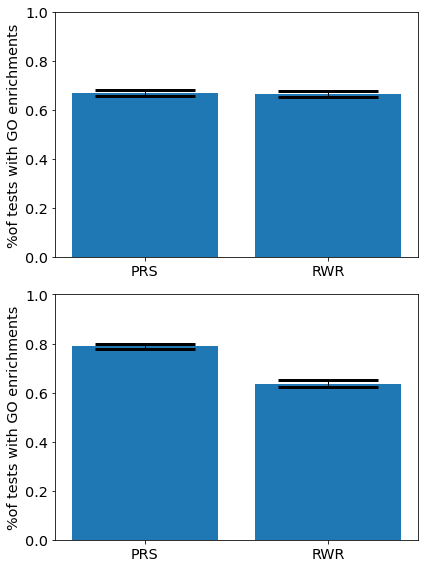

In [507]:
plot_rwr_prs_comp_go(ranked_goa_results,rwr_ranked_goa_results,
                     ranked_goa_results_rows,rwr_ranked_goa_results_rows)

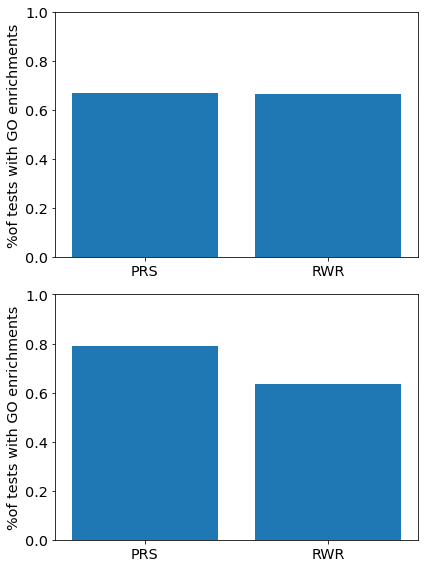

In [412]:
plot_rwr_prs_comp_go(ranked_goa_results,rwr_ranked_goa_results,
                     ranked_goa_results_rows,rwr_ranked_goa_results_rows,
                    filename='reports/figures/paper_figures_0423_pcc_only/fig6_vertical.pdf')

In [534]:
query_goatools(e_pcc.df.loc[e_pcc.df.orf_name.isin(['fet3','aft1','ymr057c'])],
               goea,geneid2name)


Run BP Gene Ontology Analysis: current study set of 3 IDs ... 67%      2 of      3 study items found in association
100%      3 of      3 study items found in population(4660)
Calculating 2,792 uncorrected p-values using fisher_scipy_stats
   2,792 GO terms are associated with  3,934 of  4,660 population items
      15 GO terms are associated with      2 of      3 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Run CC Gene Ontology Analysis: current study set of 3 IDs ... 67%      2 of      3 study items found in association
100%      3 of      3 study items found in population(4660)
Calculating 795 uncorrected p-values using fisher_scipy_stats
     795 GO terms are associated with  4,168 of  4,660 population items
       9 GO terms are associated with      2 of      3 st

In [626]:
objanno.get_id2gos()['S000003625']

5645 IDs in loaded association branch, BP


{'GO:0006355', 'GO:0045722', 'GO:0045944', 'GO:0061414', 'GO:2000218'}

In [629]:
obodag = GODag('data/raw/ontology/go-basic.obo')
objanno = GafReader('data/raw/ontology/sgd.gaf')
#    ns2assoc = objanno.get_ns2assc()

ns2assoc_excl = objanno.get_ns2assc( ev_exclude = {'HGI' , 'IGI'})

#bg = pd.read_csv('data/raw/ontology/', header=None)
sgd_info = pd.read_csv('data/raw/ontology/SGD_features.tab', sep='\t',header=None)
bg_list = e_pcc.df['Systematic gene name'].tolist()#list(bg.iloc[:, 0])  # .to_list()

geneid2name = pd.Series(sgd_info.iloc[:,3].values,index=sgd_info.iloc[:,0]).to_dict()

geneids = [i for i,j in geneid2name.items() if j in bg_list]
goeaobj = GOEnrichmentStudyNS(
    geneids,  # List of mouse protein-coding genes
    ns2assoc_excl,  # geneid/GO associations
    obodag,  # Ontologies
    propagate_counts=True,
    alpha=0.05,  # default significance cut-off
    methods=['fdr', 'bonferroni','fdr_bh','sm_bonferroni'], prt=None)

data/raw/ontology/go-basic.obo: fmt(1.2) rel(2019-06-01) 47,444 GO Terms
HMS:0:00:03.161379 119,640 annotations READ: data/raw/ontology/sgd.gaf 

Load BP Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact
Propagating term counts up: is_a
 84%  3,934 of  4,660 population items found in association

Load CC Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact
Propagating term counts up: is_a


2 GO IDs NOT FOUND IN ASSOCIATION: GO:0120213 GO:0106214
1 GO IDs NOT FOUND IN ASSOCIATION: GO:0062128
1 GO IDs NOT FOUND IN ASSOCIATION: GO:0106211


 89%  4,168 of  4,660 population items found in association

Load MF Gene Ontology Analysis ...
fisher module not installed.  Falling back on scipy.stats.fisher_exact
Propagating term counts up: is_a
 73%  3,399 of  4,660 population items found in association


In [566]:
sensors_df = e_pcc.df.loc[e_pcc.df.sens>np.quantile(e_pcc.df.sens,.99)]

In [568]:
components = [i for i in nx.connected_components(nx.induced_subgraph(e_pcc.graph_gc, sensors_df.orf_name))]

In [569]:
components

[{'mob2-19',
  'mob2-20',
  'mob2-24',
  'mob2-28',
  'mob2-34',
  'mob2-36',
  'mob2-38',
  'mob2-40',
  'mob2-8'},
 {'ubp2'},
 {'pch2', 'sps18', 'tan1', 'ynl046w'},
 {'idh1', 'idh2', 'irc14', 'mks1-supp1', 'rtg1', 'rtg2', 'rtg3'},
 {'agp1', 'bap2', 'dal81', 'rma1', 'stp1', 'stp2'},
 {'aft1', 'fet3', 'ymr057c'},
 {'ime1', 'ygl036w'},
 {'apt2', 'inm1', 'ypl109c'},
 {'erv46'},
 {'hsc82', 'ram1-supp1', 'sti1'},
 {'gal7', 'sip4', 'ycr062w'},
 {'csm2', 'tpo4'},
 {'mdh1'},
 {'fbp1', 'fum1', 'sdh5'},
 {'met7'},
 {'akr2', 'ypr039w'},
 {'rox1'}]

In [630]:
query = [i for i,j in geneid2name.items() if j in e_pcc.df.loc[e_pcc.df.orf_name.isin(['gal7', 'sip4', 'ycr061w']),'Systematic gene name'].tolist()]

In [606]:
query

['S000003625', 'S000000222', 'S000000657']

In [ ]:
apt2_cluster = [r.__dict__ for r in go_results_all if r.p_fdr<0.05]

In [631]:
go_results_all = goeaobj.run_study(query)


Run BP Gene Ontology Analysis: current study set of 3 IDs ...100%      3 of      3 study items found in association
100%      3 of      3 study items found in population(4660)
Calculating 4,794 uncorrected p-values using fisher_scipy_stats
   4,794 GO terms are associated with  3,934 of  4,660 population items
     100 GO terms are associated with      3 of      3 study items
fisher module not installed.  Falling back on scipy.stats.fisher_exact


Generate p-value distribution for FDR based on resampling (this might take a while)
Sample 0 / 500: p-value 0.0019305014562992215
Sample 10 / 500: p-value 4.218600439319112e-05
Sample 20 / 500: p-value 0.0012872772896914872
Sample 30 / 500: p-value 0.003216121129742329
Sample 40 / 500: p-value 0.0008420766514309955
Sample 50 / 500: p-value 0.0006437768240308454
Sample 60 / 500: p-value 0.002573449383234683
Sample 70 / 500: p-value 0.0006437768240308454
Sample 80 / 500: p-value 0.0006437768240308454
Sample 90 / 500: p-value 0.005784047498564515
Sample 100 / 500: p-value 0.009627661726566983
Sample 110 / 500: p-value 0.009627661726566983
Sample 120 / 500: p-value 0.0010928751357766643
Sample 130 / 500: p-value 0.002573449383234683
Sample 140 / 500: p-value 0.006425339233266281
Sample 150 / 500: p-value 0.011545748415103032
Sample 160 / 500: p-value 0.0006437768240308454
Sample 170 / 500: p-value 0.0003425867818154446
Sample 180 / 500: p-value 7.731389431910079e-06
Sample 190 / 500: p-val

  METHOD fdr:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): local fdr
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD bonferroni:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): local bonferroni
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD bonferroni:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels bonferroni
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (puri

Generate p-value distribution for FDR based on resampling (this might take a while)
Sample 0 / 500: p-value 0.0002842296596620539
Sample 10 / 500: p-value 0.002573449383234683
Sample 20 / 500: p-value 0.0006437768240308454
Sample 30 / 500: p-value 0.002573449383234683
Sample 40 / 500: p-value 0.0009520789115348913
Sample 50 / 500: p-value 0.01601164954818457
Sample 60 / 500: p-value 0.005142479880306274
Sample 70 / 500: p-value 0.004500636319010118
Sample 80 / 500: p-value 0.0006437768240308454
Sample 90 / 500: p-value 0.0019305014562992215
Sample 100 / 500: p-value 0.002573449383234683
Sample 110 / 500: p-value 0.002573449383234683
Sample 120 / 500: p-value 0.029959729363946454
Sample 130 / 500: p-value 0.0006437768240308454
Sample 140 / 500: p-value 0.01664853521211554
Sample 150 / 500: p-value 0.0006437768240308454
Sample 160 / 500: p-value 0.002573449383234683
Sample 170 / 500: p-value 0.0006437768240308454
Sample 180 / 500: p-value 0.0493892016648299
Sample 190 / 500: p-value 0.00

  METHOD fdr:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): local fdr
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD bonferroni:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): local bonferroni
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD bonferroni:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels bonferroni
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (puri

Generate p-value distribution for FDR based on resampling (this might take a while)
Sample 0 / 500: p-value 0.0019305014562992215
Sample 10 / 500: p-value 0.017921481973339728
Sample 20 / 500: p-value 0.0006437768240308454
Sample 30 / 500: p-value 0.0006437768240308454
Sample 40 / 500: p-value 0.0012872772896914872
Sample 50 / 500: p-value 0.002573449383234683
Sample 60 / 500: p-value 0.02236814392436974
Sample 70 / 500: p-value 0.0019305014562992215
Sample 80 / 500: p-value 0.0006437768240308454
Sample 90 / 500: p-value 0.017921481973339728
Sample 100 / 500: p-value 0.0006437768240308454
Sample 110 / 500: p-value 0.0006437768240308454
Sample 120 / 500: p-value 0.0006437768240308454
Sample 130 / 500: p-value 0.007160615596386988
Sample 140 / 500: p-value 0.0012872772896914872
Sample 150 / 500: p-value 0.0006437768240308454
Sample 160 / 500: p-value 0.005291026360886971
Sample 170 / 500: p-value 0.004500636319010118
Sample 180 / 500: p-value 0.0019305014562992215
Sample 190 / 500: p-val

  METHOD fdr:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): local fdr
       1 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD bonferroni:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): local bonferroni
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD bonferroni:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels bonferroni
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (puri

In [599]:
hsc82_cluster = [r.__dict__ for r in go_results_all if r.p_fdr<0.1]

In [608]:
gal7_cluster = [r.__dict__ for r in go_results_all if r.p_fdr<0.05]

In [632]:
[r.__dict__ for r in go_results_all if r.GO=='GO:0006012']

[{'GO': 'GO:0006012',
  'name': 'galactose metabolic process',
  'NS': 'BP',
  'depth': 6,
  'method_flds': [NtMethodInfo(source='local', method='fdr', fieldname='fdr'),
   NtMethodInfo(source='local', method='bonferroni', fieldname='bonferroni'),
   NtMethodInfo(source='statsmodels', method='fdr_bh', fieldname='fdr_bh'),
   NtMethodInfo(source='statsmodels', method='bonferroni', fieldname='sm_bonferroni')],
  'kws': {'p_uncorrected': 0.004500636319010118,
   'study_items': {'S000000222'},
   'pop_items': {'S000000222',
    'S000000223',
    'S000001610',
    'S000002416',
    'S000004071',
    'S000005354',
    'S000006169'},
   'ratio_in_study': (1, 3),
   'ratio_in_pop': (7, 4660)},
  'p_uncorrected': 0.004500636319010118,
  'study_items': {'S000000222'},
  'pop_items': {'S000000222',
   'S000000223',
   'S000001610',
   'S000002416',
   'S000004071',
   'S000005354',
   'S000006169'},
  'ratio_in_study': (1, 3),
  'ratio_in_pop': (7, 4660),
  'study_count': 1,
  'study_n': 3,
  'po

In [633]:
[r.__dict__ for r in go_results_all if r.GO=='GO:0019318']

[{'GO': 'GO:0019318',
  'name': 'hexose metabolic process',
  'NS': 'BP',
  'depth': 5,
  'method_flds': [NtMethodInfo(source='local', method='fdr', fieldname='fdr'),
   NtMethodInfo(source='local', method='bonferroni', fieldname='bonferroni'),
   NtMethodInfo(source='statsmodels', method='fdr_bh', fieldname='fdr_bh'),
   NtMethodInfo(source='statsmodels', method='bonferroni', fieldname='sm_bonferroni')],
  'kws': {'p_uncorrected': 0.020464078893217108,
   'study_items': {'S000000222'},
   'pop_items': {'S000000222',
    'S000000223',
    'S000000400',
    'S000000443',
    'S000000545',
    'S000001086',
    'S000001369',
    'S000001610',
    'S000001805',
    'S000001849',
    'S000001949',
    'S000002405',
    'S000002416',
    'S000002457',
    'S000003124',
    'S000003222',
    'S000003424',
    'S000003472',
    'S000003588',
    'S000003691',
    'S000003769',
    'S000003791',
    'S000003920',
    'S000004071',
    'S000004337',
    'S000004369',
    'S000004818',
    'S000

In [634]:
e_pcc.df

,orf_name,deg,eig_0,eig_1,eig_2,eig_3,eig_4,eig_5,eig_6,eig_7,...,smallest_eigenvec,Systematic gene name,Allele Gene name,num,cat,bin,group,cat_,neighbor_btw,neighbor_degree
0,dal82,14,-0.004483,0.002290,-0.000249,0.007585,0.001043,0.001293,-0.000919,0.002531,...,-0.000541,YNL314W,dal82,3804,nq.only,39,nonessential,Nonessential query,0.000905,7.500000
1,aac1,2,0.006890,0.003249,-0.000683,-0.011340,-0.000827,-0.002652,-0.002282,-0.001394,...,-0.000572,YMR056C,aac1,7874,na.nq,79,nonessential,Nonessential\nquery and array,0.001285,13.000000
2,qdr2,12,0.002414,0.000655,0.001012,-0.003385,-0.000754,0.004273,0.001614,0.001941,...,-0.000566,YIL121W,qdr2,4312,nq.nxes,44,nonessential,Nonessential query,0.000964,9.166667
3,dfg10,7,-0.002577,0.008337,0.001965,-0.000632,-0.000387,-0.001163,-0.001538,0.009146,...,-0.000563,YIL049W,dfg10,3143,nq.only,32,nonessential,Nonessential query,0.001676,15.571429
4,aac3,2,0.012193,0.011829,-0.003019,0.000688,0.003176,0.003662,0.002198,-0.002099,...,-0.000557,YBR085W,aac3,8202,na.nq.nxes,83,nonessential,Nonessential\nquery and array,0.002694,19.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5178,ynl043c,1,0.001501,-0.000267,0.000719,0.002262,-0.000297,-0.001172,-0.001266,0.002487,...,-0.000605,YNL043C,ynl043c,4306,na.only,44,nonessential,Nonessential array,0.000907,7.000000
5179,yol085c,1,-0.001289,-0.000328,0.000218,0.000486,0.001488,0.000432,-0.004300,0.000144,...,-0.000690,YOL085C,yol085c,4284,na.only,43,nonessential,Nonessential array,0.000386,2.000000
5180,yol035c,1,0.010385,0.002104,0.003196,0.000922,-0.001330,-0.000104,0.002990,0.001577,...,-0.000561,YOL035C,yol035c,4368,na.only,44,nonessential,Nonessential array,0.000549,3.000000
5181,yol159c,1,0.001442,0.008451,-0.001015,-0.000743,-0.005175,0.000402,-0.006308,0.000283,...,-0.000686,YOL159C,yol159c,7495,na.nq,75,nonessential,Nonessential\nquery and array,0.002272,11.000000
